# Problem: Can we accurately predict the number of collisions for any given day of the week?

##Introduction

You work as a product owner for a car insurance company offering a daily insurance policy for car rentals.   

The company operates in New York and wants to price its insurance to reflect collision risk and associated costs. It wants you to explore a new feature for development that will make better predictions about this. We will use New York traffic collision data to make estimates about the number of collisions on a given day.  

For this you require weather data as there has been a link between weather and traffic collisions. The company is using data given to them by the emergency services.

## Module 2: Get the data

This section contains boilerplate code. As long as you have uploaded your CSV files to your Google Drive, you can just run the cells as normal.

In [ ]:
# Importing necessary packages
import pandas as pd
import numpy as np
import seaborn as sn
import matplotlib.pyplot as plt

In [ ]:
#set the size of our plots as they are a little small by default.
plt.rcParams["figure.figsize"] = (20,5)

In [ ]:
# Link with google drive
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
# Get collated taxi trip and weather data from google drive
df = pd.read_csv('/content/gdrive/MyDrive/Colab Notebooks/LBD_New_York_collisions_and_weather_data.csv')

In [ ]:
# Rename headers for min and max to avoid mix-up with "min" and "max" functions
df = df.rename(columns={'max': 'maxtemp', 'min': 'mintemp'})

In [ ]:
df.head()

,day,year,mo,da,collision_date,temp,dewp,slp,visib,wdsp,mxpsd,gust,maxtemp,mintemp,prcp,sndp,fog,NUM_COLLISIONS
0,2,2013,1,1,01/01/2013,37.8,23.6,1011.9,10.0,6.1,8.9,19.0,39.9,33.1,0.0,999.9,0,381
1,3,2013,1,2,02/01/2013,27.1,10.5,1016.8,10.0,5.3,9.9,19.0,33.1,21.9,0.0,999.9,0,480
2,4,2013,1,3,03/01/2013,28.4,14.1,1020.6,10.0,3.7,8.0,15.0,32.0,24.1,0.0,999.9,0,549
3,5,2013,1,4,04/01/2013,33.4,18.6,1017.0,10.0,6.5,13.0,24.1,37.0,30.0,0.0,999.9,0,505
4,6,2013,1,5,05/01/2013,36.1,18.7,1020.6,10.0,6.6,12.0,21.0,42.1,32.0,0.0,999.9,0,389


## Module 3: Basic statistics and visualisations

To make the data easier to follow, the dates will be sorted in ascending order

In [ ]:
df = df.sort_values(["year", "mo", "da"], ascending = (True, True, True)) # order the data by year, month, day in ascending order.
df.head() # check the data again by viewing the first 5 rows

,day,year,mo,da,collision_date,temp,dewp,slp,visib,wdsp,mxpsd,gust,maxtemp,mintemp,prcp,sndp,fog,NUM_COLLISIONS
0,2,2013,1,1,01/01/2013,37.8,23.6,1011.9,10.0,6.1,8.9,19.0,39.9,33.1,0.0,999.9,0,381
1,3,2013,1,2,02/01/2013,27.1,10.5,1016.8,10.0,5.3,9.9,19.0,33.1,21.9,0.0,999.9,0,480
2,4,2013,1,3,03/01/2013,28.4,14.1,1020.6,10.0,3.7,8.0,15.0,32.0,24.1,0.0,999.9,0,549
3,5,2013,1,4,04/01/2013,33.4,18.6,1017.0,10.0,6.5,13.0,24.1,37.0,30.0,0.0,999.9,0,505
4,6,2013,1,5,05/01/2013,36.1,18.7,1020.6,10.0,6.6,12.0,21.0,42.1,32.0,0.0,999.9,0,389


In [ ]:
df.describe()  # Getting basic statistical values

,day,year,mo,da,temp,dewp,slp,visib,wdsp,mxpsd,gust,maxtemp,mintemp,prcp,sndp,fog,NUM_COLLISIONS
count,2191.000000,2191.000000,2191.000000,2191.000000,2191.000000,2191.000000,2191.000000,2191.000000,2191.000000,2191.000000,2191.000000,2191.000000,2191.000000,2191.000000,2191.000000,2191.000000,2191.000000
mean,4.000000,2015.500228,6.523962,15.726609,55.721086,41.120310,1107.412871,23.426654,50.871976,55.427704,384.628617,65.226974,47.875947,0.141031,920.095710,0.079416,602.121862
std,2.000457,1.707859,3.449207,8.800821,17.506851,19.298085,895.814069,118.917338,209.762963,208.768664,473.640573,18.156330,17.152164,0.353569,270.092092,0.270448,102.452173
min,1.000000,2013.000000,1.000000,1.000000,6.900000,-16.100000,992.100000,1.700000,0.000000,2.900000,14.000000,17.600000,-0.900000,0.000000,1.200000,0.000000,10.000000
25%,2.000000,2014.000000,4.000000,8.000000,41.550000,26.400000,1012.700000,8.500000,3.100000,7.000000,18.100000,50.000000,35.100000,0.000000,999.900000,0.000000,533.000000
50%,4.000000,2016.000000,7.000000,16.000000,56.900000,42.600000,1017.000000,9.800000,4.400000,8.900000,24.100000,66.900000,48.000000,0.000000,999.900000,0.000000,604.000000
75%,6.000000,2017.000000,10.000000,23.000000,71.900000,57.500000,1022.000000,10.000000,5.900000,11.100000,999.900000,82.000000,64.000000,0.080000,999.900000,0.000000,670.000000
max,7.000000,2018.000000,12.000000,31.000000,89.100000,74.800000,9999.900000,999.900000,999.900000,999.900000,999.900000,98.100000,82.900000,4.530000,999.900000,1.000000,1161.000000


It can be seen that there is a total of 2191 rows in the dataset. Next, we want to check for any correlations between any two columns.

<ipython-input-9-5658eb3851e9>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corrMatrix = df.corr() # Checking for linear relationships between two columns


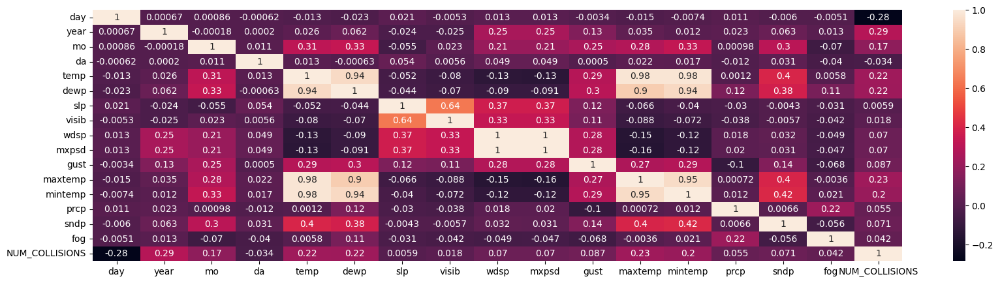

In [ ]:
corrMatrix = df.corr() # Checking for linear relationships between two columns
sn.heatmap(corrMatrix, annot=True)
plt.show()

At first glance, it can be seen that day, temp, dewp, maxtemp and mintemp have relatively strong correlations with NUM_COLLISIONS compared to the other variables (ignoring year, mo and da).

However, it is best to investigate these variables one by one

**Comparing day of the week to NUM_COLLISIONS**

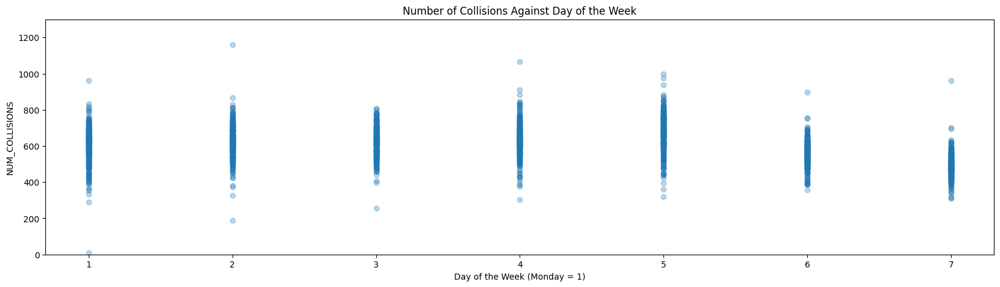

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df.day, df.NUM_COLLISIONS, alpha=0.3) # Visualise number of collisions against day
plt.title("Number of Collisions Against Day of the Week")
plt.xlabel("Day of the Week (Monday = 1)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

The plot above shows the overall number of collisions on a given day (Monday = 1) from 2013 to 2018. However, there are some outliers visible. This can be resolved using a box plot as shown below to determine upper and lower fences.

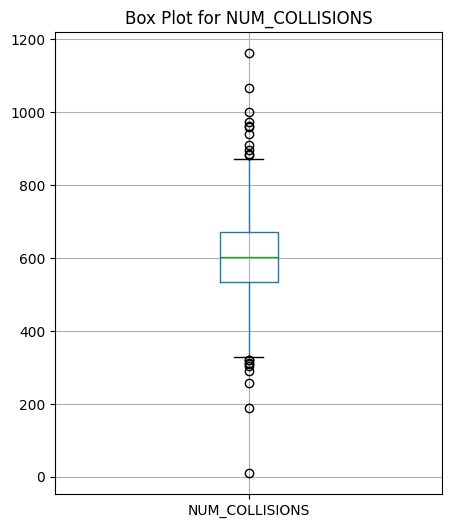

327.5 875.5


In [ ]:
df[['NUM_COLLISIONS']].boxplot(figsize=(5, 6)) # Creating box plot for overall NUM_COLLISIONS to determine outliers
plt.title("Box Plot for NUM_COLLISIONS")
plt.show()

Q1 = df["NUM_COLLISIONS"].quantile(0.25)
Q3 = df["NUM_COLLISIONS"].quantile(0.75)

IQR = Q3 - Q1
Lower_Fence = Q1 - (1.5 * IQR)
Upper_Fence = Q3 + (1.5 * IQR)

print(Lower_Fence, Upper_Fence)

As seen in the plot above, the outliers are found below 328 (lower fence) and above 876 (upper fence). A new, cleaned dataset was created below that excludes the outliers.

In [ ]:
print("Uncleaned data count")
print(df.count())
df_328_cleaned = df[df["NUM_COLLISIONS"] > 328] # Create a new dataframe keeping all datapoints where NUM_COLLISIONS are greater than 328
df_cleaned = df_328_cleaned[df_328_cleaned["NUM_COLLISIONS"] < 876] # Keep all datapoints where NUM_COLLISIONS are less than 876
print("==============")
print("Cleaned data count")
print(df_cleaned.count())

Uncleaned data count
day               2191
year              2191
mo                2191
da                2191
collision_date    2191
temp              2191
dewp              2191
slp               2191
visib             2191
wdsp              2191
mxpsd             2191
gust              2191
maxtemp           2191
mintemp           2191
prcp              2191
sndp              2191
fog               2191
NUM_COLLISIONS    2191
dtype: int64
Cleaned data count
day               2170
year              2170
mo                2170
da                2170
collision_date    2170
temp              2170
dewp              2170
slp               2170
visib             2170
wdsp              2170
mxpsd             2170
gust              2170
maxtemp           2170
mintemp           2170
prcp              2170
sndp              2170
fog               2170
NUM_COLLISIONS    2170
dtype: int64


As seen above, there are 21 datapoints that were considered outliers. I decided to ignore the outliers as this only accounted for just under 1% of the total number of datapoints. (21/2191 = 0.96%)

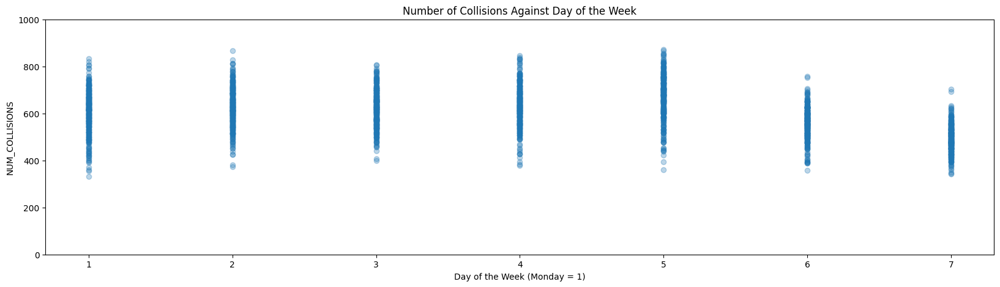

In [ ]:
plt.ylim(0, 1000)
plt.scatter(df_cleaned.day, df_cleaned.NUM_COLLISIONS, alpha=0.3)
plt.title("Number of Collisions Against Day of the Week")
plt.xlabel("Day of the Week (Monday = 1)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

As seen above, the data appears much cleaner than before. Another correlation matrix was plotted below to see if there are any changes.

<ipython-input-14-cf8c32d7dfdc>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corrMatrix = df_cleaned.corr() # Checking for linear relationships between two columns


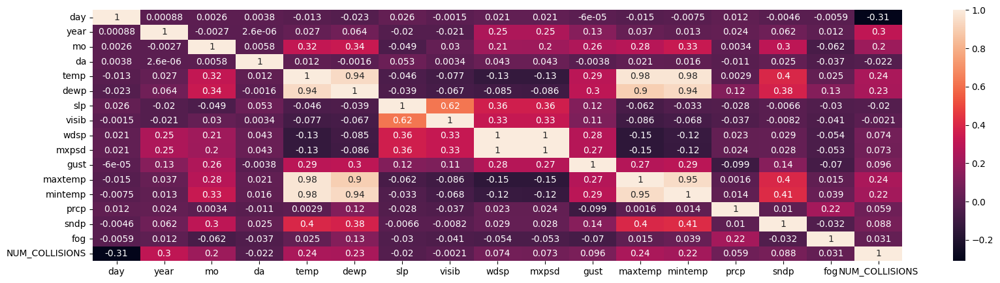

In [ ]:
corrMatrix = df_cleaned.corr() # Checking for linear relationships between two columns
sn.heatmap(corrMatrix, annot=True)
plt.show()

There are only slight changes to the correlation values. Nothing too significant. Further analysis was carried out below comparing the remaining variables (aside from year, mo and da) to NUM_COLLISIONS

**Comparing mean temperature to NUM_COLLISIONS for all years**

The mean temperature for each day from 2013 to 2018 was compared to NUM_COLLISIONS. The normal data is coloured orange and the outliers are blue

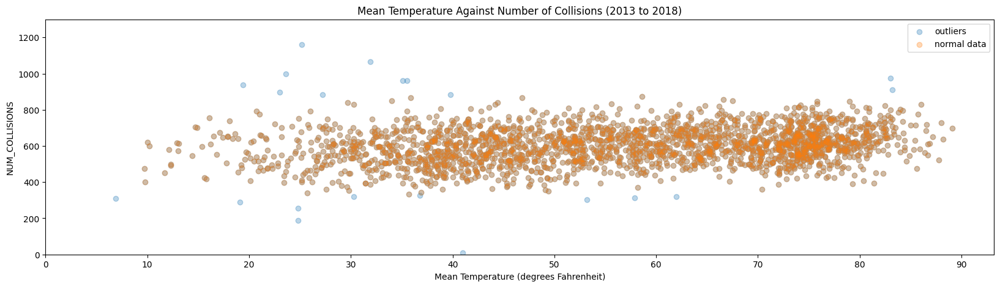

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df.temp, df.NUM_COLLISIONS, alpha=0.3, label='outliers') # Visualise noutliers
plt.scatter(df_cleaned.temp, df_cleaned.NUM_COLLISIONS, alpha=0.3, label='normal data') # Visualising number of collisions against temperature
plt.xticks(np.arange(0, 100, step=10))
plt.legend()
plt.title("Mean Temperature Against Number of Collisions (2013 to 2018)")
plt.xlabel("Mean Temperature (degrees Fahrenheit)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

As seen in the plot, there is a high density of collisions between 70 and 80 degrees Fahrenheit.

**Comparing mean dew point to NUM_COLLISIONS**

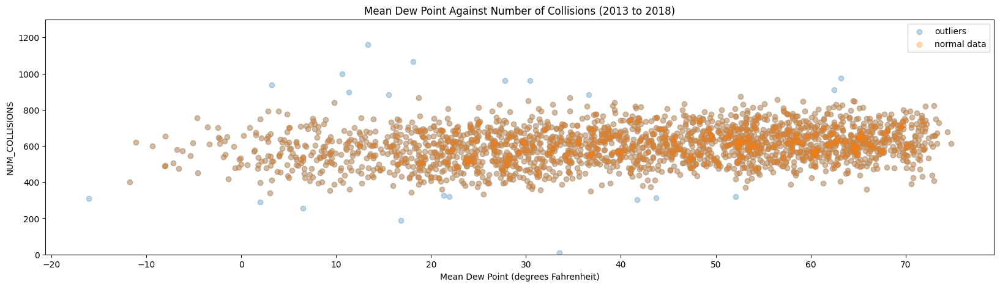

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df.dewp, df.NUM_COLLISIONS, alpha=0.3, label='outliers') # Visualising outliers
plt.scatter(df_cleaned.dewp, df_cleaned.NUM_COLLISIONS, alpha=0.3, label='normal data') # Visualising number of collisions against dew point
plt.xticks(np.arange(-20, 80, step=10))
plt.legend()
plt.title("Mean Dew Point Against Number of Collisions (2013 to 2018)")
plt.xlabel("Mean Dew Point (degrees Fahrenheit)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

Similar results to mean temperature, where the highest density of collisions are between 50 and 65 degrees Fahrenheit.

**Comparing mean sea level pressure to NUM_COLLISIONS**

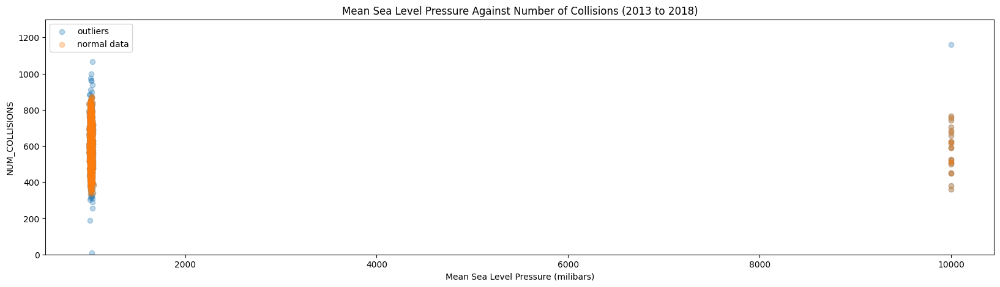

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df.slp, df.NUM_COLLISIONS, alpha=0.3, label='outliers') # Visualising outliers
plt.scatter(df_cleaned.slp, df_cleaned.NUM_COLLISIONS, alpha=0.3, label='normal data') # Visualising number of collisions against mean slp
# plt.xticks(np.arange(-20, 80, step=10))
plt.title("Mean Sea Level Pressure Against Number of Collisions (2013 to 2018)")
plt.xlabel("Mean Sea Level Pressure (milibars)")
plt.ylabel("NUM_COLLISIONS")
plt.legend()
plt.show()

As seen above, there are some missing datapoints present (slp = 9999.9). This will be investigated later on per year.

**Comparing mean visibility to NUM_COLLISIONS**

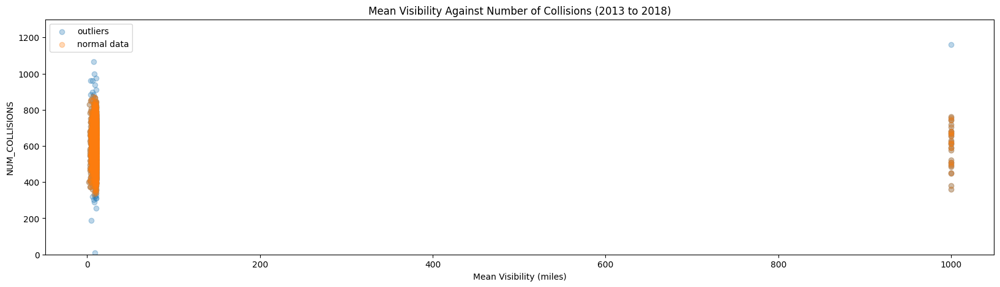

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df.visib, df.NUM_COLLISIONS, alpha=0.3, label='outliers') # Visualising outliers
plt.scatter(df_cleaned.visib, df_cleaned.NUM_COLLISIONS, alpha=0.3, label='normal data') # Visualising number of collisions against mean visibility
plt.legend()
plt.title("Mean Visibility Against Number of Collisions (2013 to 2018)")
plt.xlabel("Mean Visibility (miles)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

Again, there are some missing datapoints (visib = 999.9) which will be investigated further.

**Comparing mean wind speed to NUM_COLLISIONS**

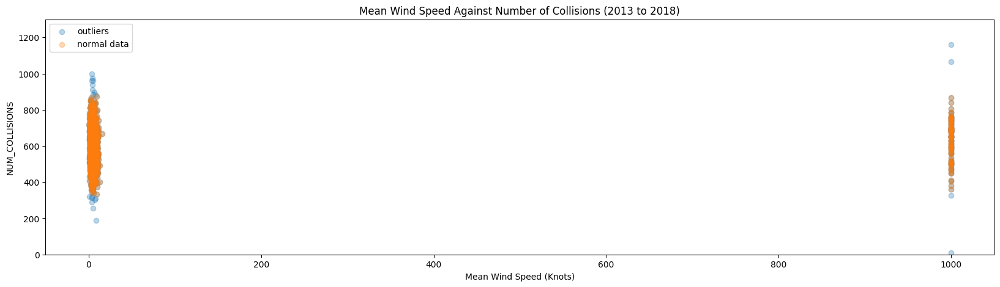

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df.wdsp, df.NUM_COLLISIONS, alpha=0.3, label='outliers') # Visualising outliers
plt.scatter(df_cleaned.wdsp, df_cleaned.NUM_COLLISIONS, alpha=0.3, label='normal data') # Visualising number of collisions against mean wind speed
# plt.xticks(np.arange(-20, 80, step=10))
plt.legend()
plt.title("Mean Wind Speed Against Number of Collisions (2013 to 2018)")
plt.xlabel("Mean Wind Speed (Knots)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

Missing datapoints (wdsp = 999.9) to be investigated further.

**Comparing maximum sustained wind speed to NUM_COLLISIONS**

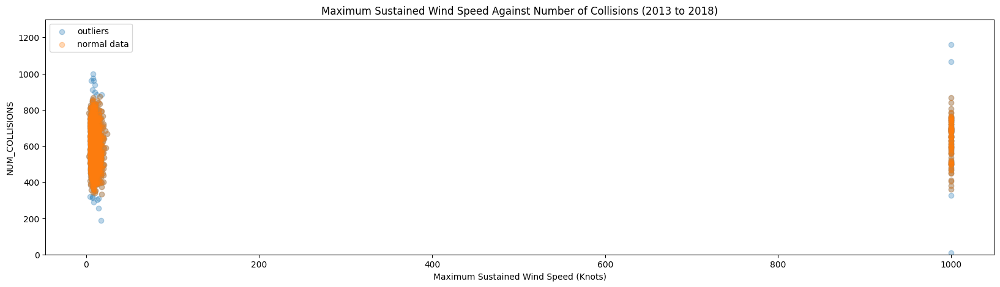

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df.mxpsd, df.NUM_COLLISIONS, alpha=0.3, label='outliers') # Visualising outliers
plt.scatter(df_cleaned.mxpsd, df_cleaned.NUM_COLLISIONS, alpha=0.3, label='normal data') # Visualising number of collisions against max wind speed
# plt.xticks(np.arange(-20, 80, step=10))
plt.legend()
plt.title("Maximum Sustained Wind Speed Against Number of Collisions (2013 to 2018)")
plt.xlabel("Maximum Sustained Wind Speed (Knots)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

Missing datapoints (mxpsd = 999.9) to be investigated further.

**Comparing maximum wind gust to NUM_COLLISIONS**

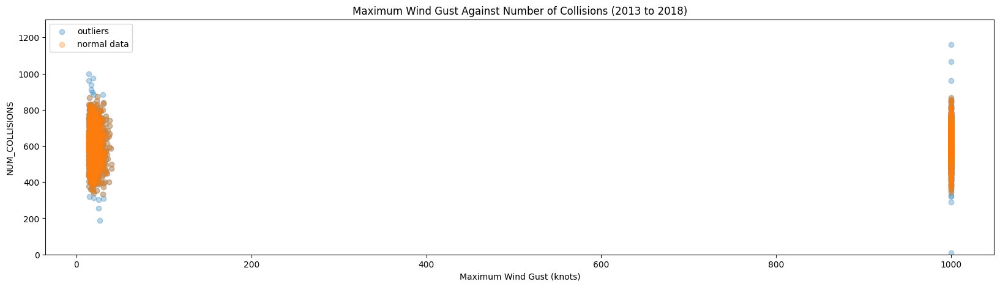

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df.gust, df.NUM_COLLISIONS, alpha=0.3, label='outliers') # Visualising outliers
plt.scatter(df_cleaned.gust, df_cleaned.NUM_COLLISIONS, alpha=0.3, label='normal data') # Visualising number of collisions against max wind gust
# plt.xticks(np.arange(-20, 80, step=10))
plt.legend()
plt.title("Maximum Wind Gust Against Number of Collisions (2013 to 2018)")
plt.xlabel("Maximum Wind Gust (knots)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

Missing datapoints (gust=999.9) to be investigated further.

**Comparing max temperature to NUM_COLLISIONS**

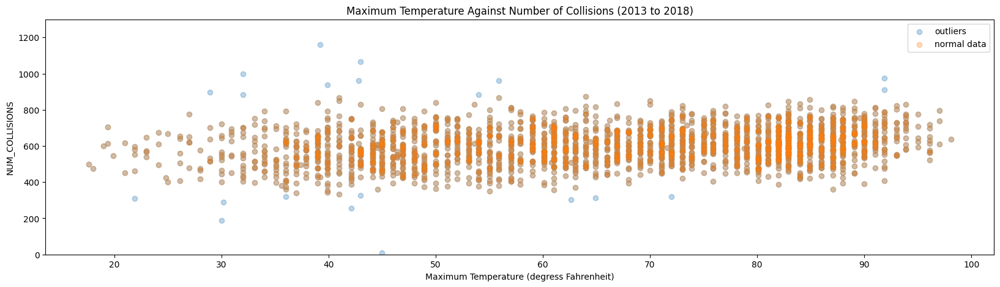

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df.maxtemp, df.NUM_COLLISIONS, alpha=0.3, label='outliers') # Visualising outliers
plt.scatter(df_cleaned.maxtemp, df_cleaned.NUM_COLLISIONS, alpha=0.3, label='normal data') # Visualising number of collisions against max temp
# plt.xticks(np.arange(-20, 80, step=10))
plt.legend()
plt.title("Maximum Temperature Against Number of Collisions (2013 to 2018)")
plt.xlabel("Maximum Temperature (degress Fahrenheit)")
plt.ylabel("NUM_COLLISIONS")
plt.show()
plt.show()

No missing data points

**Comparing min temperature to NUM_COLLISIONS**

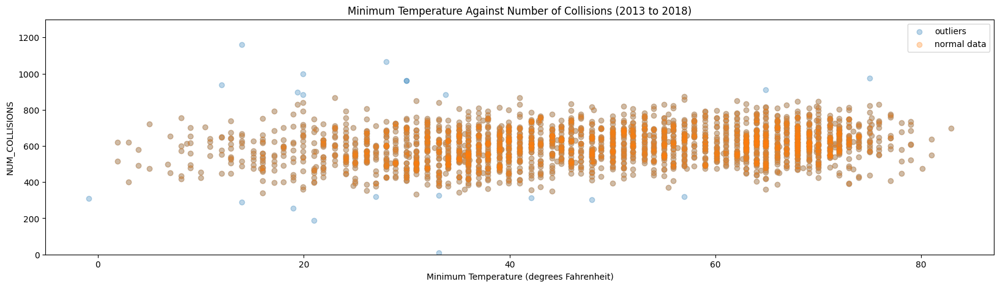

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df.mintemp, df.NUM_COLLISIONS, alpha=0.3, label='outliers') # Visualising outliers
plt.scatter(df_cleaned.mintemp, df_cleaned.NUM_COLLISIONS, alpha=0.3, label='normal data') # Visualising number of collisions against min temp
# plt.xticks(np.arange(-20, 80, step=10))
plt.legend()
plt.title("Minimum Temperature Against Number of Collisions (2013 to 2018)")
plt.xlabel("Minimum Temperature (degrees Fahrenheit)")
plt.ylabel("NUM_COLLISIONS")
plt.show()
plt.show()

No missing data points

**Comparing total precipiation to NUM_COLLISIONS**

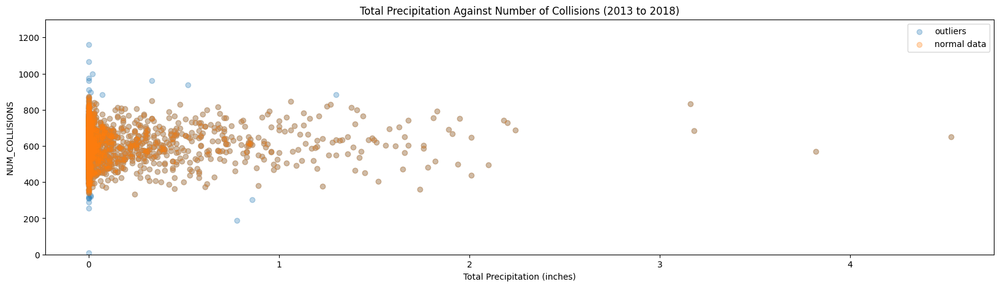

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df.prcp, df.NUM_COLLISIONS, alpha=0.3, label='outliers') # Visualising outliers
plt.scatter(df_cleaned.prcp, df_cleaned.NUM_COLLISIONS, alpha=0.3, label='normal data') # Visualising number of collisions against total prcp
# plt.xticks(np.arange(-20, 80, step=10))
plt.legend()
plt.title("Total Precipitation Against Number of Collisions (2013 to 2018)")
plt.xlabel("Total Precipitation (inches)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

No missing data points, but high density at lower precipitations. It might just be because the precipitation for any day is most likely below one inch.

**Comparing snow depth to NUM_COLLISIONS**

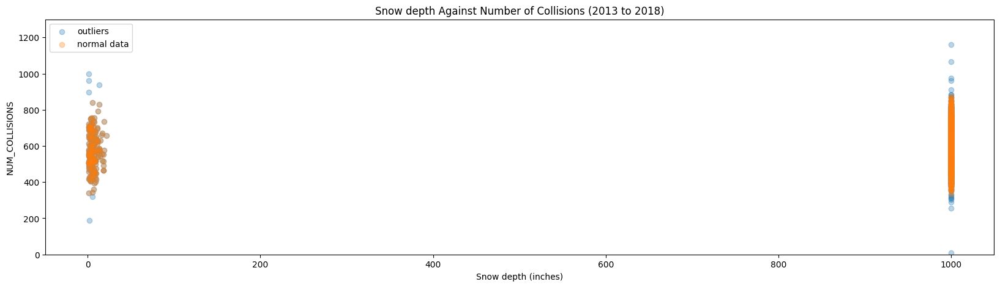

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df.sndp, df.NUM_COLLISIONS, alpha=0.3, label='outliers') # Visualising outliers
plt.scatter(df_cleaned.sndp, df_cleaned.NUM_COLLISIONS, alpha=0.3, label='normal data') # Visualising number of collisions against snow depth
# plt.xticks(np.arange(-20, 80, step=10))
plt.legend()
plt.title("Snow depth Against Number of Collisions (2013 to 2018)")
plt.xlabel("Snow depth (inches)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

A lot of missing data points. Will be investigated further

**Fog vs num_collisions**

This data is unique as it is a binary variable (no fog = 0, presence of fog = 1)

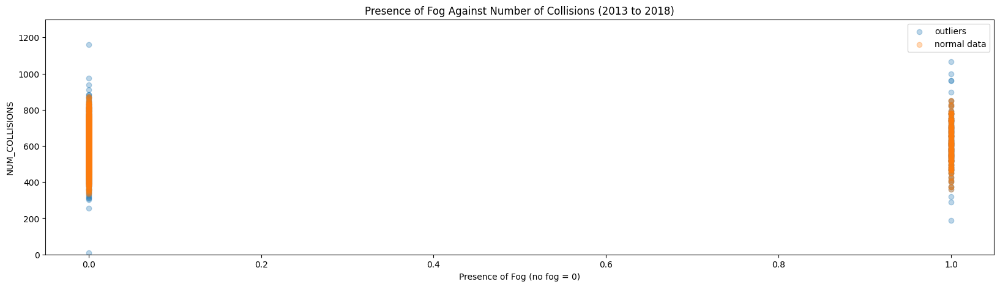

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df.fog, df.NUM_COLLISIONS, alpha=0.3, label='outliers') # Visualising outliers
plt.scatter(df_cleaned.fog, df_cleaned.NUM_COLLISIONS, alpha=0.3, label='normal data') # Visualising number of collisions against fog
# plt.xticks(np.arange(-20, 80, step=10))
plt.legend()
plt.title("Presence of Fog Against Number of Collisions (2013 to 2018)")
plt.xlabel("Presence of Fog (no fog = 0)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

At face value, there is no apparent correlation between the two variables. However, the good news is that there does not appear to be any missing data.

The number of missing datapoints for the problematic variables is seen below:

In [ ]:
# Finding number of missing values for problematic columns
print("slp: ", (df['slp']> 1500).sum())
print("visib: ", (df['visib']> 100).sum())
print("wdsp: ", (df['wdsp']> 100).sum())
print("mxpsd: ", (df['mxpsd']> 100).sum())
print("gust: ", (df['gust']> 100).sum())
print("sndp: ", (df['sndp']> 200).sum())

slp:  22
visib:  32
wdsp:  102
mxpsd:  102
gust:  815
sndp:  2015


**As** seen above, slp and visib have very little missing values (±1% relative to number of datapoints). wdsp and mxpsd have quite a bit more, while gust and sndp have way too many missing data points to be usable.

We could most likely get away with either ignoring the missing datapoints or changing their values to the mean value for slp and visib, and doing the latter for wdsp and mxpsd. Doing either of these things to gust and sndp would just remove way too many datapoints or skew the data too much such that it does not represent the actual conditions. As a result, as of this point **we will be ignoring gust and sndp.**

Next, we will proceed with analysing the data by year to further clean the data.

**Creating 2013 dataframe**

In [ ]:
# Creating dataset for 2013
df_2013 = df_cleaned[df_cleaned["year"] == 2013]

<ipython-input-29-3c1a144c4cf6>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corrMatrix = df_2013.corr() # 2013 correlation matrix


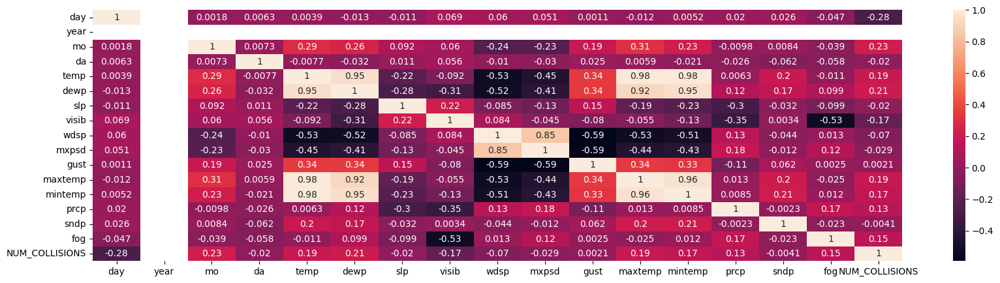

In [ ]:
corrMatrix = df_2013.corr() # 2013 correlation matrix
sn.heatmap(corrMatrix, annot=True)
plt.show()

**2013 day of the week vs num_collisions**

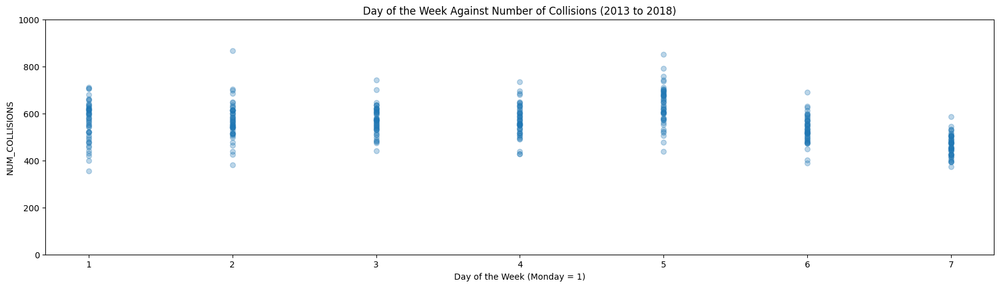

In [ ]:
plt.ylim(0, 1000)
plt.scatter(df_2013.day, df_2013.NUM_COLLISIONS, alpha=0.3)
plt.title("Day of the Week Against Number of Collisions (2013 to 2018)")
plt.xlabel("Day of the Week (Monday = 1)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

Looking at the plot above, it might be possible to switch the days around to obtain a better correlation

In [ ]:
df_2013.loc[df_2013['day'] > 0, 'day'] = df_2013['day']+2 # change all days by adding 2 so that Saturday = 1.
df_2013.loc[df_2013['day'] == 9, 'day'] = 2 # change days that equal 9 to day 2
df_2013.loc[df_2013['day'] == 8, 'day'] = 1 # change days that equal 8 to day 1

<ipython-input-31-aba01374a4e6>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2013.loc[df_2013['day'] > 0, 'day'] = df_2013['day']+2 # change all days by adding 2 so that Saturday = 1.


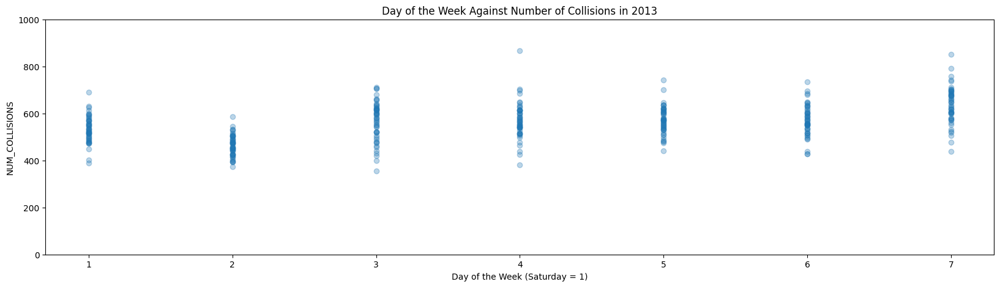

In [ ]:
plt.ylim(0, 1000)
plt.scatter(df_2013.day, df_2013.NUM_COLLISIONS, alpha=0.3)
plt.title("Day of the Week Against Number of Collisions in 2013")
plt.xlabel("Day of the Week (Saturday = 1)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

Strongest correlation when Saturday = 1 (0.46)

<ipython-input-33-3c1a144c4cf6>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corrMatrix = df_2013.corr() # 2013 correlation matrix


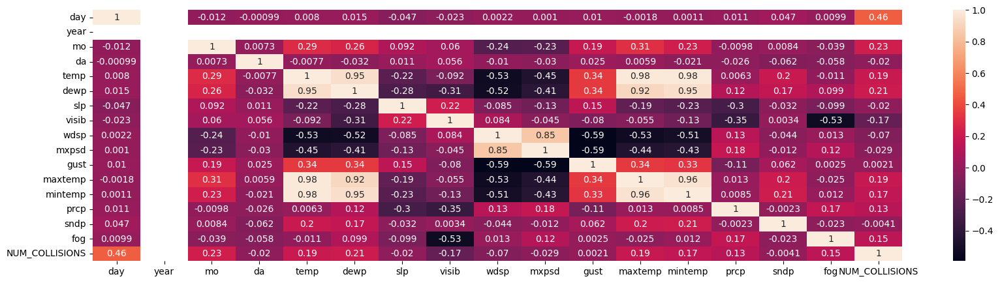

In [ ]:
corrMatrix = df_2013.corr() # 2013 correlation matrix
sn.heatmap(corrMatrix, annot=True)
plt.show()

**2013 temp vs num_collisions**

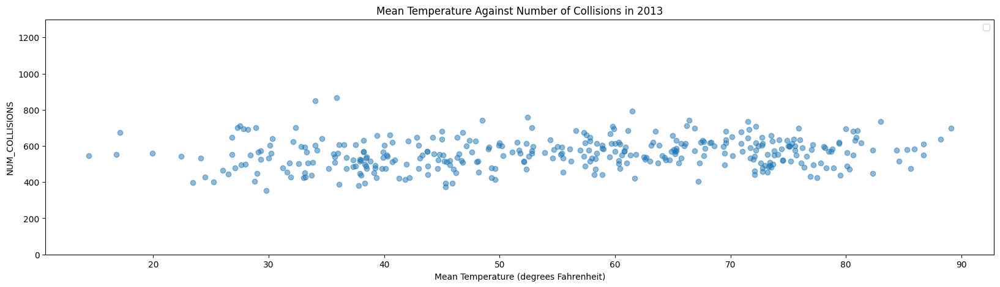

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2013.temp, df_2013.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Mean Temperature Against Number of Collisions in 2013")
plt.xlabel("Mean Temperature (degrees Fahrenheit)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

No missing data, but doesn't seem to show the same relationship as with the previously collated data (high density at 70-80 degreess)

**2013 dewp vs num_collisions**

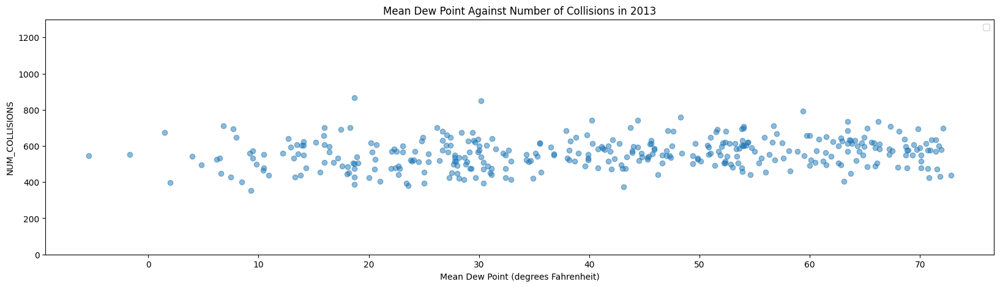

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2013.dewp, df_2013.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Mean Dew Point Against Number of Collisions in 2013")
plt.xlabel("Mean Dew Point (degrees Fahrenheit)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

No missing data but also no clear relationship between the two.

**2013 slp vs num_collisions**

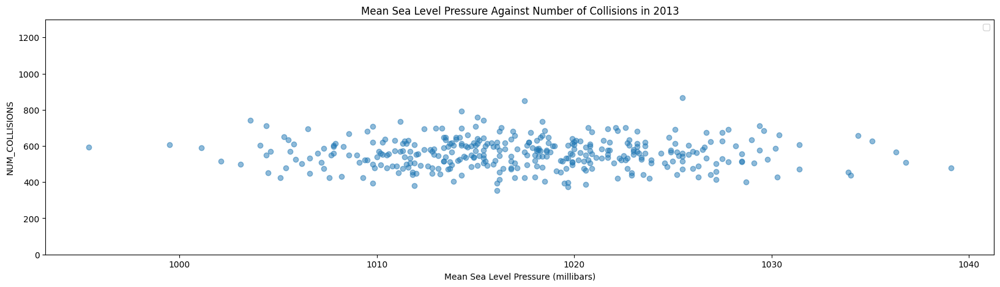

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2013.slp, df_2013.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Mean Sea Level Pressure Against Number of Collisions in 2013")
plt.xlabel("Mean Sea Level Pressure (millibars)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

No missing datapoints in 2013 but no clear correlation between the two variables.

**2013 visib vs num_collisions**

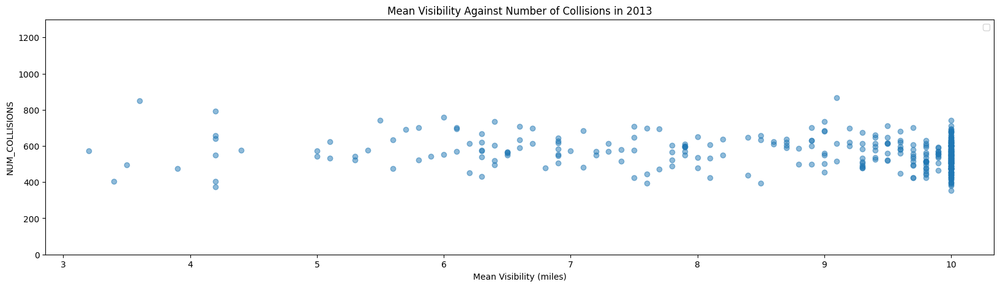

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2013.visib, df_2013.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Mean Visibility Against Number of Collisions in 2013")
plt.xlabel("Mean Visibility (miles)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

No missing datapoints, but oddly enough most collisions occur when visibility is at 10 miles. This may imply that visibility does not really have much effect on number of collisions (although we cannot say for certain right now) or that New York just has good visibility in general.

**2013 wind speed vs num_collisions**

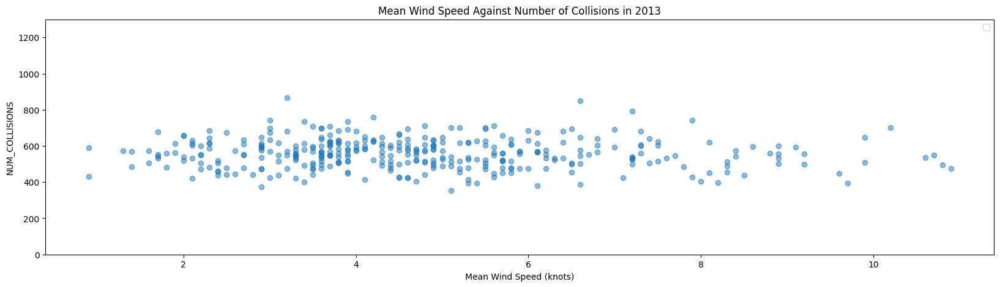

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2013.wdsp, df_2013.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Mean Wind Speed Against Number of Collisions in 2013")
plt.xlabel("Mean Wind Speed (knots)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

No missing datapoints in 2013. Most collisions occur when wind speed is between 3 and 6 knots. There is no clear correlation between the two variables but the data may imply that the mean wind speeds in New York rarely go above 8 knots.

**2013 max wind speed vs num_collisions**

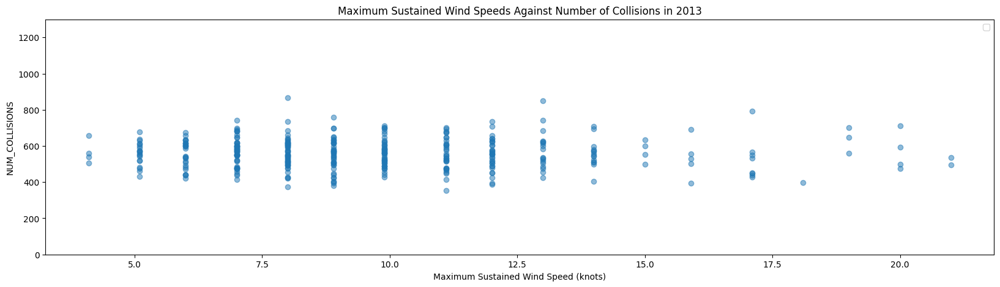

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2013.mxpsd, df_2013.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Maximum Sustained Wind Speeds Against Number of Collisions in 2013")
plt.xlabel("Maximum Sustained Wind Speed (knots)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

No missing datapoints in 2013. Most collisions occur when the max wind speed is between 5 to 12 knots, implying the max wind speeds in New York rarely go above this threshold.

**2013 gust vs num_collisions**

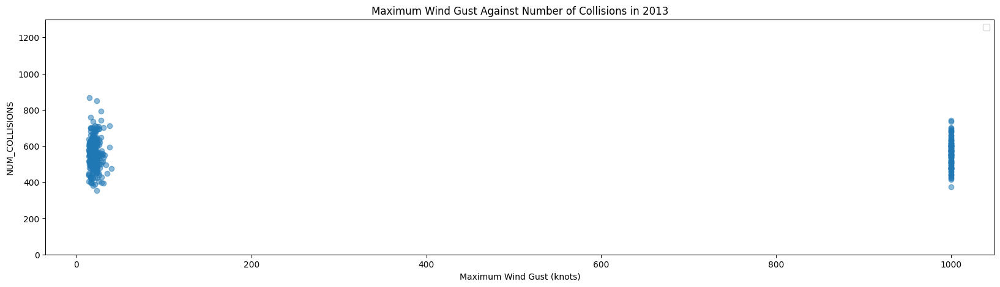

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2013.gust, df_2013.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Maximum Wind Gust Against Number of Collisions in 2013")
plt.xlabel("Maximum Wind Gust (knots)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

Missing datapoints present

In [ ]:
# Finding number of missing datapoints
print(df_2013["gust"].count())
df_2013_gusttest = df_2013[df_2013["gust"] < 200]
print(df_2013_gusttest["gust"].count())

364
247


Lots of missing datapoints in 2013 for gust. As seen above, there are 117 missing datapoints. Hence, it is best to just ignore gust for this analysis as mentioned previously.

**2013 maxtemp vs num_collisions**

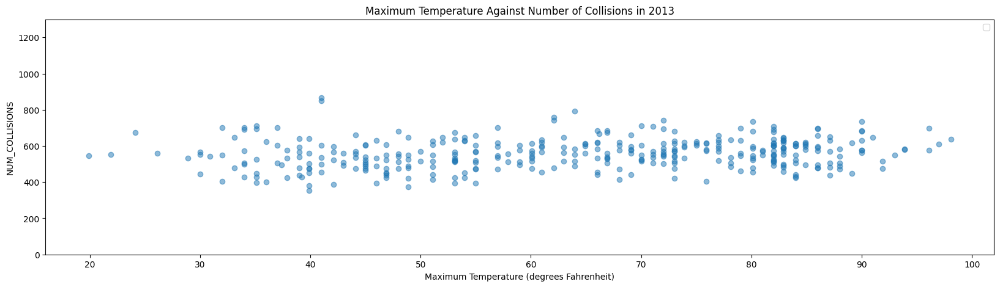

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2013.maxtemp, df_2013.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Maximum Temperature Against Number of Collisions in 2013")
plt.xlabel("Maximum Temperature (degrees Fahrenheit)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

No missing datapoints in 2013 but no clear correlations between the two variables

**2013 mintemp vs num_collisions**

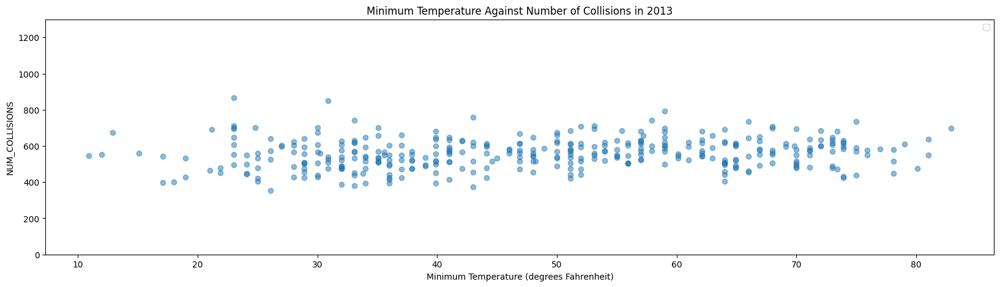

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2013.mintemp, df_2013.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Minimum Temperature Against Number of Collisions in 2013")
plt.xlabel("Minimum Temperature (degrees Fahrenheit)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

No missing datapoints in 2013 but no clear correlations between the two variables

**2013 prcp vs num_collisions**

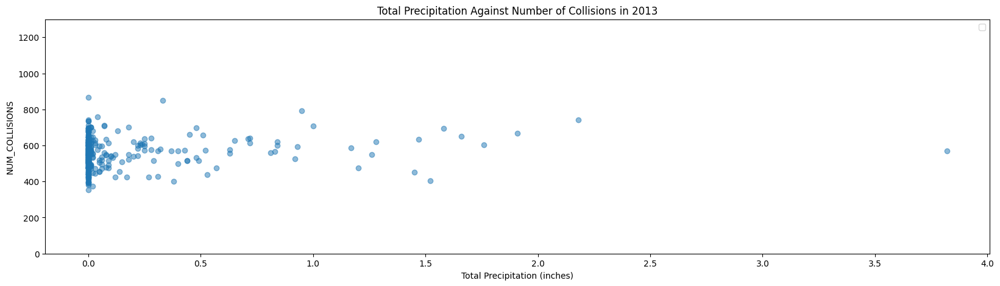

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2013.prcp, df_2013.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Total Precipitation Against Number of Collisions in 2013")
plt.xlabel("Total Precipitation (inches)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

No missing datapoints in 2013, but again the total precipitation in New York for any given day is most likely going to be less than one inch.

**Viewing all data**

A plot was created below to view how each variable looks like when plotted against another variable. Only the bottom row is relevant to this analysis.

/usr/local/lib/python3.10/dist-packages/pandas/plotting/_matplotlib/misc.py:101: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax.set_xlim(boundaries_list[j])
/usr/local/lib/python3.10/dist-packages/pandas/plotting/_matplotlib/misc.py:102: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim(boundaries_list[i])
/usr/local/lib/python3.10/dist-packages/pandas/plotting/_matplotlib/misc.py:92: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax.set_xlim(boundaries_list[i])


array([[<Axes: xlabel='day', ylabel='day'>,
        <Axes: xlabel='year', ylabel='day'>,
        <Axes: xlabel='mo', ylabel='day'>,
        <Axes: xlabel='da', ylabel='day'>,
        <Axes: xlabel='temp', ylabel='day'>,
        <Axes: xlabel='dewp', ylabel='day'>,
        <Axes: xlabel='slp', ylabel='day'>,
        <Axes: xlabel='visib', ylabel='day'>,
        <Axes: xlabel='wdsp', ylabel='day'>,
        <Axes: xlabel='mxpsd', ylabel='day'>,
        <Axes: xlabel='gust', ylabel='day'>,
        <Axes: xlabel='maxtemp', ylabel='day'>,
        <Axes: xlabel='mintemp', ylabel='day'>,
        <Axes: xlabel='prcp', ylabel='day'>,
        <Axes: xlabel='sndp', ylabel='day'>,
        <Axes: xlabel='fog', ylabel='day'>,
        <Axes: xlabel='NUM_COLLISIONS', ylabel='day'>],
       [<Axes: xlabel='day', ylabel='year'>,
        <Axes: xlabel='year', ylabel='year'>,
        <Axes: xlabel='mo', ylabel='year'>,
        <Axes: xlabel='da', ylabel='year'>,
        <Axes: xlabel='temp', ylabel='year'>

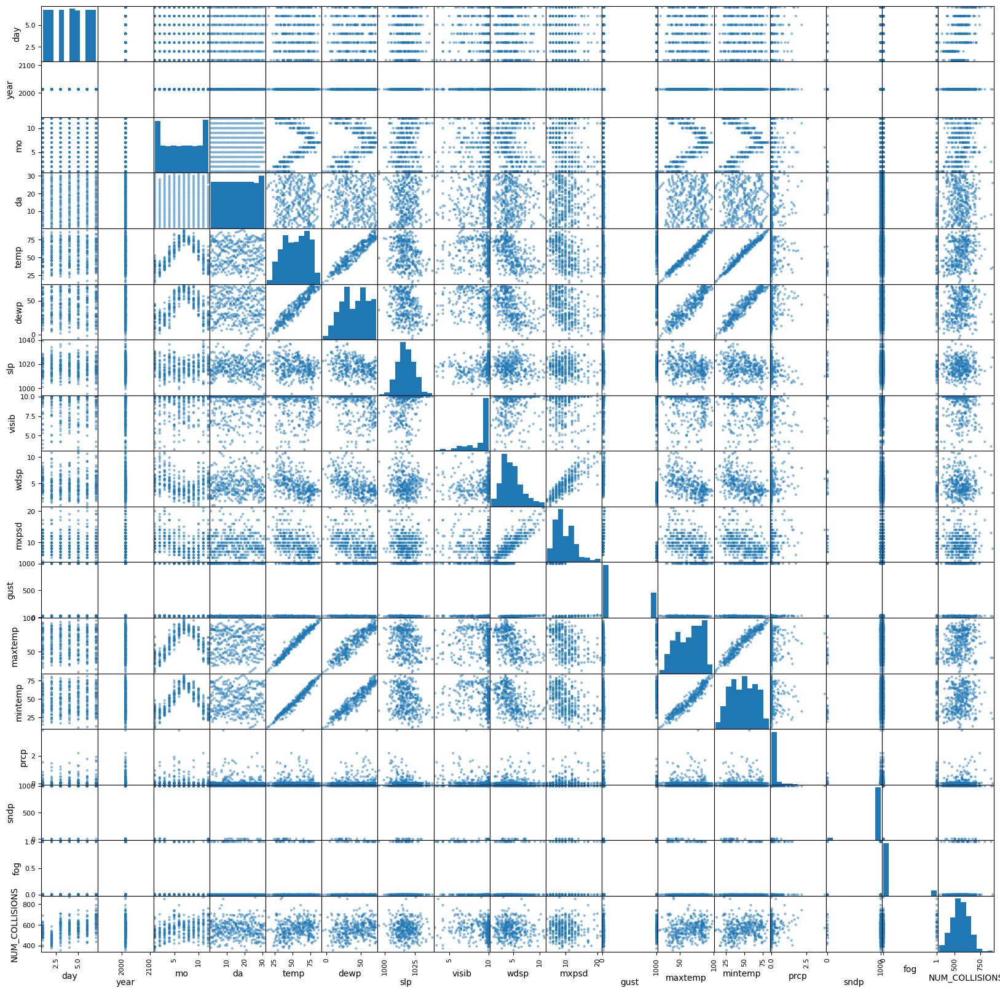

In [ ]:
plt.rcParams["figure.figsize"] = (20,20) # set size of plot again to make it big and square to make it visible.
pd.plotting.scatter_matrix(df_2013) # plot the scatter matrix

**Collisions each day across 2013**

A plot showing the number of collisions each day across 2013 is shown below

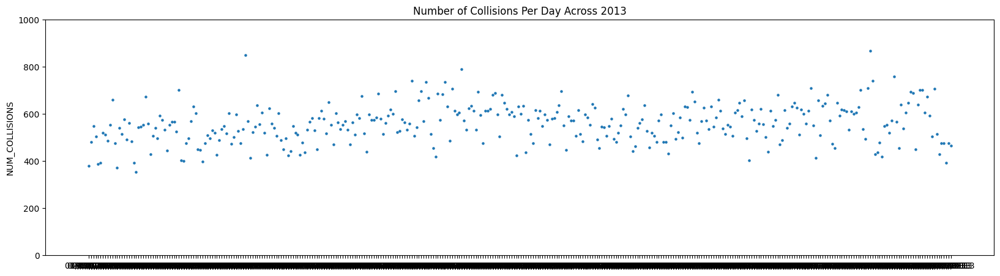

In [ ]:
plt.rcParams["figure.figsize"] = (20,5)
plt.ylim(0, 1000)
plt.scatter(df_2013.collision_date, df_2013.NUM_COLLISIONS, s=5)
plt.title("Number of Collisions Per Day Across 2013")
plt.ylabel("NUM_COLLISIONS")
plt.show()

The plot may not provide much use as of now, but it is interesting to see the change in the total number of collisions per day across 2013.

As seen above, there is a general rise in the number of collisions at the start of the year with a slight drop at the start of summer until fall. It then rises back up towards winter where at December it drops off again.

**Final Correlation Matrix**

The plot below shows the final correlation matrix for 2013 post-cleaning. As seen below, day and NUM_COLLISIONS has the strongest correlation compared to the other variables against NUM_COLLISIONS.

<ipython-input-47-3c1a144c4cf6>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corrMatrix = df_2013.corr() # 2013 correlation matrix


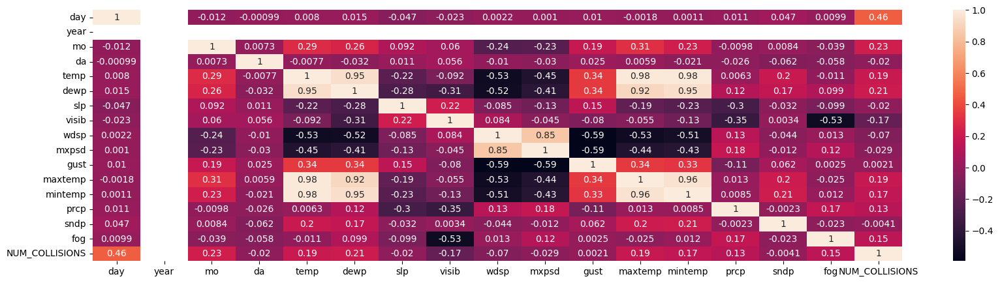

In [ ]:
corrMatrix = df_2013.corr() # 2013 correlation matrix
sn.heatmap(corrMatrix, annot=True)
plt.show()

The same analysis was done for 2014 to 2018.

**Creating 2014 dataset**

In [ ]:
# Creating dataset for 2014
df_2014 = df_cleaned[df_cleaned["year"] == 2014]

<ipython-input-49-7d47776ebb00>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corrMatrix = df_2014.corr() # 2014 correlation matrix


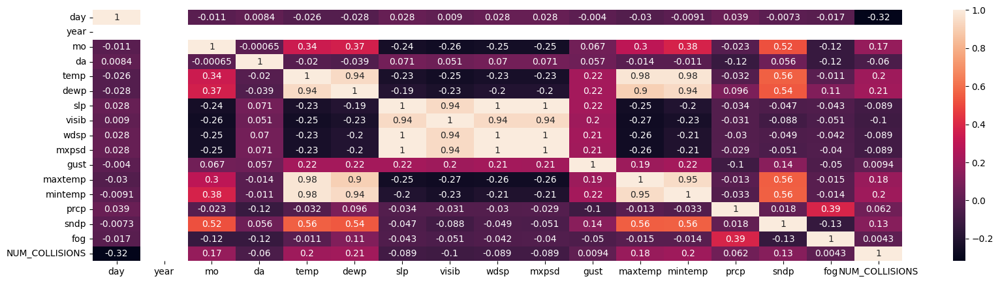

In [ ]:
corrMatrix = df_2014.corr() # 2014 correlation matrix
sn.heatmap(corrMatrix, annot=True)
plt.show()

Strongest correlations still with day, temp, dewp, maxtemp and mintemp as with 2013.

**2014 day of the week vs num_collisions**

Switching the days around first to improve correlation value

<ipython-input-50-bbc1415a09bd>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2014.loc[df_2014['day'] > 0, 'day'] = df_2014['day']+2 # change all days by adding 2 so that Saturday = 1.


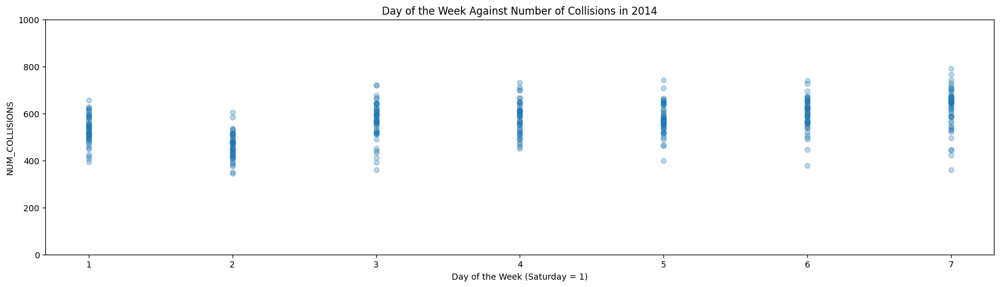

In [ ]:
df_2014.loc[df_2014['day'] > 0, 'day'] = df_2014['day']+2 # change all days by adding 2 so that Saturday = 1.
df_2014.loc[df_2014['day'] == 9, 'day'] = 2 # change days that equal 9 to day 2
df_2014.loc[df_2014['day'] == 8, 'day'] = 1 # change days that equal 8 to day 1
plt.ylim(0, 1000)
plt.scatter(df_2014.day, df_2014.NUM_COLLISIONS, alpha=0.3)
plt.title("Day of the Week Against Number of Collisions in 2014")
plt.xlabel("Day of the Week (Saturday = 1)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

<ipython-input-51-b00f9ecdb3e0>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corrMatrix = df_2014.corr() # 2013 correlation matrix


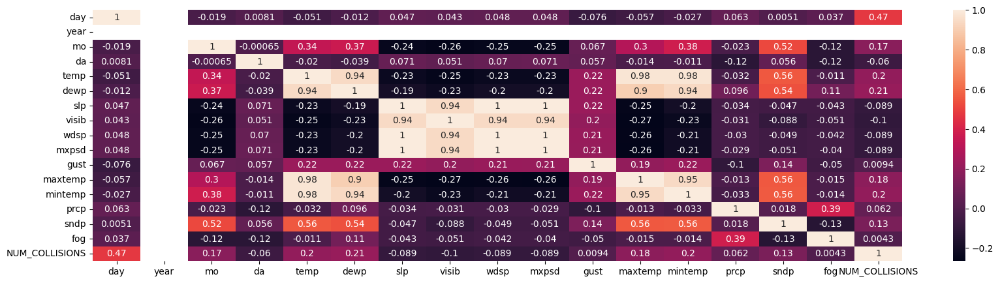

In [ ]:
corrMatrix = df_2014.corr() # 2013 correlation matrix
sn.heatmap(corrMatrix, annot=True)
plt.show()

All correlations similar to 2013. Strongest correlation for day when Saturday = 1 again. Now, I will look for any missing data for each variable through the analysis below.

**2014 temp vs num_collisions**

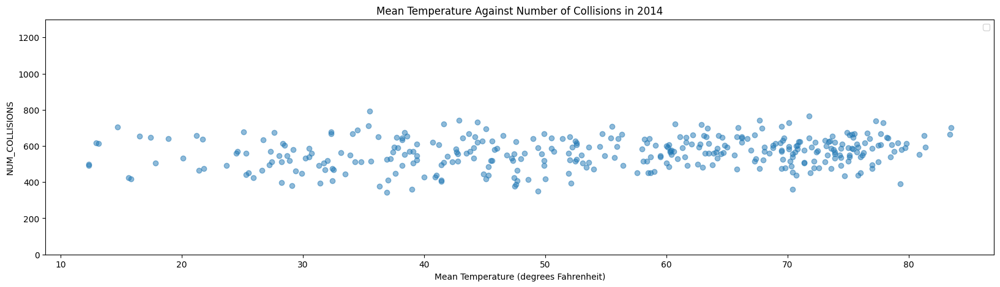

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2014.temp, df_2014.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Mean Temperature Against Number of Collisions in 2014")
plt.xlabel("Mean Temperature (degrees Fahrenheit)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**2014 dewp vs num_collisions**

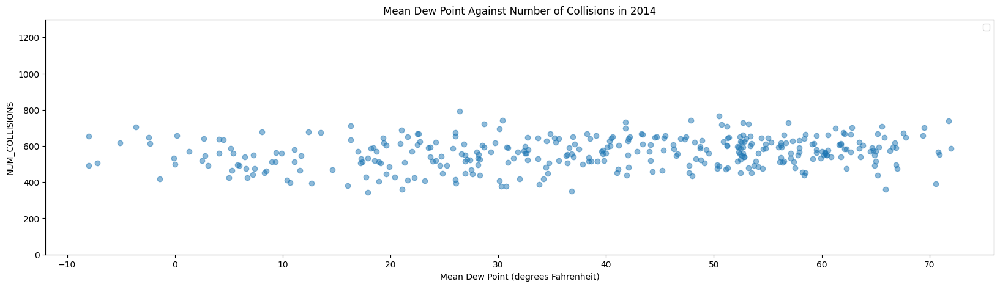

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2014.dewp, df_2014.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Mean Dew Point Against Number of Collisions in 2014")
plt.xlabel("Mean Dew Point (degrees Fahrenheit)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**2014 slp vs num_collisions**

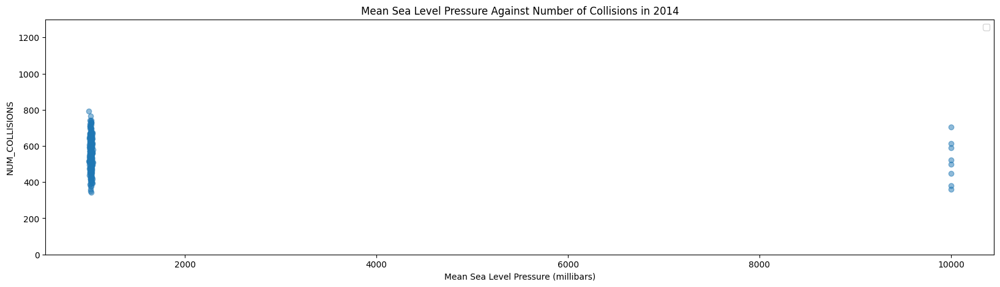

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2014.slp, df_2014.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Mean Sea Level Pressure Against Number of Collisions in 2014")
plt.xlabel("Mean Sea Level Pressure (millibars)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

Missing data present which needs to be cleaned.

In [ ]:
# Finding number of missing datapoints
print(df_2014["slp"].count()) # Number of total slp datapoints
df_2014_slptest = df_2014[df_2014["slp"] < 2000]
print(df_2014_slptest["slp"].count()) # Number of proper datapoints

361
353


As seen above, there are 8 missing values. These values will be replaced by the average value of slp for 2014. In this case, it is better to do this instead of deleting the missing values as the rows with missing values for slp may not be the same as the other variables.

In [ ]:
avg_value = df_2014[df_2014['slp'] <= 2000]['slp'].mean() # Getting average value of the proper slp datapoints in 2014
# Importing necessary libraries
from sklearn.impute import SimpleImputer
import numpy as np
pd.set_option('display.max_rows', None)
imputer = SimpleImputer(missing_values=9999.9, strategy='mean') # Setting up the imputer

# Replacing the missing values with mean value
slpcolumn =  df_2014['slp'].copy()
slpcolumn = np.array([slpcolumn]).reshape(-1, 1)
imputer.fit(slpcolumn)
slpcolumn = imputer.transform(slpcolumn)
df_2014['slp'] = slpcolumn

new_avg = df_2014['slp'].mean()
print(avg_value, new_avg) # If new_avg = avg_value, then the missing datapoints have been replaced by the mean value

1016.7804532577903 1016.7804532577904


<ipython-input-56-d0f8a8c46d3f>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2014['slp'] = slpcolumn


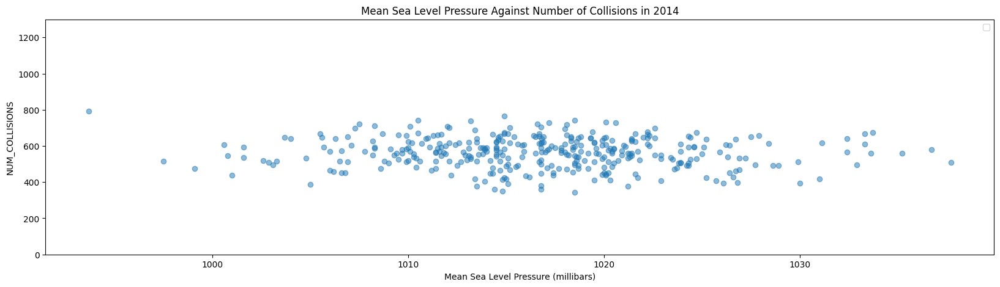

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2014.slp, df_2014.NUM_COLLISIONS, alpha=0.5)
# plt.xticks(np.arange(0, 100, step=10))
plt.legend()
plt.title("Mean Sea Level Pressure Against Number of Collisions in 2014")
plt.xlabel("Mean Sea Level Pressure (millibars)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

Missing values have been replaced as confirmed by the plot above

**2014 visib vs num_collisions**

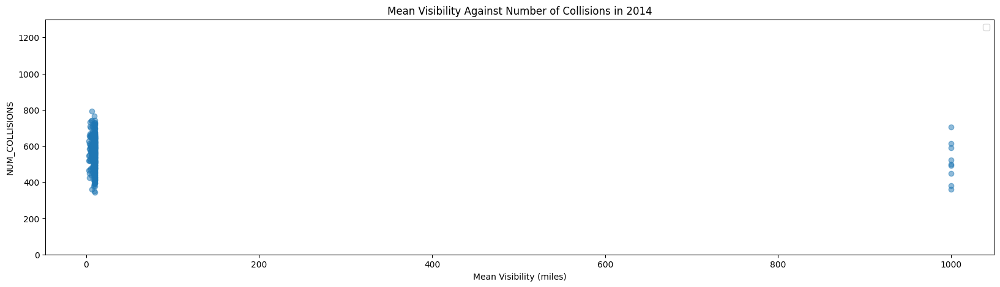

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2014.visib, df_2014.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Mean Visibility Against Number of Collisions in 2014")
plt.xlabel("Mean Visibility (miles)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

Missing datapoints present

In [ ]:
# Finding number of missing datapoints
print(df_2014["visib"].count())
df_2014_visibtest = df_2014[df_2014["visib"] < 200]
print(df_2014_visibtest["visib"].count())

361
352


Replacing 9 missing data points with average value

In [ ]:
avg_value = df_2014[df_2014['visib'] <= 200]['visib'].mean() # Getting average value of the proper visib datapoints in 2014
# Importing the necessary libraries
from sklearn.impute import SimpleImputer
import numpy as np
pd.set_option('display.max_rows', None)
imputer = SimpleImputer(missing_values=999.9, strategy='mean') # Setting up the imputer

# Replacing the missing values
visibcolumn =  df_2014['visib'].copy()
visibcolumn = np.array([visibcolumn]).reshape(-1, 1)
imputer.fit(visibcolumn)
visibcolumn = imputer.transform(visibcolumn)
df_2014['visib'] = visibcolumn

new_avg = df_2014['visib'].mean()
print(avg_value, new_avg)

8.977272727272727 8.977272727272728


<ipython-input-60-ea21d82d2486>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2014['visib'] = visibcolumn


Final visualisation

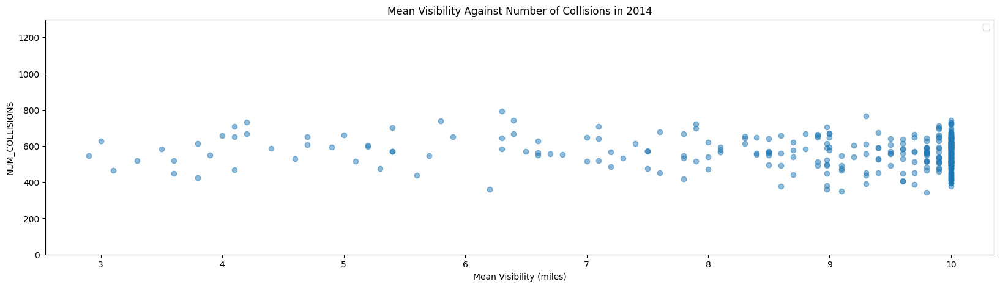

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2014.visib, df_2014.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Mean Visibility Against Number of Collisions in 2014")
plt.xlabel("Mean Visibility (miles)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**2014 wind speed vs num_collisions**

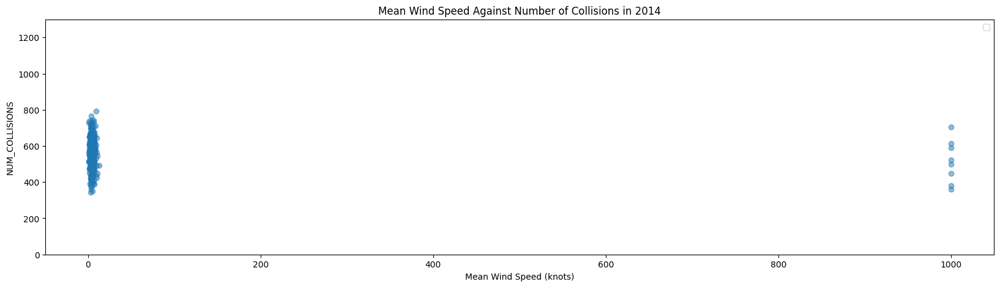

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2014.wdsp, df_2014.NUM_COLLISIONS, alpha=0.5)
plt.title("Mean Wind Speed Against Number of Collisions in 2014")
plt.xlabel("Mean Wind Speed (knots)")
plt.ylabel("NUM_COLLISIONS")
plt.legend()
plt.show()

In [ ]:
print(df_2014["wdsp"].count())
df_2014_wdsptest = df_2014[df_2014["wdsp"] < 200]
print(df_2014_wdsptest["wdsp"].count())

361
353


Replacing 8 data points with average value

In [ ]:
avg_value = df_2014[df_2014['wdsp'] <= 200]['wdsp'].mean()  # Calculating average wdsp value for 2014
# Importing necessary libraries
from sklearn.impute import SimpleImputer
import numpy as np
pd.set_option('display.max_rows', None)
imputer = SimpleImputer(missing_values=999.9, strategy='mean') # Setting up the imputer

# Replacing the missing values
wdspcolumn =  df_2014['wdsp'].copy()
wdspcolumn = np.array([wdspcolumn]).reshape(-1, 1)
imputer.fit(wdspcolumn)
wdspcolumn = imputer.transform(wdspcolumn)
df_2014['wdsp'] = wdspcolumn

new_avg = df_2014['wdsp'].mean()
print(avg_value, new_avg)

4.620963172804533 4.620963172804532


<ipython-input-64-57c3c0f4cde9>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2014['wdsp'] = wdspcolumn


Final visualisation

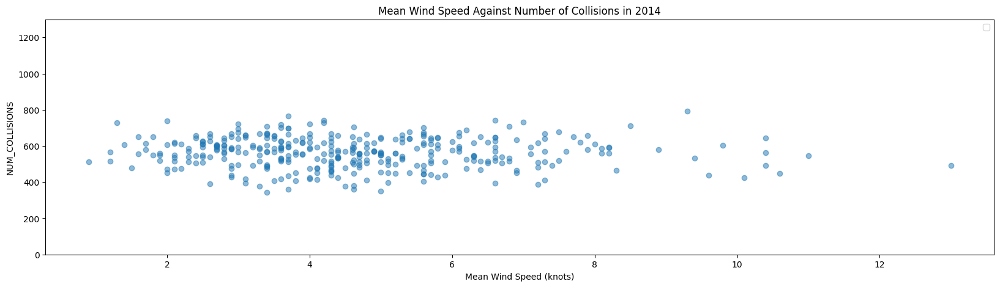

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2014.wdsp, df_2014.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Mean Wind Speed Against Number of Collisions in 2014")
plt.xlabel("Mean Wind Speed (knots)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**2014 max wind speed vs num_collisions**

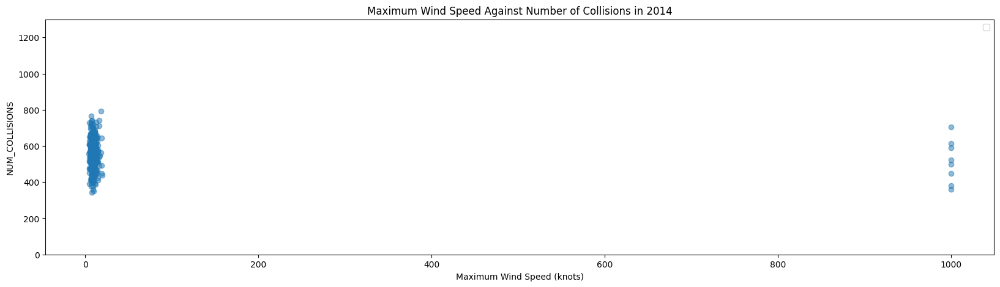

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2014.mxpsd, df_2014.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Maximum Wind Speed Against Number of Collisions in 2014")
plt.xlabel("Maximum Wind Speed (knots)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

In [ ]:
# Finding number of missing datapoints
print(df_2014["mxpsd"].count())
df_2014_mxpsdtest = df_2014[df_2014["mxpsd"] < 200]
print(df_2014_mxpsdtest["mxpsd"].count())

361
353


Replacing 8 missing data points

In [ ]:
avg_value = df_2014[df_2014['mxpsd'] <= 200]['mxpsd'].mean() # Getting the average mxpsd value for proper datapoints in 2014
# Importing necessary libraries
from sklearn.impute import SimpleImputer
import numpy as np
pd.set_option('display.max_rows', None)
imputer = SimpleImputer(missing_values=999.9, strategy='mean') # Setting up the imputer

# Replacing the missing values
mxpsdcolumn =  df_2014['mxpsd'].copy()
mxpsdcolumn = np.array([mxpsdcolumn]).reshape(-1, 1)
imputer.fit(mxpsdcolumn)
mxpsdcolumn = imputer.transform(mxpsdcolumn)
df_2014['mxpsd'] = mxpsdcolumn

new_avg = df_2014['mxpsd'].mean()
print(avg_value, new_avg)

9.286968838526914 9.286968838526912


<ipython-input-68-c3e0e5fb151b>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2014['mxpsd'] = mxpsdcolumn


Final visualisation

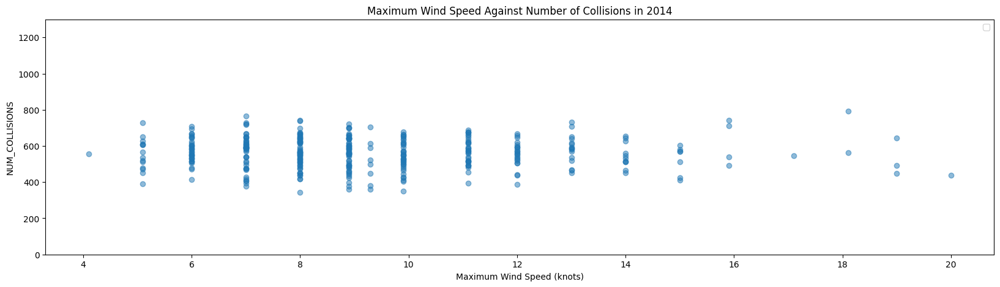

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2014.mxpsd, df_2014.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Maximum Wind Speed Against Number of Collisions in 2014")
plt.xlabel("Maximum Wind Speed (knots)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**2014 maxtemp vs num_collisions**

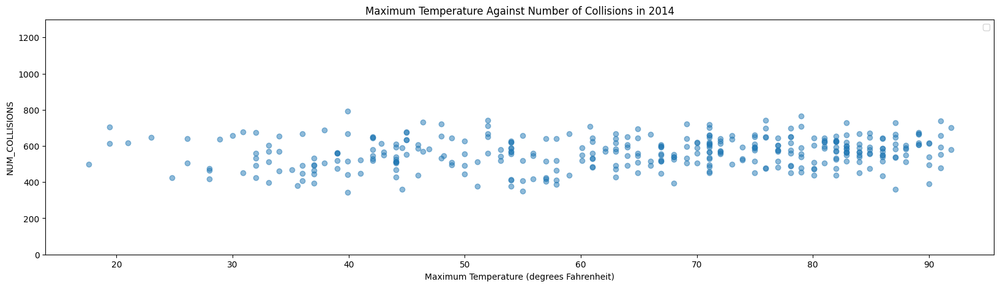

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2014.maxtemp, df_2014.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Maximum Temperature Against Number of Collisions in 2014")
plt.xlabel("Maximum Temperature (degrees Fahrenheit)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**2014 mintemp vs num_collisions**

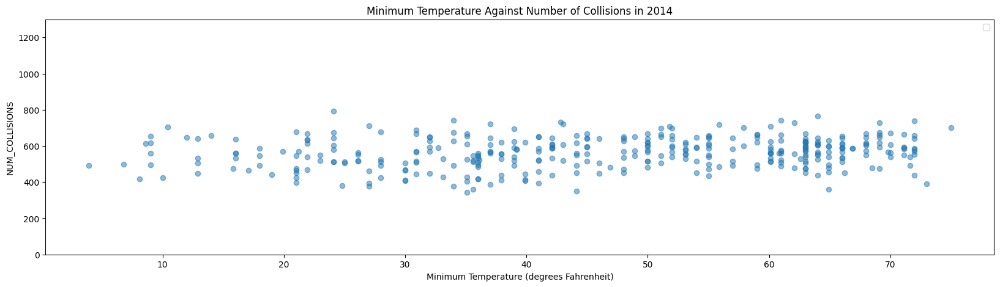

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2014.mintemp, df_2014.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Minimum Temperature Against Number of Collisions in 2014")
plt.xlabel("Minimum Temperature (degrees Fahrenheit)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**2014 prcp vs num_collisions**

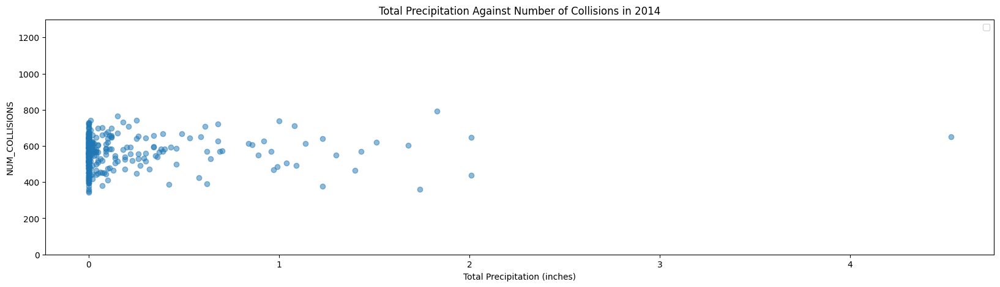

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2014.prcp, df_2014.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Total Precipitation Against Number of Collisions in 2014")
plt.xlabel("Total Precipitation (inches)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**Collisions each day across 2014**

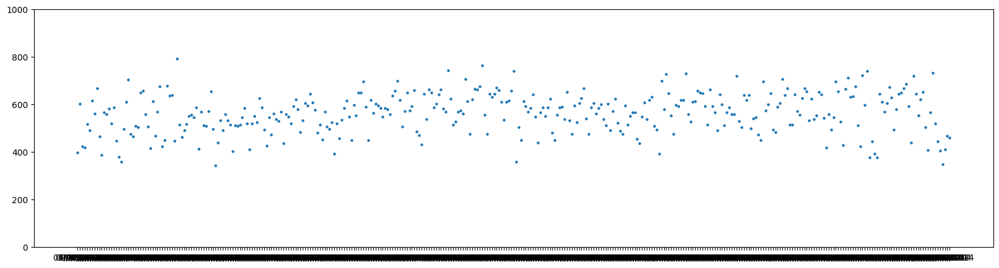

In [ ]:
plt.ylim(0, 1000)
plt.scatter(df_2014.collision_date, df_2014.NUM_COLLISIONS, s=5)
plt.show()

Similar trend to 2013, data will be collated later on.

**Final 2014 Correlation Matrix**

<ipython-input-74-f98e058e2917>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corrMatrix = df_2014.corr() # Final 2014 correlation matrix


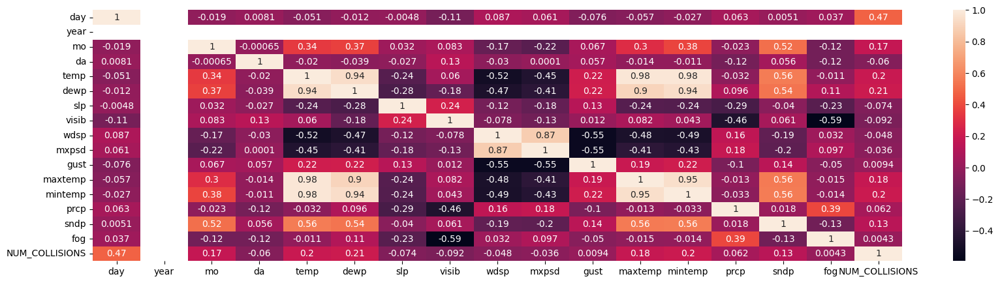

In [ ]:
corrMatrix = df_2014.corr() # Final 2014 correlation matrix
sn.heatmap(corrMatrix, annot=True)
plt.show()

**Creating 2015 dataset**

In [ ]:
# Creating dataset for 2015
df_2015 = df_cleaned[df_cleaned["year"] == 2015]

<ipython-input-76-c6402243888c>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corrMatrix = df_2015.corr() # 2015 correlation matrix


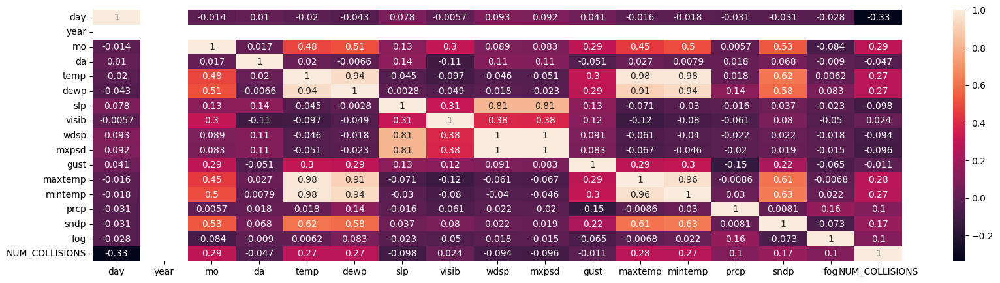

In [ ]:
corrMatrix = df_2015.corr() # 2015 correlation matrix
sn.heatmap(corrMatrix, annot=True)
plt.show()

positive correlation in visib whereas it was negative in 2013 and 2014, everything else the same

**2015 day of the week vs num collisions**

In [ ]:
df_2015.loc[df_2015['day'] > 0, 'day'] = df_2015['day']+2 # change all days by adding 2.
df_2015.loc[df_2015['day'] == 9, 'day'] = 2 # change days that equal 9 to day 2
df_2015.loc[df_2015['day'] == 8, 'day'] = 1 # change days that equal 8 to day 1

<ipython-input-77-b4e53bce02ce>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2015.loc[df_2015['day'] > 0, 'day'] = df_2015['day']+2 # change all days by adding 2.


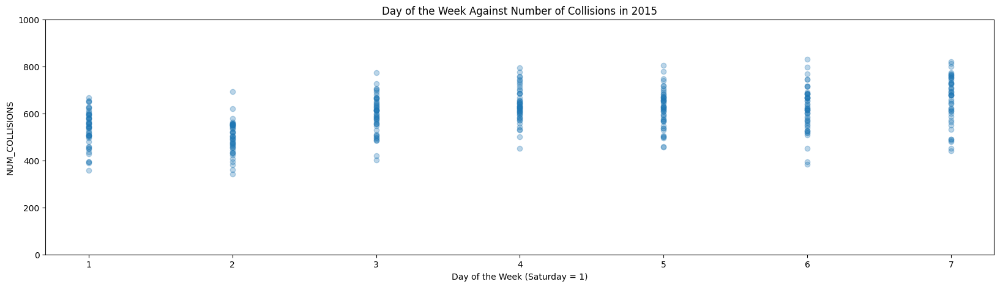

In [ ]:
plt.ylim(0, 1000)
plt.scatter(df_2015.day, df_2015.NUM_COLLISIONS, alpha=0.3)
plt.title("Day of the Week Against Number of Collisions in 2015")
plt.xlabel("Day of the Week (Saturday = 1)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

<ipython-input-79-c6402243888c>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corrMatrix = df_2015.corr() # 2015 correlation matrix


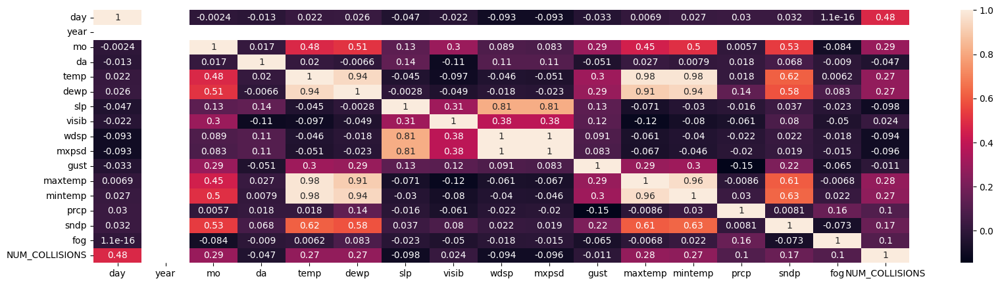

In [ ]:
corrMatrix = df_2015.corr() # 2015 correlation matrix
sn.heatmap(corrMatrix, annot=True)
plt.show()

Strongest correlation for day when Saturday = 1 again. Day, temp, dewp, maxtemp and mintemp still has the strongest correlations to NUM_COLLISIONS relative to the other variables.

**2015 temp vs num_collisions**

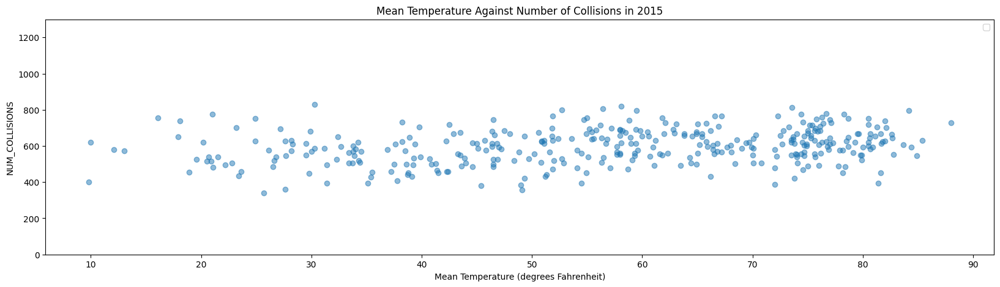

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2015.temp, df_2015.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Mean Temperature Against Number of Collisions in 2015")
plt.xlabel("Mean Temperature (degrees Fahrenheit)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**2015 dewp vs num_collisions**

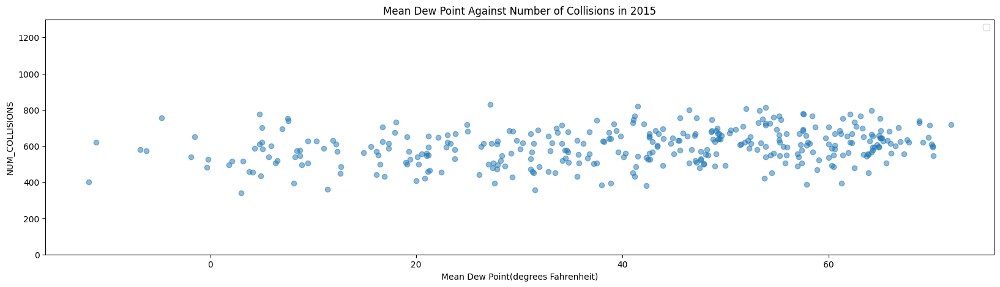

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2015.dewp, df_2015.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Mean Dew Point Against Number of Collisions in 2015")
plt.xlabel("Mean Dew Point(degrees Fahrenheit)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**2015 slp vs num_collisions**

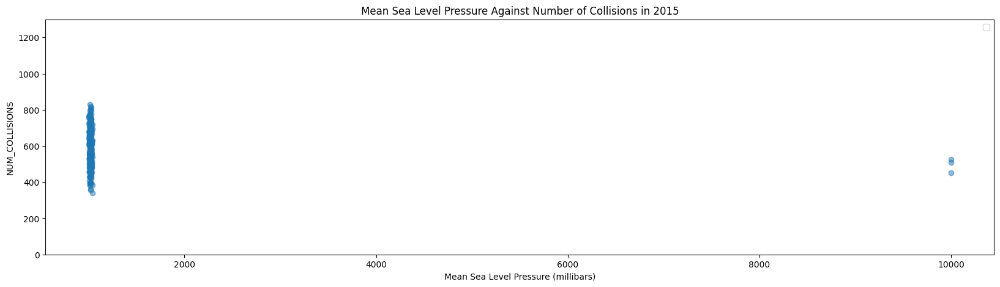

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2015.slp, df_2015.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Mean Sea Level Pressure Against Number of Collisions in 2015")
plt.xlabel("Mean Sea Level Pressure (millibars)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

Missing data present

In [ ]:
# Finding number of missing datapoints
print(df_2015["slp"].count())
df_2015_slptest = df_2015[df_2015["slp"] < 2000]
print(df_2015_slptest["slp"].count())

360
357


Replacing 3 missing values with average value of slp

In [ ]:
avg_value = df_2015[df_2015['slp'] <= 2000]['slp'].mean() # Finding average value of proper slp datapoints for 2015
# Importing the necessary libraries
from sklearn.impute import SimpleImputer
import numpy as np
pd.set_option('display.max_rows', None)
imputer = SimpleImputer(missing_values=9999.9, strategy='mean') # Setting up the imputer

# Replacing the missing datapoints
slpcolumn =  df_2015['slp'].copy()
slpcolumn = np.array([slpcolumn]).reshape(-1, 1)
imputer.fit(slpcolumn)
slpcolumn = imputer.transform(slpcolumn)
df_2015['slp'] = slpcolumn

new_avg = df_2015['slp'].mean()
print(avg_value, new_avg)

1017.8162464985995 1017.8162464985994


<ipython-input-84-78d815079e5b>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2015['slp'] = slpcolumn


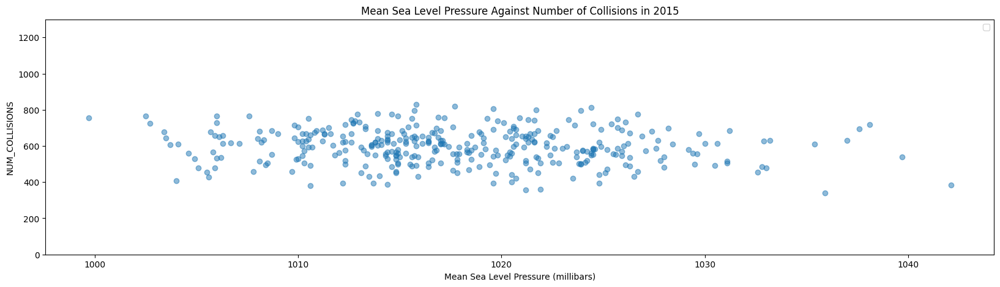

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2015.slp, df_2015.NUM_COLLISIONS, alpha=0.5) # Final visualisation of 2015 slp
plt.legend()
plt.title("Mean Sea Level Pressure Against Number of Collisions in 2015")
plt.xlabel("Mean Sea Level Pressure (millibars)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**2015 visib vs num_collisions**

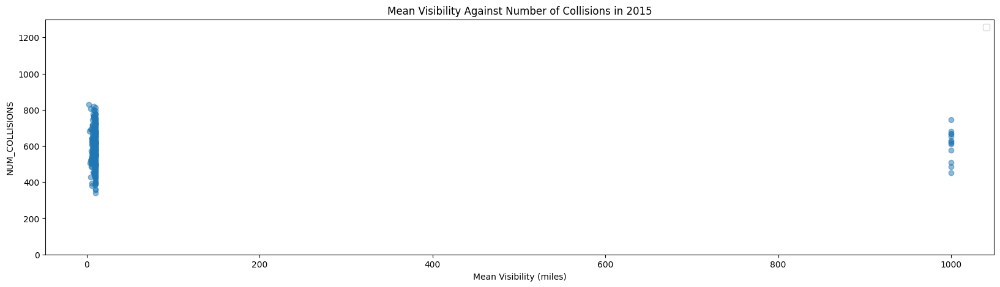

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2015.visib, df_2015.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Mean Visibility Against Number of Collisions in 2015")
plt.xlabel("Mean Visibility (miles)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

Missing data present

In [ ]:
# Finding number of missing datapoints
print(df_2015["visib"].count())
df_2015_slptest = df_2015[df_2015["visib"] < 200]
print(df_2015_slptest["visib"].count())

360
347


Replacing 13 missing values with average value of visib

In [ ]:
avg_visib_value = df_2015[df_2015['visib'] <= 200]['visib'].mean() # Finding average value of proper visib data in 2015
# Importing the necessary libraries
from sklearn.impute import SimpleImputer
import numpy as np
pd.set_option('display.max_rows', None)
imputer = SimpleImputer(missing_values=999.9, strategy='mean') # Setting up the imputer

# Replacing the missing values
visibcolumn =  df_2015['visib'].copy()
visibcolumn = np.array([visibcolumn]).reshape(-1, 1)
imputer.fit(visibcolumn)
visibcolumn = imputer.transform(visibcolumn)
df_2015['visib'] = visibcolumn

newvisib_avg = df_2015['visib'].mean()
print(avg_visib_value, newvisib_avg)

9.027089337175793 9.027089337175791


<ipython-input-88-5baad2f93518>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2015['visib'] = visibcolumn


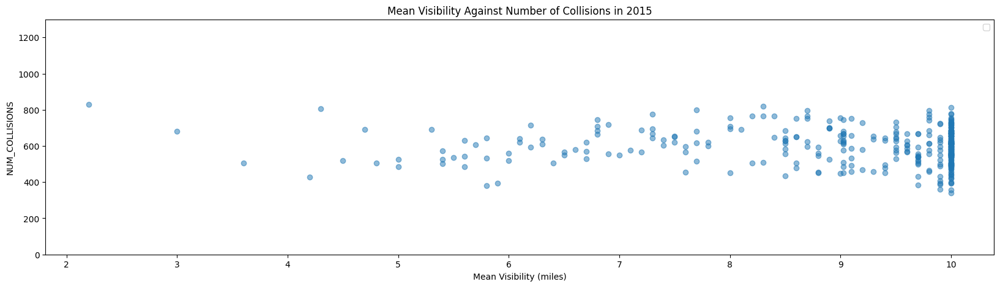

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2015.visib, df_2015.NUM_COLLISIONS, alpha=0.5) # Final visualisation of 2015 visib
plt.legend()
plt.title("Mean Visibility Against Number of Collisions in 2015")
plt.xlabel("Mean Visibility (miles)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**2015 wind speed vs num_collisions**

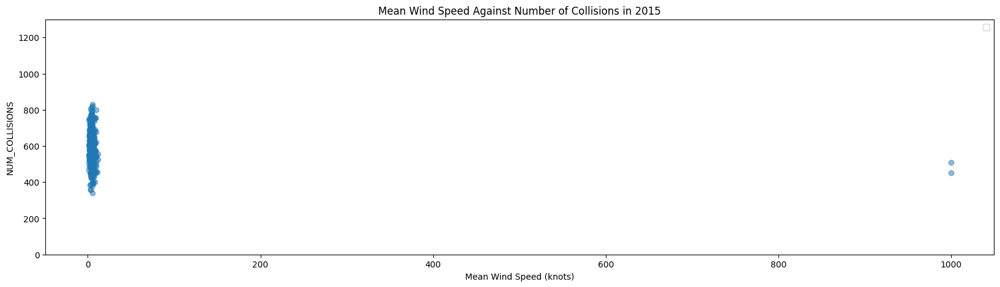

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2015.wdsp, df_2015.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Mean Wind Speed Against Number of Collisions in 2015")
plt.xlabel("Mean Wind Speed (knots)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

Missing datapoints present

In [ ]:
# Finding number of missing datapoints
print(df_2015["wdsp"].count())
df_2015_slptest = df_2015[df_2015["wdsp"] < 200]
print(df_2015_slptest["wdsp"].count()) # 2 missing datapoints

360
358


Replacing missing values with average value of wdsp

In [ ]:
avg_wdsp_value = df_2015[df_2015['wdsp'] <= 200]['wdsp'].mean() # Finding average value of proper wdsp data in 2015
# Importing the relevant librries
from sklearn.impute import SimpleImputer
import numpy as np
pd.set_option('display.max_rows', None)
imputer = SimpleImputer(missing_values=999.9, strategy='mean') # Setting up the imputer

# Replacing the missing values
wdspcolumn =  df_2015['wdsp'].copy()
wdspcolumn = np.array([wdspcolumn]).reshape(-1, 1)
imputer.fit(wdspcolumn)
wdspcolumn = imputer.transform(wdspcolumn)
df_2015['wdsp'] = wdspcolumn

newwdsp_avg = df_2015['wdsp'].mean()
print(avg_wdsp_value, newwdsp_avg)

4.556145251396647 4.556145251396647


<ipython-input-92-da7c052ef528>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2015['wdsp'] = wdspcolumn


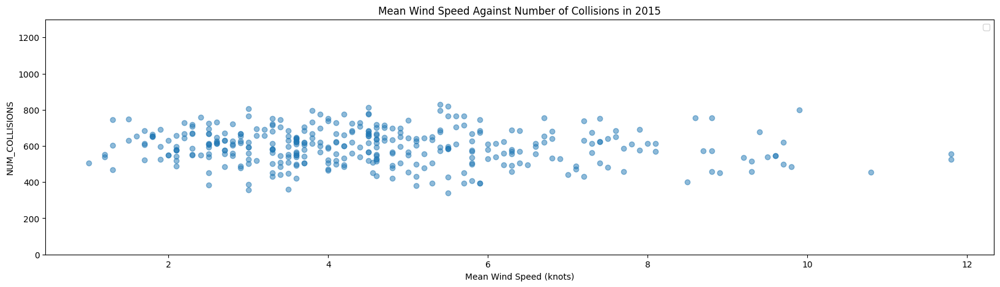

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2015.wdsp, df_2015.NUM_COLLISIONS, alpha=0.5) # Final visualisation of 2015 wdsp
plt.legend()
plt.title("Mean Wind Speed Against Number of Collisions in 2015")
plt.xlabel("Mean Wind Speed (knots)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**2015 max wind speed vs num_collisions**

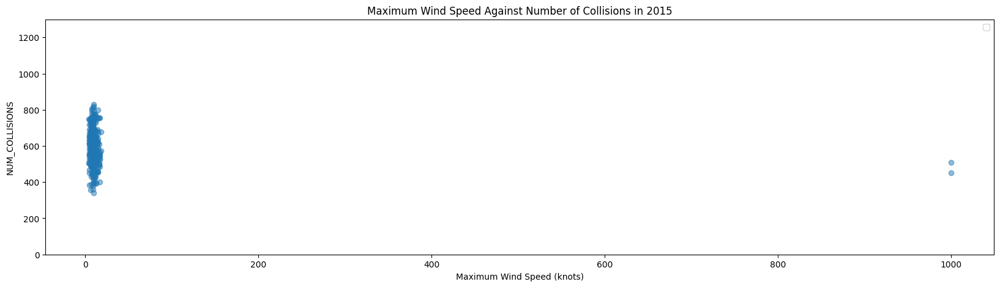

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2015.mxpsd, df_2015.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Maximum Wind Speed Against Number of Collisions in 2015")
plt.xlabel("Maximum Wind Speed (knots)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

Missing datapoints present

In [ ]:
# Finding number of missing datapoints
print(df_2015["mxpsd"].count())
df_2015_slptest = df_2015[df_2015["mxpsd"] < 200]
print(df_2015_slptest["mxpsd"].count()) # 2 missing datapoints

360
358


Replacing missing data with average values

In [ ]:
avg_mxpsd_value = df_2015[df_2015['mxpsd'] <= 200]['mxpsd'].mean()
from sklearn.impute import SimpleImputer
import numpy as np
pd.set_option('display.max_rows', None)
imputer = SimpleImputer(missing_values=999.9, strategy='mean')

mxpsdcolumn =  df_2015['mxpsd'].copy()
mxpsdcolumn = np.array([mxpsdcolumn]).reshape(-1, 1)
imputer.fit(mxpsdcolumn)
mxpsdcolumn = imputer.transform(mxpsdcolumn)
df_2015['mxpsd'] = mxpsdcolumn

newmxpsd_avg = df_2015['mxpsd'].mean()
print(avg_mxpsd_value, newmxpsd_avg)

9.284357541899443 9.284357541899443


<ipython-input-96-cb3dd1609a79>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2015['mxpsd'] = mxpsdcolumn


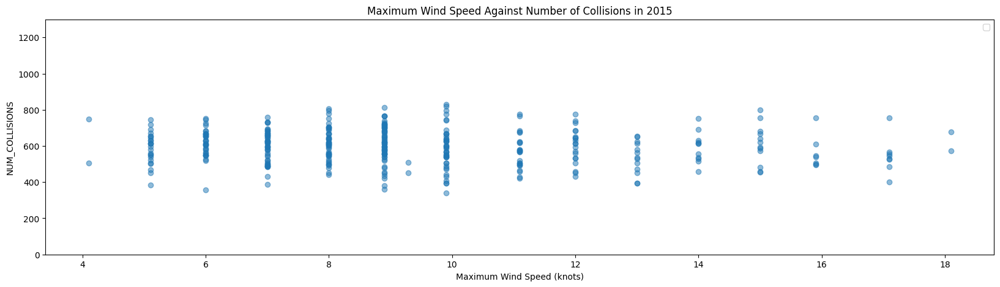

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2015.mxpsd, df_2015.NUM_COLLISIONS, alpha=0.5) # Final visualisation
plt.legend()
plt.title("Maximum Wind Speed Against Number of Collisions in 2015")
plt.xlabel("Maximum Wind Speed (knots)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**2015 max temp vs num_collisions**

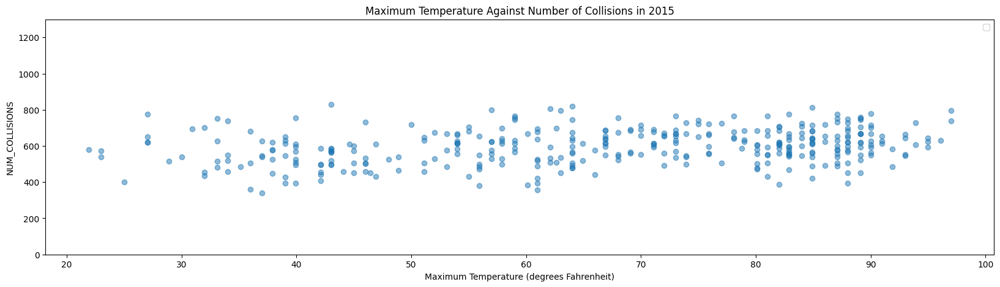

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2015.maxtemp, df_2015.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Maximum Temperature Against Number of Collisions in 2015")
plt.xlabel("Maximum Temperature (degrees Fahrenheit)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**2015 min temp vs num_collisions**

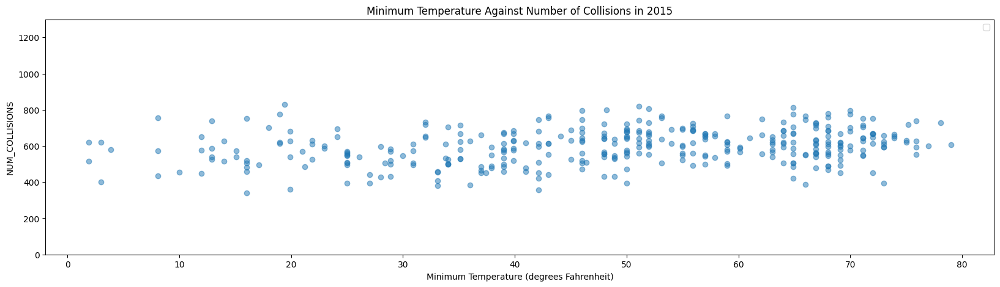

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2015.mintemp, df_2015.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Minimum Temperature Against Number of Collisions in 2015")
plt.xlabel("Minimum Temperature (degrees Fahrenheit)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**2015 prcp vs num_collisions**

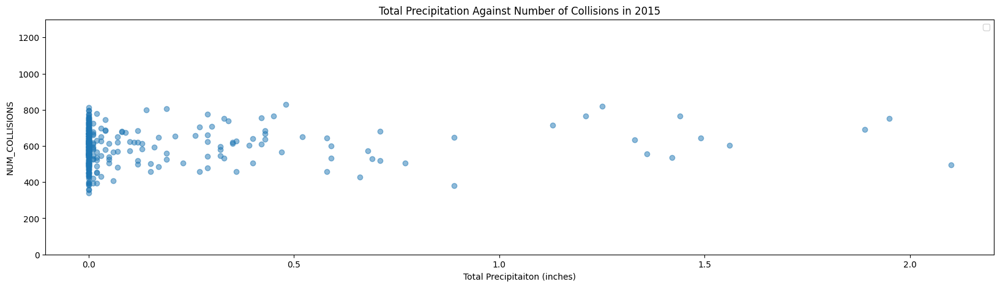

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2015.prcp, df_2015.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Total Precipitation Against Number of Collisions in 2015")
plt.xlabel("Total Precipitaiton (inches)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**Collisions each day across 2015**

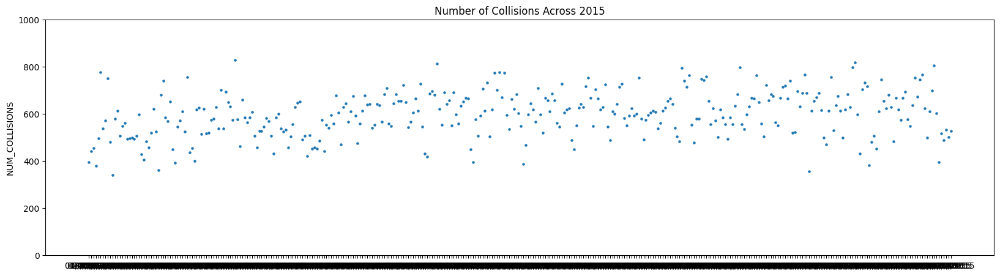

In [ ]:
plt.ylim(0, 1000)
plt.scatter(df_2015.collision_date, df_2015.NUM_COLLISIONS, s=5)
plt.title("Number of Collisions Across 2015")
plt.ylabel("NUM_COLLISIONS")
plt.show()

Similar trends to 2013 and 2014

**Final 2015 Correlation Matrix**

<ipython-input-102-befb0739cb03>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corrMatrix = df_2015.corr() # Final 2015 correlation matrix


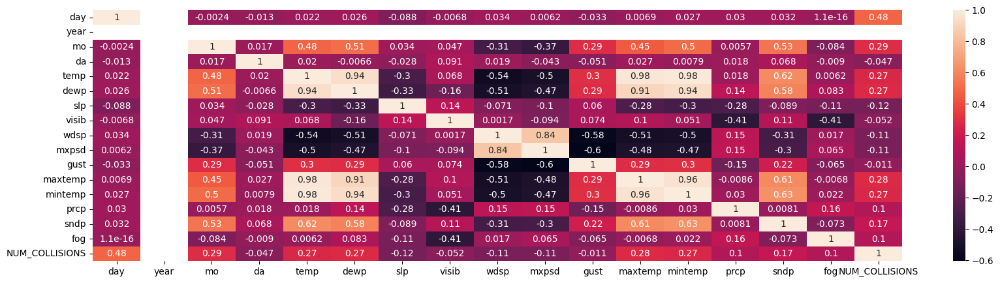

In [ ]:
corrMatrix = df_2015.corr() # Final 2015 correlation matrix
sn.heatmap(corrMatrix, annot=True)
plt.show()

**Creating dataset for 2016**

In [ ]:
# Creating dataset for 2015
df_2016 = df_cleaned[df_cleaned["year"] == 2016]

<ipython-input-104-7db9f92491ad>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corrMatrix = df_2016.corr() # 2016 correlation matrix


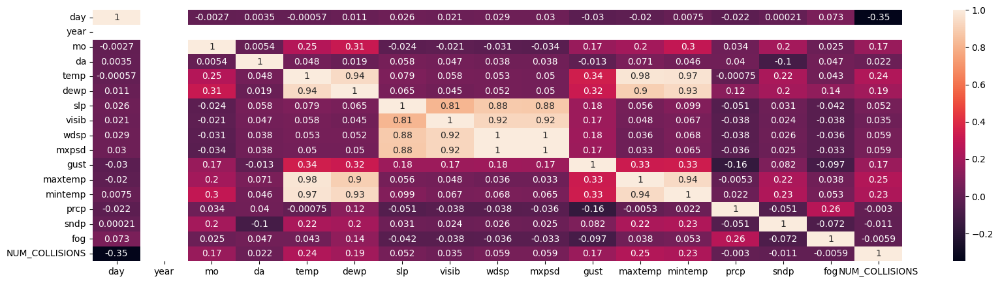

In [ ]:
corrMatrix = df_2016.corr() # 2016 correlation matrix
sn.heatmap(corrMatrix, annot=True)
plt.show()

**2016 day of the week vs num_collisions**

In [ ]:
df_2016.loc[df_2016['day'] > 0, 'day'] = df_2016['day']+2 # change all days by adding 2.
df_2016.loc[df_2016['day'] == 9, 'day'] = 2 # change days that equal 9 to day 2
df_2016.loc[df_2016['day'] == 8, 'day'] = 1 # change days that equal 8 to day 1

<ipython-input-105-4b10b08db2b0>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2016.loc[df_2016['day'] > 0, 'day'] = df_2016['day']+2 # change all days by adding 2.


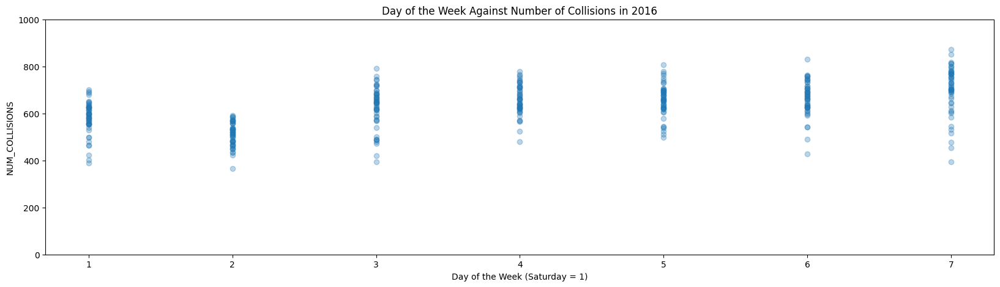

In [ ]:
plt.ylim(0, 1000)
plt.scatter(df_2016.day, df_2016.NUM_COLLISIONS, alpha=0.3)
plt.title("Day of the Week Against Number of Collisions in 2016")
plt.xlabel("Day of the Week (Saturday = 1)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

<ipython-input-107-7db9f92491ad>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corrMatrix = df_2016.corr() # 2016 correlation matrix


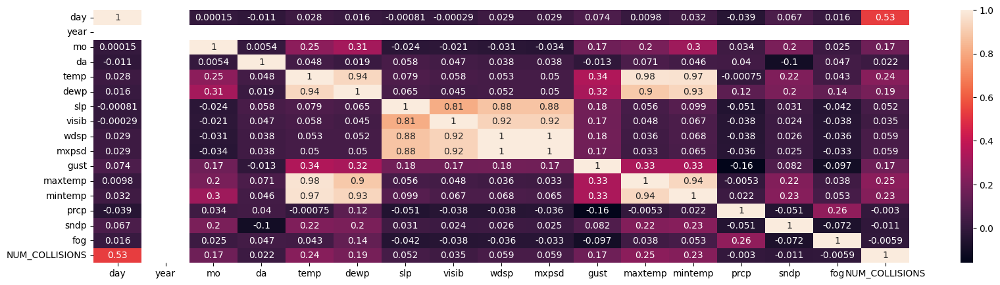

In [ ]:
corrMatrix = df_2016.corr() # 2016 correlation matrix
sn.heatmap(corrMatrix, annot=True)
plt.show()

Strongest correlation when Saturday = 1 again.

**2016 temp vs num_collisions**

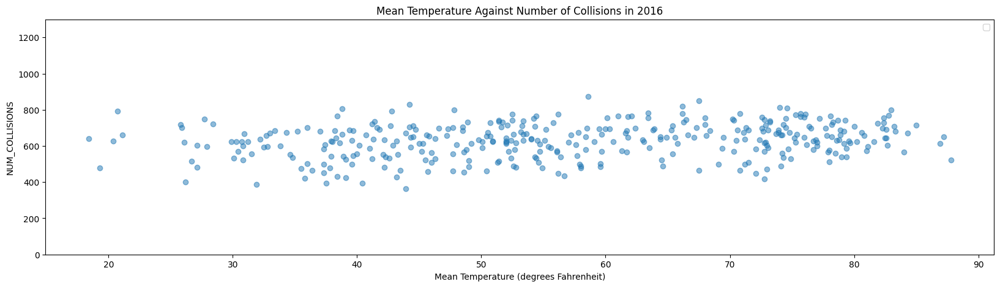

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2016.temp, df_2016.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Mean Temperature Against Number of Collisions in 2016")
plt.xlabel("Mean Temperature (degrees Fahrenheit)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**2016 dew point vs num_collisions**

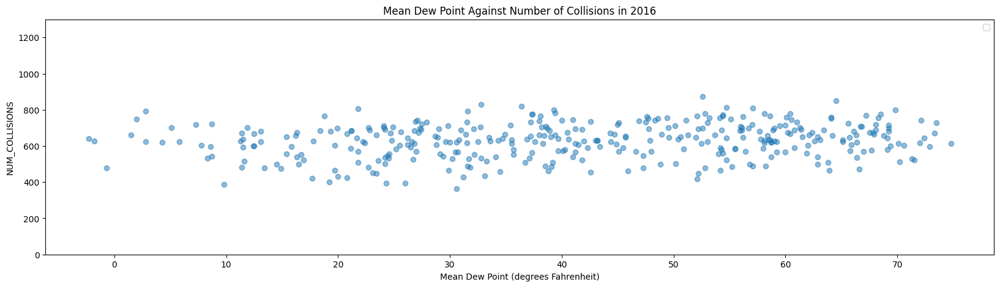

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2016.dewp, df_2016.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Mean Dew Point Against Number of Collisions in 2016")
plt.xlabel("Mean Dew Point (degrees Fahrenheit)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**2016 slp vs num_collisions**

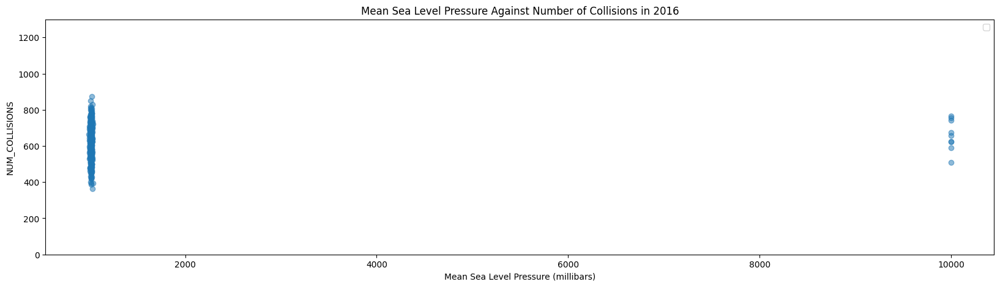

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2016.slp, df_2016.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Mean Sea Level Pressure Against Number of Collisions in 2016")
plt.xlabel("Mean Sea Level Pressure (millibars)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

Missing datapoints present

In [ ]:
# Finding number of missing datapoints
print(df_2016["slp"].count())
df_2016_slptest = df_2016[df_2016["slp"] < 2000]
print(df_2016_slptest["slp"].count())

364
355


Replacing 9 data points with average value

In [ ]:
avg_value = df_2016[df_2016['slp'] <= 2000]['slp'].mean()
from sklearn.impute import SimpleImputer
import numpy as np
pd.set_option('display.max_rows', None)
imputer = SimpleImputer(missing_values=9999.9, strategy='mean')

slpcolumn =  df_2016['slp'].copy()
slpcolumn = np.array([slpcolumn]).reshape(-1, 1)
imputer.fit(slpcolumn)
slpcolumn = imputer.transform(slpcolumn)
df_2016['slp'] = slpcolumn

new_avg = df_2016['slp'].mean()
print(avg_value, new_avg)

1016.7118309859154 1016.7118309859156


<ipython-input-112-99b877db865e>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2016['slp'] = slpcolumn


Final visualisation

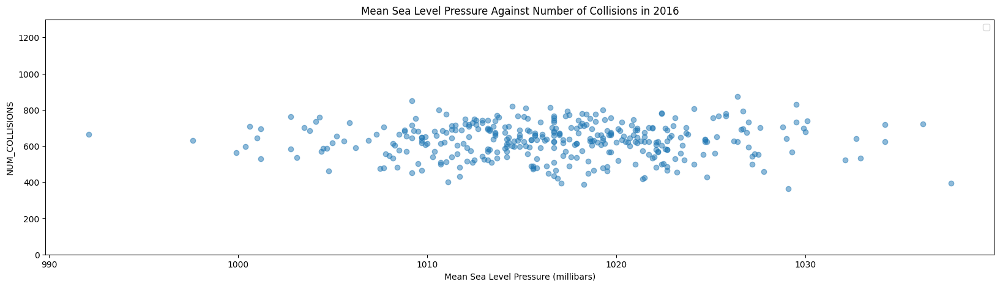

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2016.slp, df_2016.NUM_COLLISIONS, alpha=0.5) # Final visualisation of 2016 slp
plt.legend()
plt.title("Mean Sea Level Pressure Against Number of Collisions in 2016")
plt.xlabel("Mean Sea Level Pressure (millibars)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**2016 visib vs num_collisions**

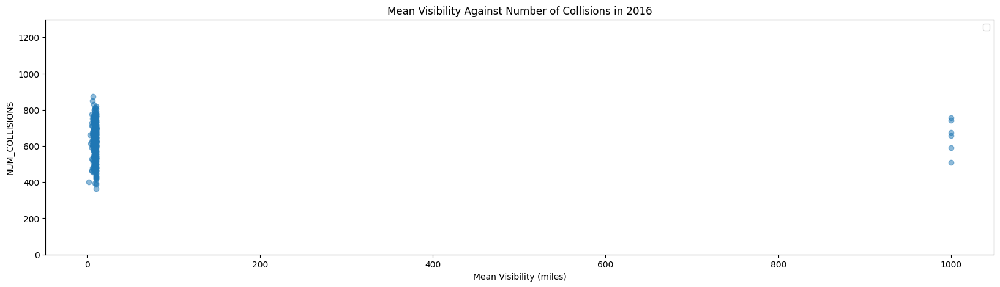

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2016.visib, df_2016.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Mean Visibility Against Number of Collisions in 2016")
plt.xlabel("Mean Visibility (miles)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

Missing data present

In [ ]:
# Finding number of missing datapoints
print(df_2016["visib"].count())
df_2016_visibtest = df_2016[df_2016["visib"] < 200]
print(df_2016_visibtest["visib"].count())

364
358


Replacing 6 missing data points

In [ ]:
avg_visib_value = df_2016[df_2016['visib'] <= 200]['visib'].mean()
from sklearn.impute import SimpleImputer
import numpy as np
pd.set_option('display.max_rows', None)
imputer = SimpleImputer(missing_values=999.9, strategy='mean')

visibcolumn =  df_2016['visib'].copy()
visibcolumn = np.array([visibcolumn]).reshape(-1, 1)
imputer.fit(visibcolumn)
visibcolumn = imputer.transform(visibcolumn)
df_2016['visib'] = visibcolumn

newvisib_avg = df_2016['visib'].mean()
print(avg_visib_value, newvisib_avg)

8.971787709497207 8.971787709497207


<ipython-input-116-e232c2e7c1a7>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2016['visib'] = visibcolumn


Final visualisation

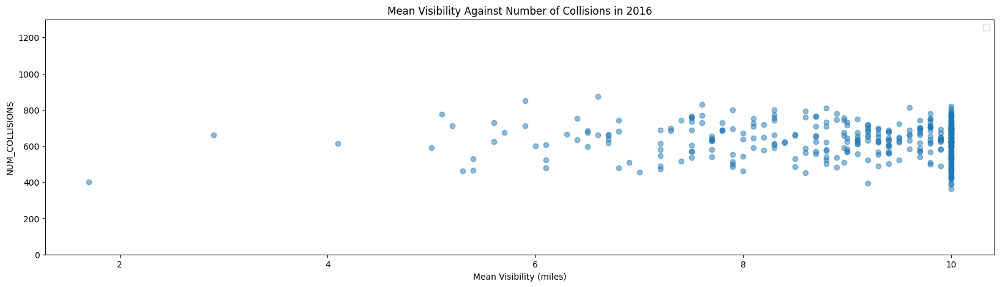

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2016.visib, df_2016.NUM_COLLISIONS, alpha=0.5) # Final visualisation of 2016 visib
plt.legend()
plt.title("Mean Visibility Against Number of Collisions in 2016")
plt.xlabel("Mean Visibility (miles)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**2016 wind speed vs num_collisions**

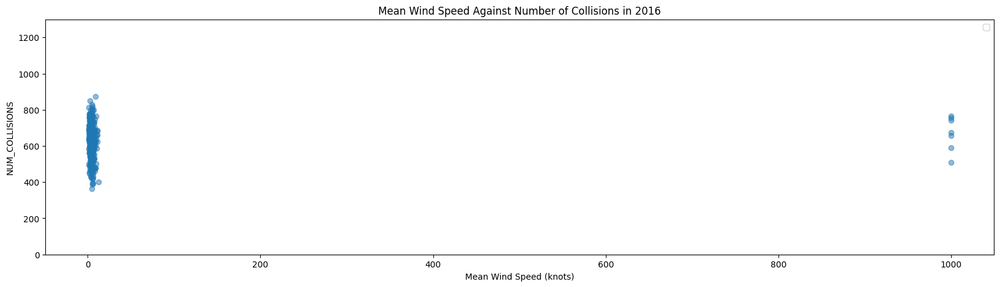

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2016.wdsp, df_2016.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Mean Wind Speed Against Number of Collisions in 2016")
plt.xlabel("Mean Wind Speed (knots)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

Missing data present

In [ ]:
# Finding number of missing datapoints
print(df_2016["wdsp"].count())
df_2016_wdsptest = df_2016[df_2016["wdsp"] < 200]
print(df_2016_wdsptest["wdsp"].count())

364
357


Replacing 7 missing data points

In [ ]:
avg_wdsp_value = df_2016[df_2016['wdsp'] <= 200]['wdsp'].mean()
from sklearn.impute import SimpleImputer
import numpy as np
pd.set_option('display.max_rows', None)
imputer = SimpleImputer(missing_values=999.9, strategy='mean')

wdspcolumn =  df_2016['wdsp'].copy()
wdspcolumn = np.array([wdspcolumn]).reshape(-1, 1)
imputer.fit(wdspcolumn)
wdspcolumn = imputer.transform(wdspcolumn)
df_2016['wdsp'] = wdspcolumn

newwdsp_avg = df_2016['wdsp'].mean()
print(avg_wdsp_value, newwdsp_avg)

4.621848739495798 4.621848739495798


<ipython-input-120-e70034579b2e>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2016['wdsp'] = wdspcolumn


Final visualisation

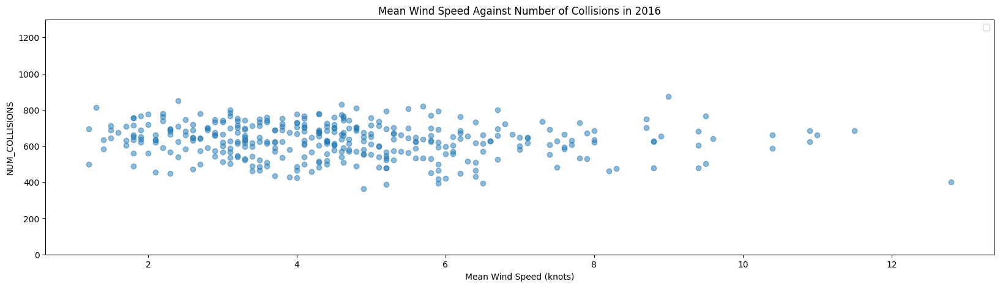

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2016.wdsp, df_2016.NUM_COLLISIONS, alpha=0.5) # Final visualisation of 2016 wdsp
plt.legend()
plt.title("Mean Wind Speed Against Number of Collisions in 2016")
plt.xlabel("Mean Wind Speed (knots)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**2016 max wind speed vs num_collisions**

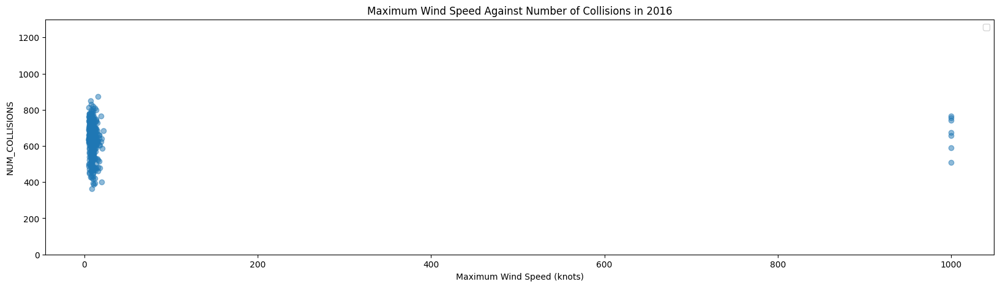

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2016.mxpsd, df_2016.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Maximum Wind Speed Against Number of Collisions in 2016")
plt.xlabel("Maximum Wind Speed (knots)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

Missing data present

In [ ]:
# Finding number of missing datapoints
print(df_2016["mxpsd"].count())
df_2016_mxpsdtest = df_2016[df_2016["mxpsd"] < 200]
print(df_2016_mxpsdtest["mxpsd"].count())

364
357


Replacing 7 missing data points

In [ ]:
avg_mxpsd_value = df_2016[df_2016['mxpsd'] <= 200]['mxpsd'].mean()
from sklearn.impute import SimpleImputer
import numpy as np
pd.set_option('display.max_rows', None)
imputer = SimpleImputer(missing_values=999.9, strategy='mean')

mxpsdcolumn =  df_2016['mxpsd'].copy()
mxpsdcolumn = np.array([mxpsdcolumn]).reshape(-1, 1)
imputer.fit(mxpsdcolumn)
mxpsdcolumn = imputer.transform(mxpsdcolumn)
df_2016['mxpsd'] = mxpsdcolumn

newmxpsd_avg = df_2016['mxpsd'].mean()
print(avg_mxpsd_value, newmxpsd_avg)

9.454621848739496 9.454621848739498


<ipython-input-124-602b6b1fc6d9>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2016['mxpsd'] = mxpsdcolumn


Final visualisaton

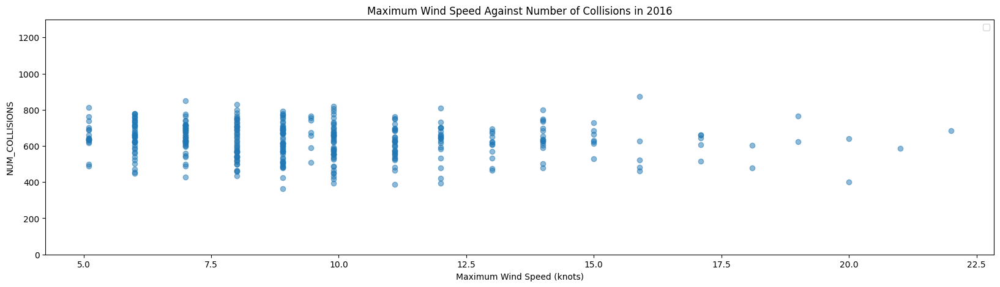

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2016.mxpsd, df_2016.NUM_COLLISIONS, alpha=0.5) # Final visualisation
plt.legend()
plt.title("Maximum Wind Speed Against Number of Collisions in 2016")
plt.xlabel("Maximum Wind Speed (knots)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**2016 max temp vs num_collisions**

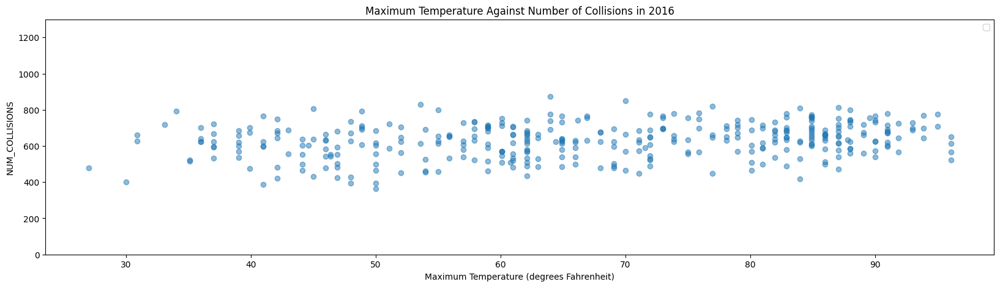

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2016.maxtemp, df_2016.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Maximum Temperature Against Number of Collisions in 2016")
plt.xlabel("Maximum Temperature (degrees Fahrenheit)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**2016 min temp vs num_collisions**

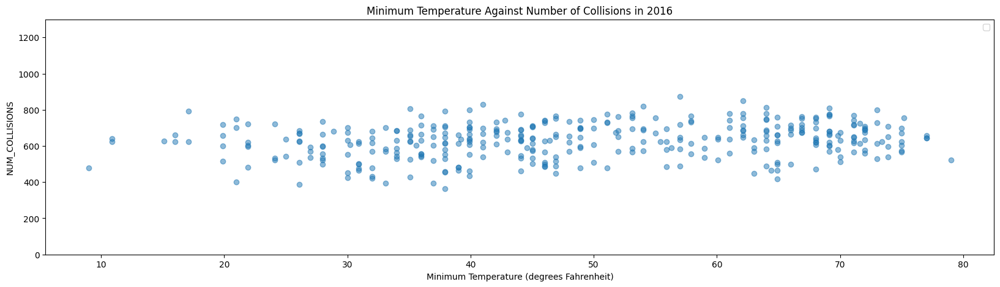

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2016.mintemp, df_2016.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Minimum Temperature Against Number of Collisions in 2016")
plt.xlabel("Minimum Temperature (degrees Fahrenheit)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**2016 prcp vs num_collisions**

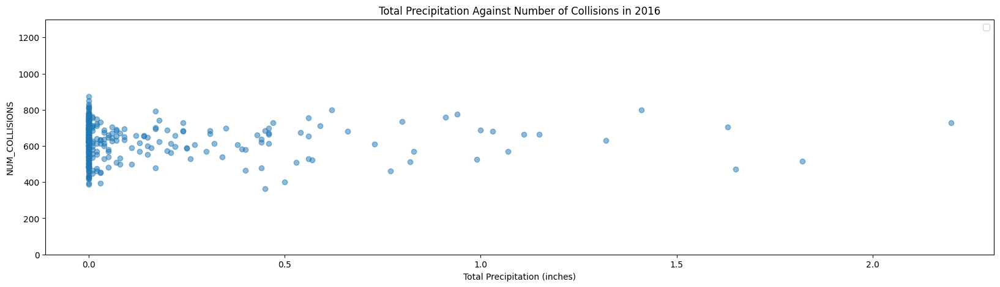

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2016.prcp, df_2016.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Total Precipitation Against Number of Collisions in 2016")
plt.xlabel("Total Precipitation (inches)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**Collisions each day across 2016**

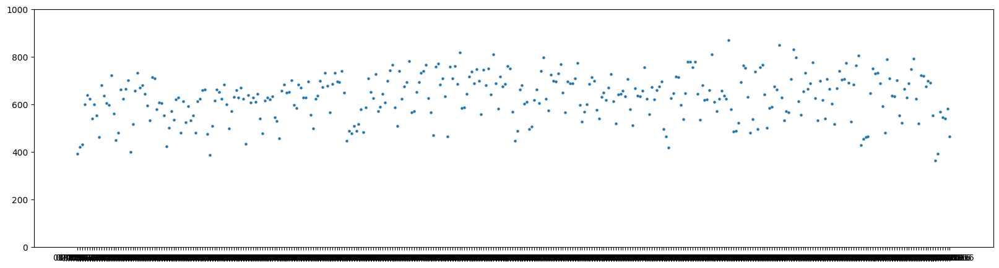

In [ ]:
plt.ylim(0, 1000)
plt.scatter(df_2016.collision_date, df_2016.NUM_COLLISIONS, s=5)
plt.show()

Similar trend to previous years

**Plotting Final Correlation Matrix For 2016**

<ipython-input-130-b23c991b8747>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corrMatrix = df_2016.corr() # Final 2016 correlation matrix


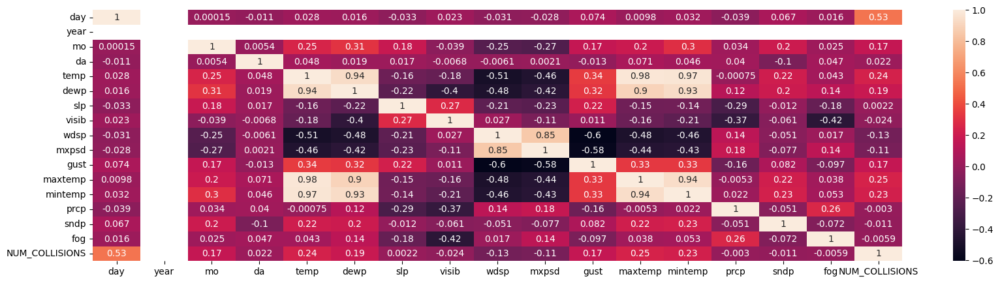

In [ ]:
corrMatrix = df_2016.corr() # Final 2016 correlation matrix
sn.heatmap(corrMatrix, annot=True)
plt.show()

**Creating 2017 dataset**

In [ ]:
# Creating dataset for 2017
df_2017 = df_cleaned[df_cleaned["year"] == 2017]

<ipython-input-132-04c220b2a2ae>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corrMatrix = df_2017.corr() # 2017 correlation matrix


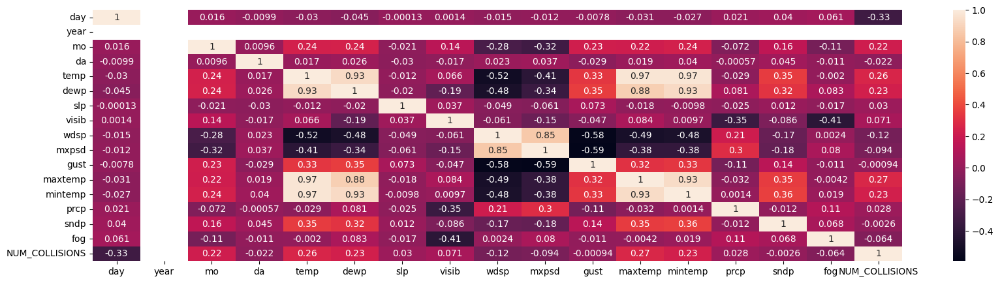

In [ ]:
corrMatrix = df_2017.corr() # 2017 correlation matrix
sn.heatmap(corrMatrix, annot=True)
plt.show()

**2017 day of the week vs num_collisions**

In [ ]:
df_2017.loc[df_2017['day'] > 0, 'day'] = df_2017['day']+2 # change all days by adding 1.
df_2017.loc[df_2017['day'] == 9, 'day'] = 2
df_2017.loc[df_2017['day'] == 8, 'day'] = 1

<ipython-input-133-30580f20199c>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2017.loc[df_2017['day'] > 0, 'day'] = df_2017['day']+2 # change all days by adding 1.


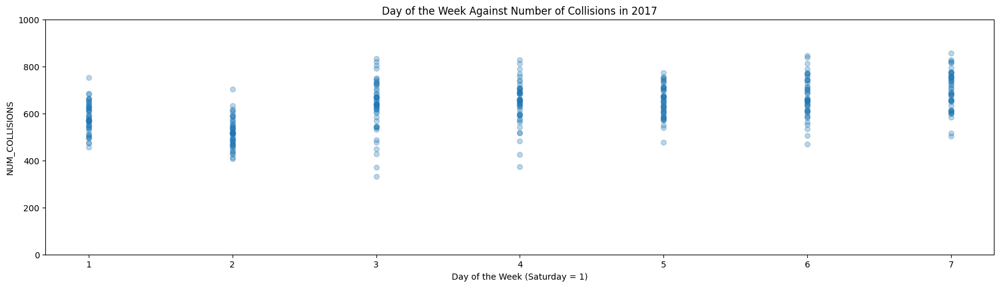

In [ ]:
plt.ylim(0, 1000)
plt.scatter(df_2017.day, df_2017.NUM_COLLISIONS, alpha=0.3)
plt.title("Day of the Week Against Number of Collisions in 2017")
plt.xlabel("Day of the Week (Saturday = 1)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

<ipython-input-135-04c220b2a2ae>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corrMatrix = df_2017.corr() # 2017 correlation matrix


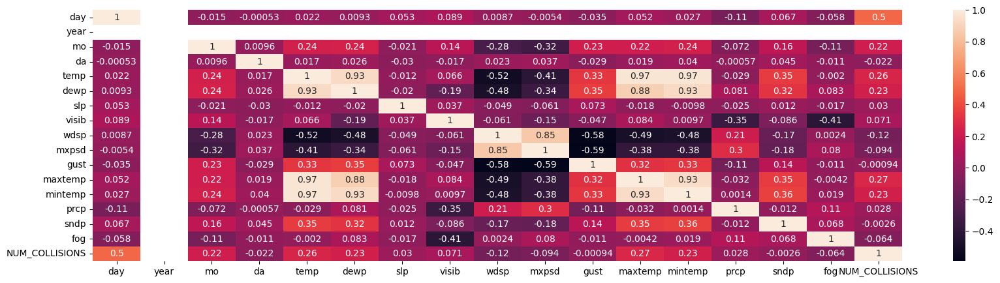

In [ ]:
corrMatrix = df_2017.corr() # 2017 correlation matrix
sn.heatmap(corrMatrix, annot=True)
plt.show()

Strongest correlation for Day against NUM_COLLISIONS when Saturday = 1 again.

**2017 temp vs num_collisions**

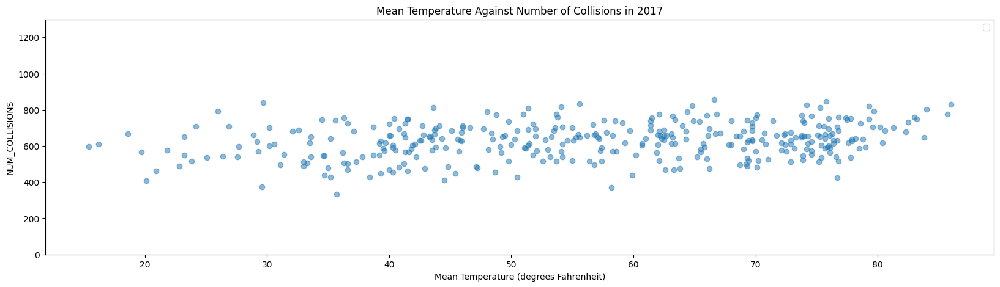

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2017.temp, df_2017.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Mean Temperature Against Number of Collisions in 2017")
plt.xlabel("Mean Temperature (degrees Fahrenheit)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**2017 dewp vs num_collisions**

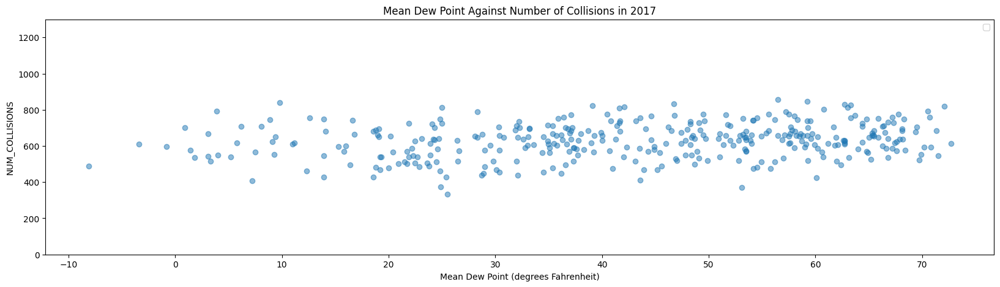

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2017.dewp, df_2017.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Mean Dew Point Against Number of Collisions in 2017")
plt.xlabel("Mean Dew Point (degrees Fahrenheit)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**2017 slp vs num_collisions**

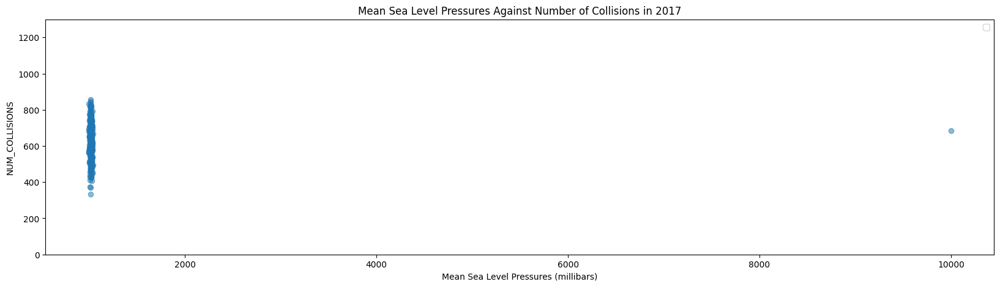

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2017.slp, df_2017.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Mean Sea Level Pressures Against Number of Collisions in 2017")
plt.xlabel("Mean Sea Level Pressures (millibars)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

Missing data present

In [ ]:
# Finding number of missing datapoints
print(df_2017["slp"].count())
df_2017_slptest = df_2017[df_2017["slp"] < 2000]
print(df_2017_slptest["slp"].count())

360
359


Replacing one missing data point

In [ ]:
avg_value = df_2017[df_2017['slp'] <= 2000]['slp'].mean()
from sklearn.impute import SimpleImputer
import numpy as np
pd.set_option('display.max_rows', None)
imputer = SimpleImputer(missing_values=9999.9, strategy='mean')

slpcolumn =  df_2017['slp'].copy()
slpcolumn = np.array([slpcolumn]).reshape(-1, 1)
imputer.fit(slpcolumn)
slpcolumn = imputer.transform(slpcolumn)
df_2017['slp'] = slpcolumn

new_avg = df_2017['slp'].mean()
print(avg_value, new_avg)

1016.5066852367687 1016.5066852367687


<ipython-input-140-9d495c1b483f>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2017['slp'] = slpcolumn


Final visualisation

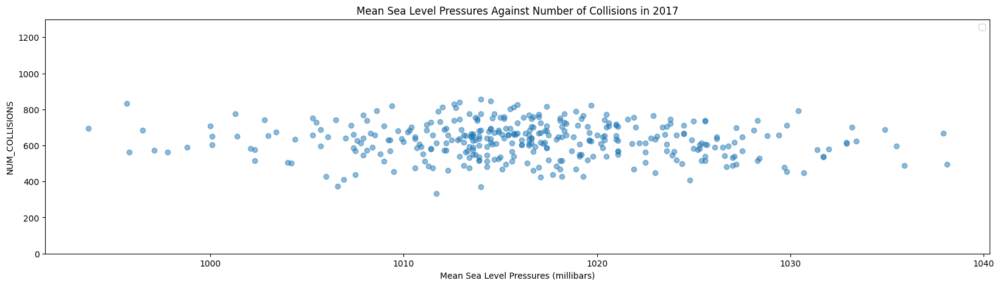

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2017.slp, df_2017.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Mean Sea Level Pressures Against Number of Collisions in 2017")
plt.xlabel("Mean Sea Level Pressures (millibars)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**2017 visib vs num_collisions**

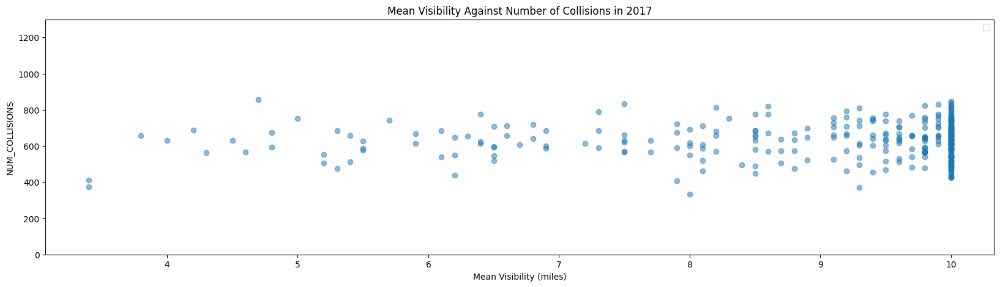

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2017.visib, df_2017.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Mean Visibility Against Number of Collisions in 2017")
plt.xlabel("Mean Visibility (miles)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**2017 wind speed vs num_collisions**

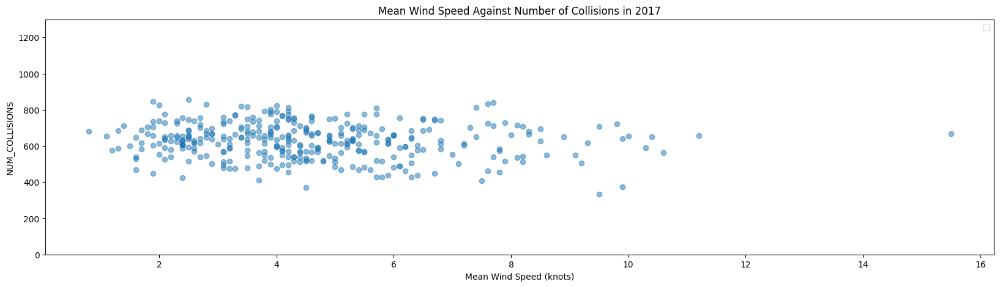

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2017.wdsp, df_2017.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Mean Wind Speed Against Number of Collisions in 2017")
plt.xlabel("Mean Wind Speed (knots)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**2017 max wind speed vs num_collisions**

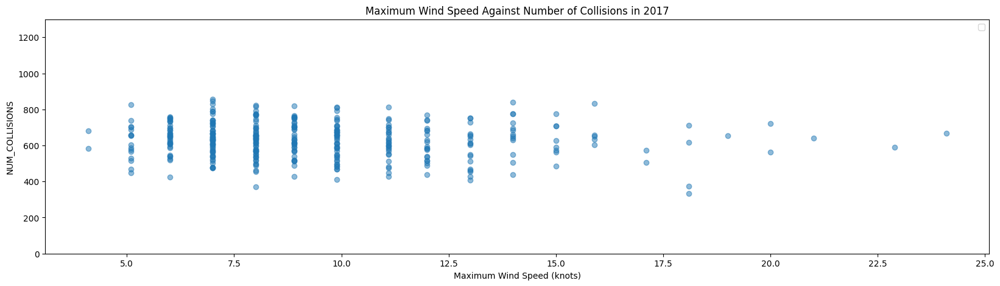

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2017.mxpsd, df_2017.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Maximum Wind Speed Against Number of Collisions in 2017")
plt.xlabel("Maximum Wind Speed (knots)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**2017 max temp vs num_collisions**

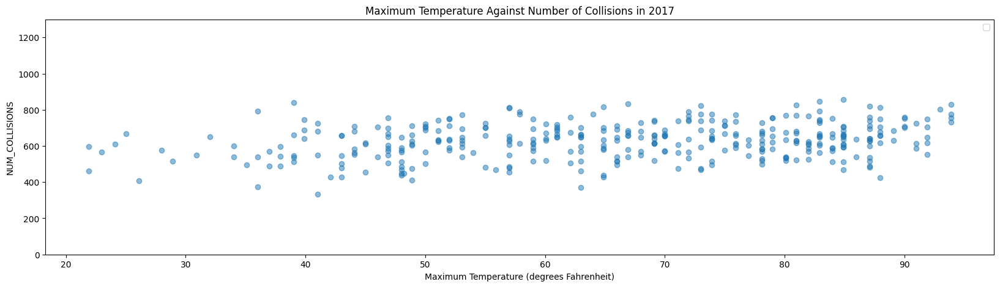

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2017.maxtemp, df_2017.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Maximum Temperature Against Number of Collisions in 2017")
plt.xlabel("Maximum Temperature (degrees Fahrenheit)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**2017 min temp vs num_collisions**

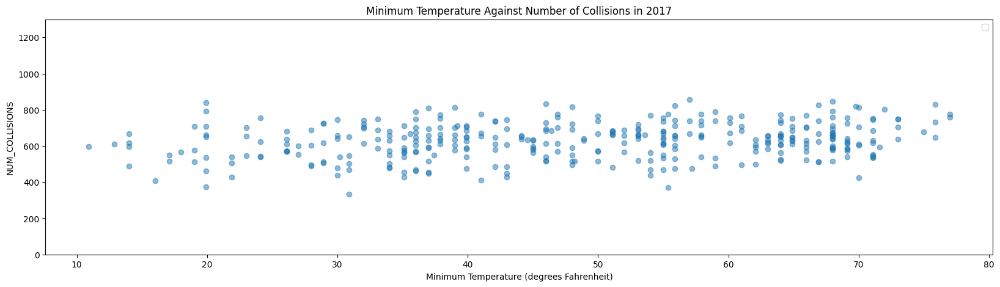

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2017.mintemp, df_2017.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Minimum Temperature Against Number of Collisions in 2017")
plt.xlabel("Minimum Temperature (degrees Fahrenheit)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**2017 prcp vs num_collisions**

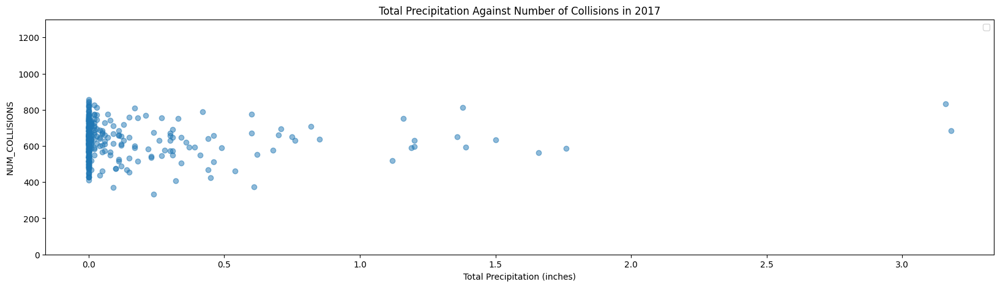

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2017.prcp, df_2017.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Total Precipitation Against Number of Collisions in 2017")
plt.xlabel("Total Precipitation (inches)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**Collisions each day acrosss 2017**

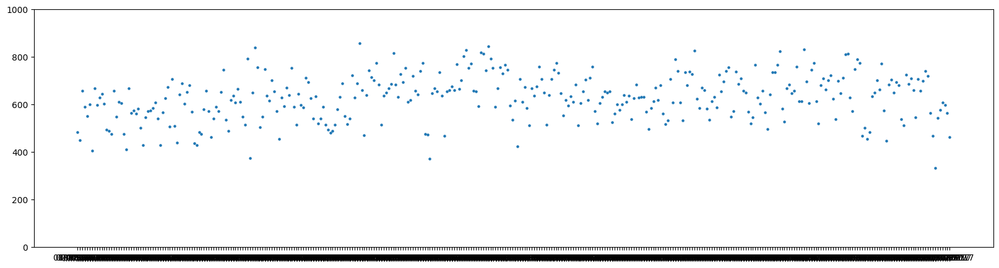

In [ ]:
plt.ylim(0, 1000)
plt.scatter(df_2017.collision_date, df_2017.NUM_COLLISIONS, s=5)
plt.show()

Similar pattern to previous years

<ipython-input-149-f085d5050ae6>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corrMatrix = df_2017.corr() # Final 2017 correlation matrix


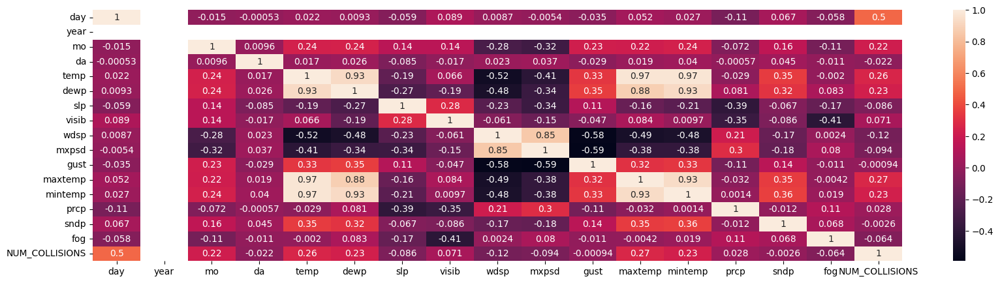

In [ ]:
corrMatrix = df_2017.corr() # Final 2017 correlation matrix
sn.heatmap(corrMatrix, annot=True)
plt.show()

**Creating 2018 dataset**

In [ ]:
# Creating dataset for 2018
df_2018 = df_cleaned[df_cleaned["year"] == 2018]

<ipython-input-151-fc9ce5e061de>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corrMatrix = df_2018.corr() # 2018 correlation matrix


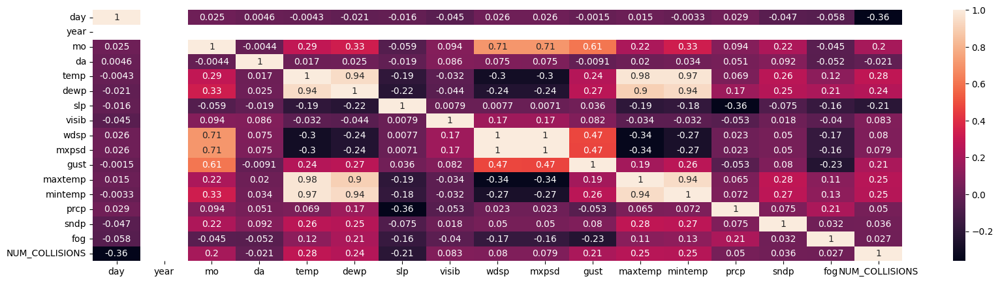

In [ ]:
corrMatrix = df_2018.corr() # 2018 correlation matrix
sn.heatmap(corrMatrix, annot=True)
plt.show()

**2018 day of the week vs num_collisions**

In [ ]:
df_2018.loc[df_2018['day'] > 0, 'day'] = df_2018['day']+2 # change all days by adding 1.
df_2018.loc[df_2018['day'] == 9, 'day'] = 2
df_2018.loc[df_2018['day'] == 8, 'day'] = 1

<ipython-input-152-12e9518f52c0>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2018.loc[df_2018['day'] > 0, 'day'] = df_2018['day']+2 # change all days by adding 1.


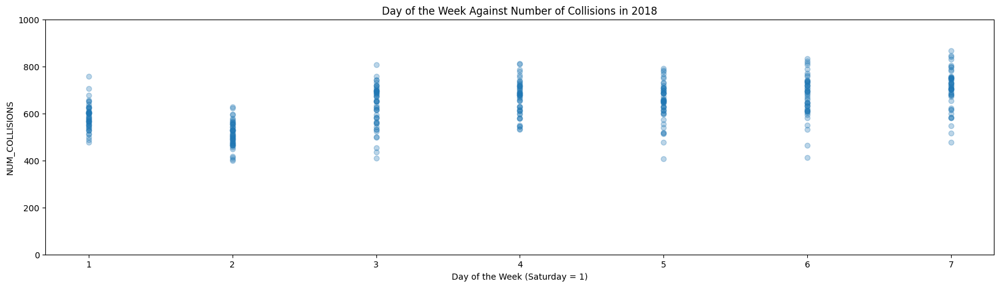

In [ ]:
plt.ylim(0, 1000)
plt.scatter(df_2018.day, df_2018.NUM_COLLISIONS, alpha=0.3)
plt.title("Day of the Week Against Number of Collisions in 2018")
plt.xlabel("Day of the Week (Saturday = 1)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

<ipython-input-154-fc9ce5e061de>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corrMatrix = df_2018.corr() # 2018 correlation matrix


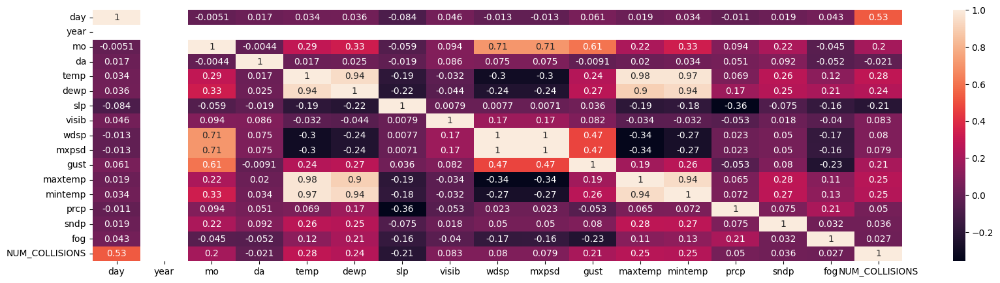

In [ ]:
corrMatrix = df_2018.corr() # 2018 correlation matrix
sn.heatmap(corrMatrix, annot=True)
plt.show()

Strongest correlation for Day when Saturday = 1.

Gust correlation unusually high compared to the other years. Wdsp is now positive correlation

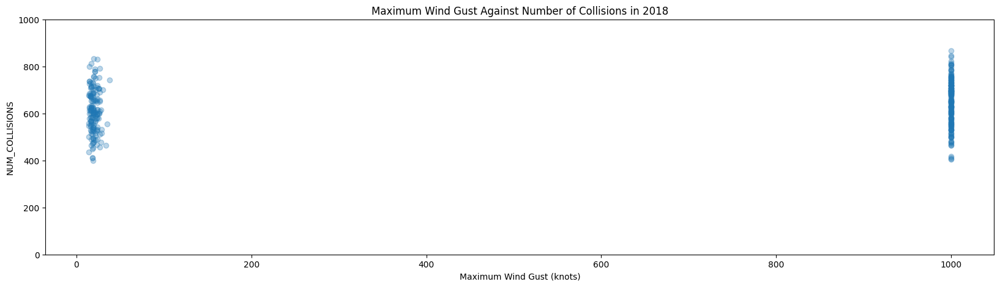

In [ ]:
plt.ylim(0, 1000)
plt.scatter(df_2018.gust, df_2018.NUM_COLLISIONS, alpha=0.3)
plt.title("Maximum Wind Gust Against Number of Collisions in 2018")
plt.xlabel("Maximum Wind Gust (knots)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

In [ ]:
print(df_2018["gust"].count())
df_2018_gusttest = df_2018[df_2018["gust"] < 200]
print(df_2018_gusttest["gust"].count())

361
159


Too good to be true, half of 2018 gust is missing data.

**2018 temp vs num_collisions**

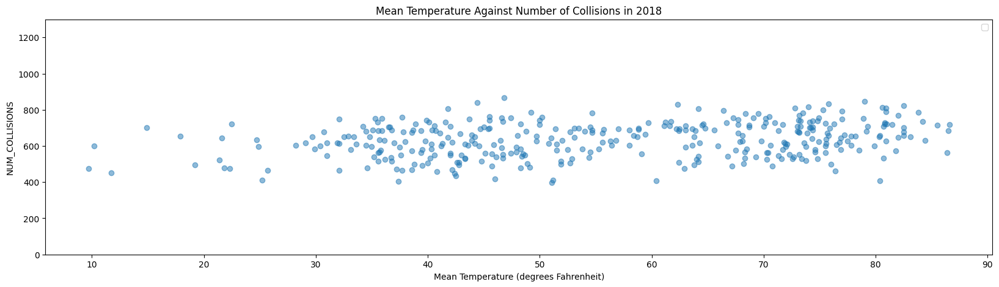

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2018.temp, df_2018.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Mean Temperature Against Number of Collisions in 2018")
plt.xlabel("Mean Temperature (degrees Fahrenheit)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**2018 dew point vs num_collisions**

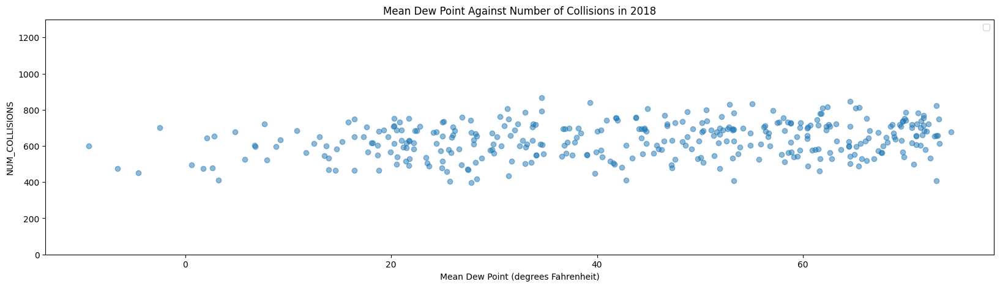

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2018.dewp, df_2018.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Mean Dew Point Against Number of Collisions in 2018")
plt.xlabel("Mean Dew Point (degrees Fahrenheit)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**2018 slp vs num_collisions**

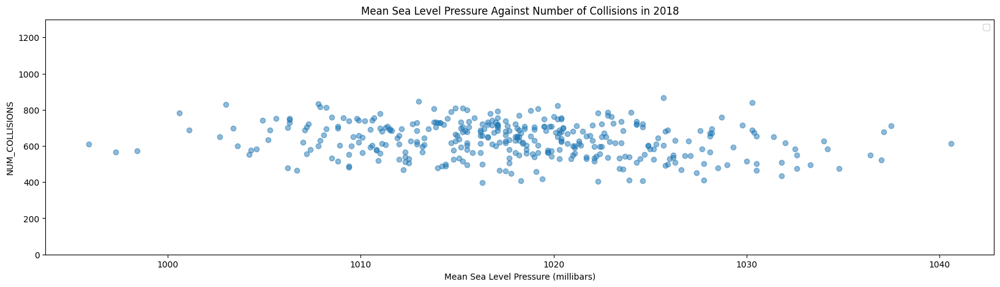

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2018.slp, df_2018.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Mean Sea Level Pressure Against Number of Collisions in 2018")
plt.xlabel("Mean Sea Level Pressure (millibars)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**2018 visib vs num_collisions**

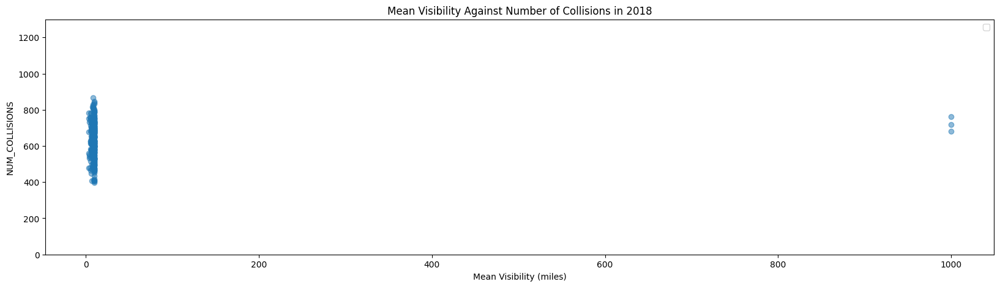

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2018.visib, df_2018.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Mean Visibility Against Number of Collisions in 2018")
plt.xlabel("Mean Visibility (miles)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

Missing data present

In [ ]:
# Finding number of missing datapoints
print(df_2018["visib"].count())
df_2018_visibtest = df_2018[df_2018["visib"] < 200]
print(df_2018_visibtest["visib"].count())

361
358


Replacing 3 missing data points

In [ ]:
avg_visib_value = df_2018[df_2018['visib'] <= 200]['visib'].mean()
from sklearn.impute import SimpleImputer
import numpy as np
pd.set_option('display.max_rows', None)
imputer = SimpleImputer(missing_values=999.9, strategy='mean')

visibcolumn =  df_2018['visib'].copy()
visibcolumn = np.array([visibcolumn]).reshape(-1, 1)
imputer.fit(visibcolumn)
visibcolumn = imputer.transform(visibcolumn)
df_2018['visib'] = visibcolumn

newvisib_avg = df_2018['visib'].mean()
print(avg_visib_value, newvisib_avg)

8.86145251396648 8.86145251396648


<ipython-input-162-caea7aeed4ea>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2018['visib'] = visibcolumn


Final visualisation

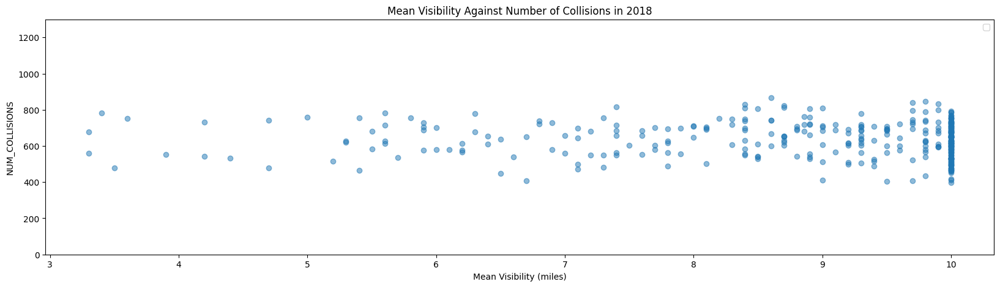

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2018.visib, df_2018.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Mean Visibility Against Number of Collisions in 2018")
plt.xlabel("Mean Visibility (miles)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**2018 wind speed vs num_collisions**

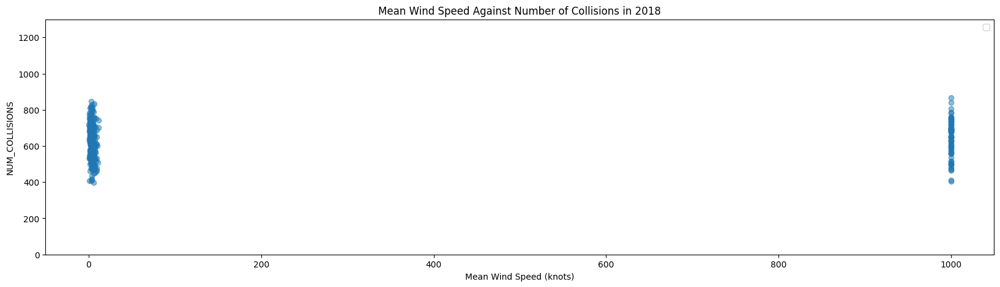

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2018.wdsp, df_2018.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Mean Wind Speed Against Number of Collisions in 2018")
plt.xlabel("Mean Wind Speed (knots)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

Missing data present

In [ ]:
# Finding number of missing datapoints
print(df_2018["wdsp"].count())
df_2018_wdsptest = df_2018[df_2018["wdsp"] < 200]
print(df_2018_wdsptest["wdsp"].count())

361
280


81 missing data points - take average (POTENTIALLY PROBLEMATIC - may skew data)

In [ ]:
avg_wdsp_value = df_2018[df_2018['wdsp'] <= 200]['wdsp'].mean()
from sklearn.impute import SimpleImputer
import numpy as np
pd.set_option('display.max_rows', None)
imputer = SimpleImputer(missing_values=999.9, strategy='mean')

wdspcolumn =  df_2018['wdsp'].copy()
wdspcolumn = np.array([wdspcolumn]).reshape(-1, 1)
imputer.fit(wdspcolumn)
wdspcolumn = imputer.transform(wdspcolumn)
df_2018['wdsp'] = wdspcolumn

newwdsp_avg = df_2018['wdsp'].mean()
print(avg_wdsp_value, newwdsp_avg)

3.9153571428571428 3.9153571428571423


<ipython-input-166-a96cae700407>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2018['wdsp'] = wdspcolumn


Final visualisation

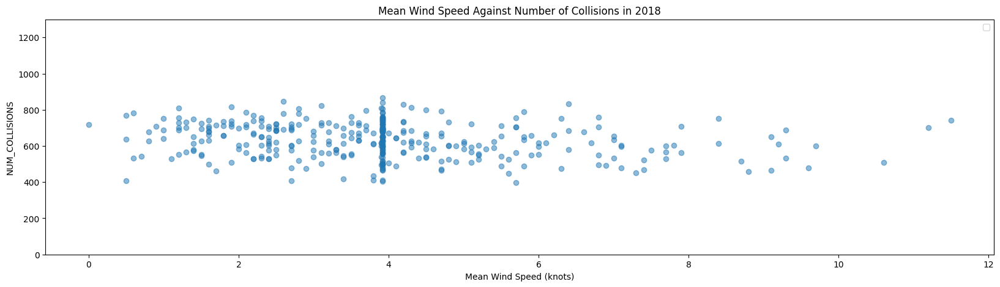

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2018.wdsp, df_2018.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Mean Wind Speed Against Number of Collisions in 2018")
plt.xlabel("Mean Wind Speed (knots)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**2018 max wind speed vs num_collisions**

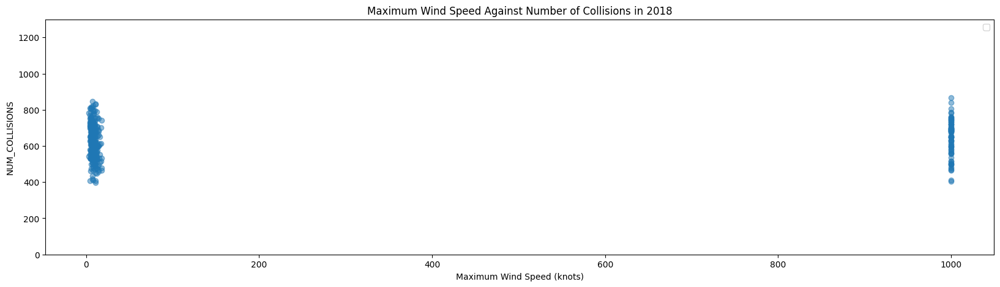

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2018.mxpsd, df_2018.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Maximum Wind Speed Against Number of Collisions in 2018")
plt.xlabel("Maximum Wind Speed (knots)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

Missing data present

In [ ]:
# Finding number of missing datapoints
print(df_2018["mxpsd"].count())
df_2018_mxpsdtest = df_2018[df_2018["mxpsd"] < 200]
print(df_2018_mxpsdtest["mxpsd"].count())

361
280


Replacing 81 missing data points

In [ ]:
avg_mxpsd_value = df_2018[df_2018['mxpsd'] <= 200]['mxpsd'].mean()
from sklearn.impute import SimpleImputer
import numpy as np
pd.set_option('display.max_rows', None)
imputer = SimpleImputer(missing_values=999.9, strategy='mean')

mxpsdcolumn =  df_2018['mxpsd'].copy()
mxpsdcolumn = np.array([mxpsdcolumn]).reshape(-1, 1)
imputer.fit(mxpsdcolumn)
mxpsdcolumn = imputer.transform(mxpsdcolumn)
df_2018['mxpsd'] = mxpsdcolumn

newmxpsd_avg = df_2018['mxpsd'].mean()
print(avg_mxpsd_value, newmxpsd_avg)

<ipython-input-170-fa0919f98af4>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2018['mxpsd'] = mxpsdcolumn


8.562142857142858 8.562142857142858


Final visualisation

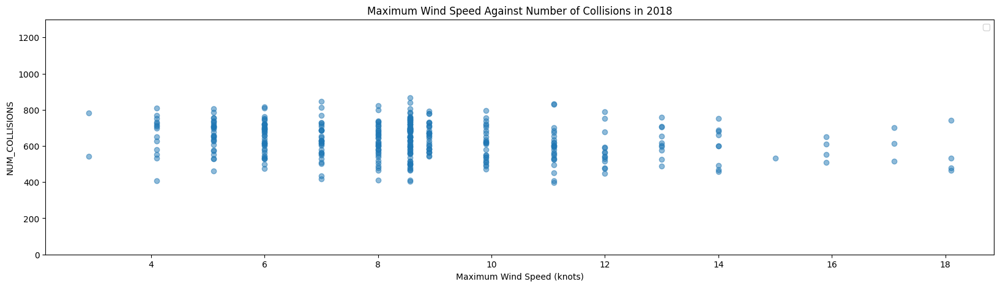

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2018.mxpsd, df_2018.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Maximum Wind Speed Against Number of Collisions in 2018")
plt.xlabel("Maximum Wind Speed (knots)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**2018 max temp vs num_collisions**

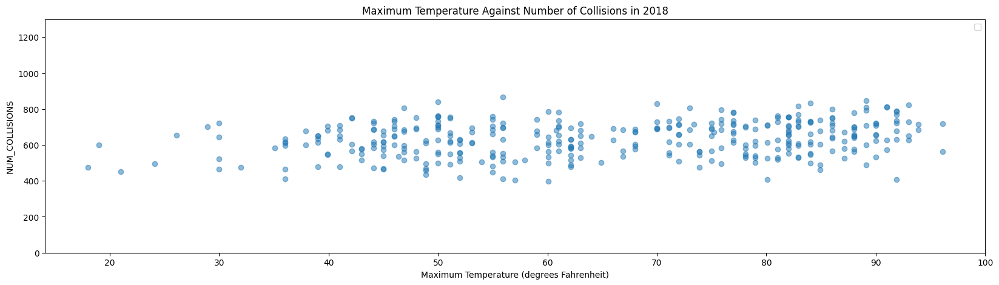

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2018.maxtemp, df_2018.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Maximum Temperature Against Number of Collisions in 2018")
plt.xlabel("Maximum Temperature (degrees Fahrenheit)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**2018 min temp vs num_collisions**

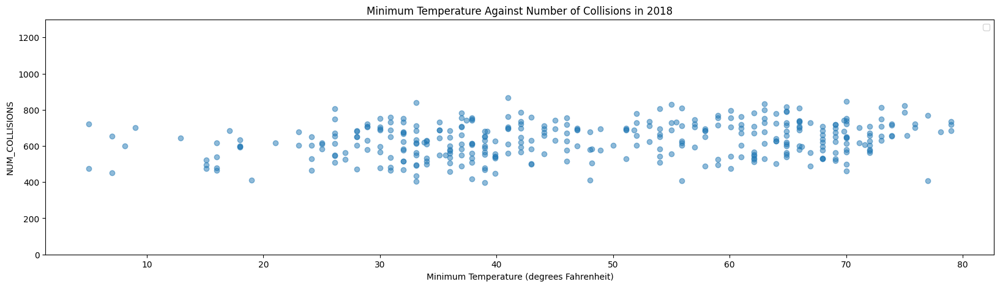

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2018.mintemp, df_2018.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Minimum Temperature Against Number of Collisions in 2018")
plt.xlabel("Minimum Temperature (degrees Fahrenheit)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

**2018 prcp vs num_collisions**

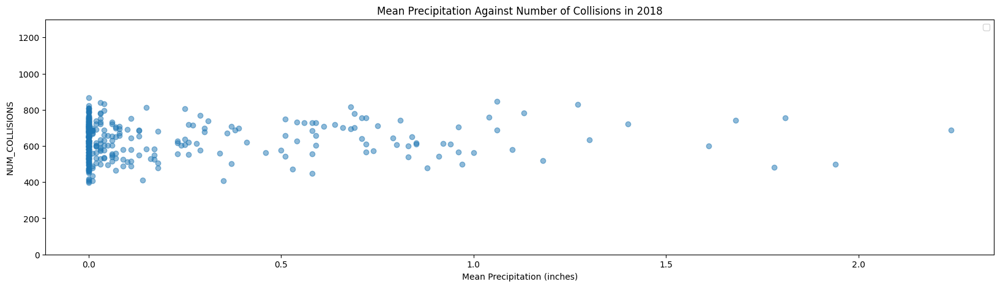

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2018.prcp, df_2018.NUM_COLLISIONS, alpha=0.5)
plt.legend()
plt.title("Mean Precipitation Against Number of Collisions in 2018")
plt.xlabel("Mean Precipitation (inches)")
plt.ylabel("NUM_COLLISIONS")
plt.show()

Collisions across 2018

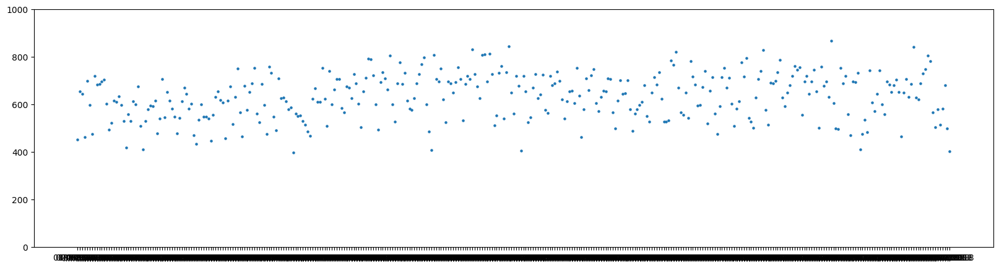

In [ ]:
plt.ylim(0, 1000)
plt.scatter(df_2018.collision_date, df_2018.NUM_COLLISIONS, s=5)
plt.show()

Same trend as previous years

<ipython-input-176-2453b95ec69d>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corrMatrix = df_2018.corr() # Final 2018 correlation matrix


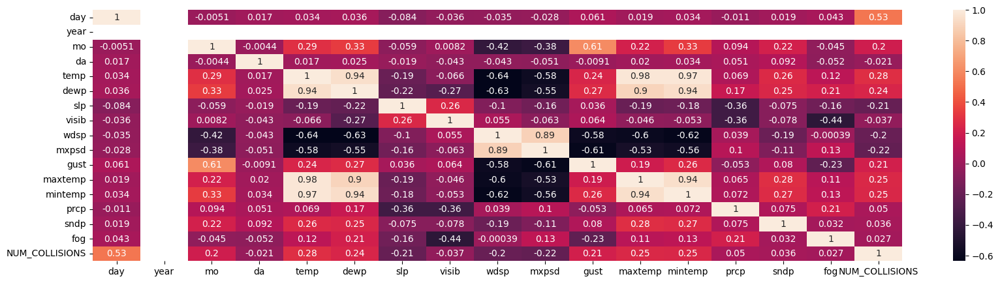

In [ ]:
corrMatrix = df_2018.corr() # Final 2018 correlation matrix
sn.heatmap(corrMatrix, annot=True)
plt.show()

So far, 2013 and 2017 were the years with least trouble with regards to missing datapoints. All of the missing datapoints were replaced with mean values of each variable for that year instead of ignoring the variables/deleting the missing values.

There is quite a significant amount of missing datapoints for wdsp and mxspd, especially in 2018. Because of this, an extra linear regression model will be created to account for this, one that includes wdsp and mxpsd, as well as one without.


**Finalising the Entire Dataset**

Number of datapoints (days) per year post-cleaning

In [ ]:
print('2013 ', df_2013['day'].count())
print('2014 ', df_2014['day'].count())
print('2015 ', df_2015['day'].count())
print('2016 ', df_2016['day'].count())
print('2017 ', df_2017['day'].count())
print('2018 ', df_2018['day'].count())

2013  364
2014  361
2015  360
2016  364
2017  360
2018  361


Max and Min number of collisions per year

In [ ]:
print("2013", df_2013.NUM_COLLISIONS.max(), df_2013.NUM_COLLISIONS.min())
print("2014", df_2014.NUM_COLLISIONS.max(), df_2014.NUM_COLLISIONS.min())
print("2015", df_2015.NUM_COLLISIONS.max(), df_2015.NUM_COLLISIONS.min())
print("2016", df_2016.NUM_COLLISIONS.max(), df_2016.NUM_COLLISIONS.min())
print("2017", df_2017.NUM_COLLISIONS.max(), df_2017.NUM_COLLISIONS.min())
print("2018", df_2018.NUM_COLLISIONS.max(), df_2018.NUM_COLLISIONS.min())

2013 867 355
2014 792 344
2015 830 341
2016 872 365
2017 857 333
2018 867 399


All in the hundreds - does not go above 1000 per day (since we removed outliers)

In [ ]:
all_years = [df_2013, df_2014, df_2015, df_2016, df_2017, df_2018] # Creating one final cleaned dataset
df_final = pd.concat(all_years)
print(df_final["day"].count())

2170


In [ ]:
df_final.head()

,day,year,mo,da,collision_date,temp,dewp,slp,visib,wdsp,mxpsd,gust,maxtemp,mintemp,prcp,sndp,fog,NUM_COLLISIONS
0,4,2013,1,1,01/01/2013,37.8,23.6,1011.9,10.0,6.1,8.9,19.0,39.9,33.1,0.0,999.9,0,381
1,5,2013,1,2,02/01/2013,27.1,10.5,1016.8,10.0,5.3,9.9,19.0,33.1,21.9,0.0,999.9,0,480
2,6,2013,1,3,03/01/2013,28.4,14.1,1020.6,10.0,3.7,8.0,15.0,32.0,24.1,0.0,999.9,0,549
3,7,2013,1,4,04/01/2013,33.4,18.6,1017.0,10.0,6.5,13.0,24.1,37.0,30.0,0.0,999.9,0,505
4,1,2013,1,5,05/01/2013,36.1,18.7,1020.6,10.0,6.6,12.0,21.0,42.1,32.0,0.0,999.9,0,389


Visualising the yearly trend for number of collisions per day from 2013 to 2018.

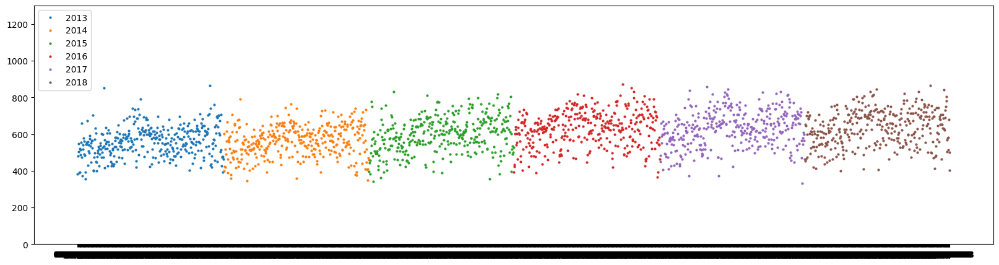

In [ ]:
plt.rcParams["figure.figsize"] = (20,5)
groups = df_cleaned.groupby('year') # We group by year as we want to create a legend and make the visualisation clearer using colour.
plt.ylim(0, 1300)
for name, group in groups:
    plt.plot(group.collision_date, group.NUM_COLLISIONS, marker='o', linestyle='', markersize=2, label=name)

plt.legend()

As seen above, the overall trend is very similar throughout each year. There is a general rise in the number of collisions at the start of the year with a slight drop at the start of summer until fall. It then rises back up towards winter where at December it drops off again.

In [ ]:
df_final['collision_date_no_year'] = df_final['collision_date'] # create a new column with values the same as pickup_date

In [ ]:
# remove year from the string
df_final['collision_date_no_year'] = df_final['collision_date_no_year'].str.replace('2013','')
df_final['collision_date_no_year'] = df_final['collision_date_no_year'].str.replace('2014','')
df_final['collision_date_no_year'] = df_final['collision_date_no_year'].str.replace('2015','')
df_final['collision_date_no_year'] = df_final['collision_date_no_year'].str.replace('2016','')
df_final['collision_date_no_year'] = df_final['collision_date_no_year'].str.replace('2017','')
df_final['collision_date_no_year'] = df_final['collision_date_no_year'].str.replace('2018','')

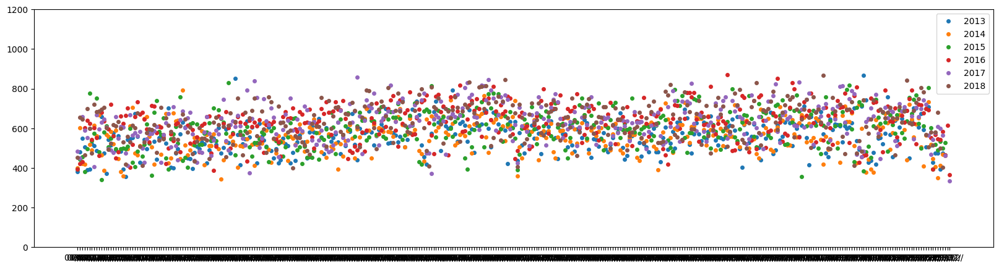

In [ ]:
groups = df_final.groupby('year') # We group by year as we want to create a legend and make the visualisation clearer using colour.
plt.ylim(0, 1200)
for name, group in groups:
    plt.plot(group.collision_date_no_year, group.NUM_COLLISIONS, marker='o', linestyle='', markersize=4, label=name)

plt.legend()

The trend is confirmed when overlapping the number of collisions each day for all the six years

(array([ 39., 144., 369., 516., 564., 352., 149.,  37.]),
 array([333.   , 400.375, 467.75 , 535.125, 602.5  , 669.875, 737.25 ,
        804.625, 872.   ]),
 <BarContainer object of 8 artists>)

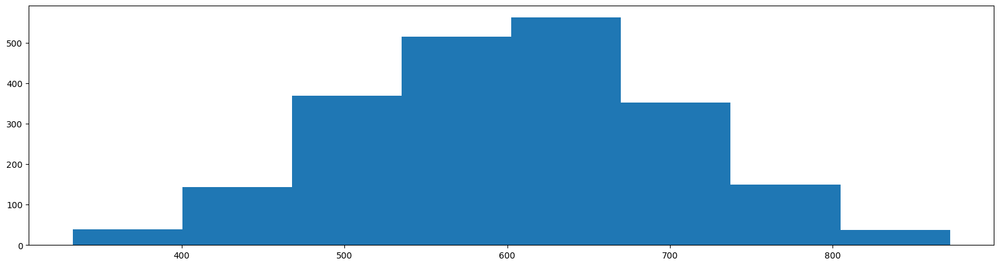

In [ ]:
plt.hist(df_final['NUM_COLLISIONS'], bins=8)

The data does not exactly show a normal distribution and is quite skewed which will be dealt with later when building the regression model.

**Showing the final correlation matrix**

<ipython-input-186-47b05f8ad933>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corrMatrix = df_final.corr() # Final correlation matrix


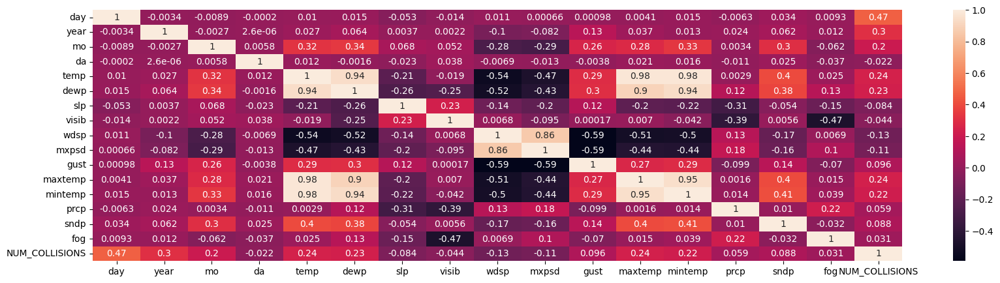

In [ ]:
corrMatrix = df_final.corr() # Final correlation matrix
sn.heatmap(corrMatrix, annot=True)
plt.show()

As before, Day, temp, dewp, maxtemp and mintemp have higher correlations to NUM_COLLISIONS relative to other variables, ignoring year, mo and da.

In [ ]:
df_final_linear = df_final

**Exploring Annual Collision Pattern**

As seen before, there seemed to be a similar pattern in the amount of collisions per day throughout each year which will be investigated further below.

First, the annual data will be overlapped as was done previously but will also be separated by month.

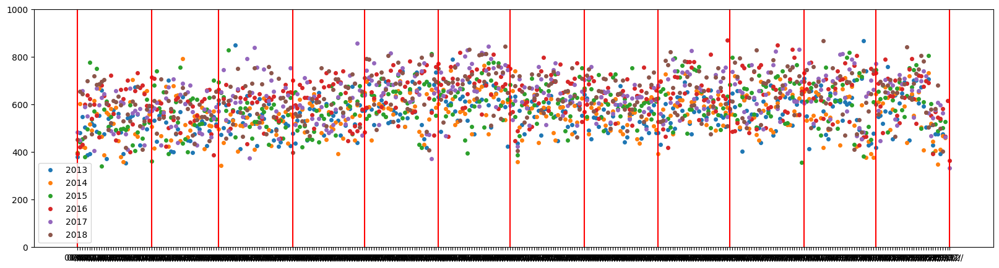

In [ ]:
groups = df_final.groupby('year') # We group by year as we want to create a legend and make the visualisation clearer using colour.
fig, ax = plt.subplots();
plt.ylim(0, 1000)
for name, group in groups:
    plt.plot(group.collision_date_no_year, group.NUM_COLLISIONS, marker='o', linestyle='', markersize=4, label=name)

plt.legend()
ax.axvline(x=0, ymin=0.0, ymax=1.0, color='r')
ax.axvline(x=31, ymin=0.0, ymax=1.0, color='r')
ax.axvline(x=59, ymin=0.0, ymax=1.0, color='r')
ax.axvline(x=90, ymin=0.0, ymax=1.0, color='r')
ax.axvline(x=120, ymin=0.0, ymax=1.0, color='r')
ax.axvline(x=151, ymin=0.0, ymax=1.0, color='r')
ax.axvline(x=181, ymin=0.0, ymax=1.0, color='r')
ax.axvline(x=212, ymin=0.0, ymax=1.0, color='r')
ax.axvline(x=243, ymin=0.0, ymax=1.0, color='r')
ax.axvline(x=273, ymin=0.0, ymax=1.0, color='r')
ax.axvline(x=304, ymin=0.0, ymax=1.0, color='r')
ax.axvline(x=334, ymin=0.0, ymax=1.0, color='r')
ax.axvline(x=365, ymin=0.0, ymax=1.0, color='r')

**January**

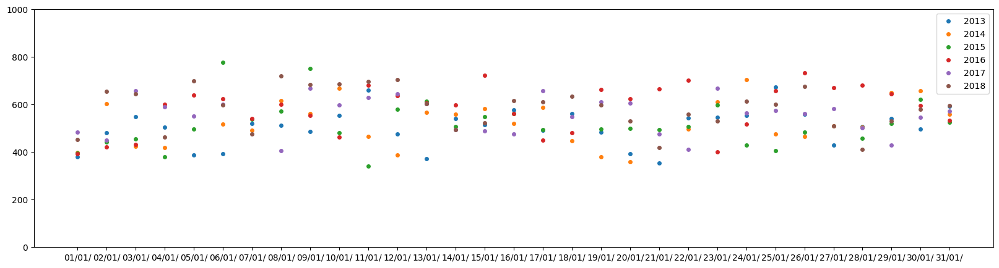

In [ ]:
# Plotting NUM_COLLISIONS for January
df_final_jan = df_final[df_final["mo"] == 1]
groups = df_final_jan.groupby('year') # We group by year as we want to create a legend and make the visualisation clearer using colour.
plt.ylim(0, 1000)
for name, group in groups:
    plt.plot(group.collision_date_no_year, group.NUM_COLLISIONS, marker='o', linestyle='', markersize=4, label=name)

plt.legend()

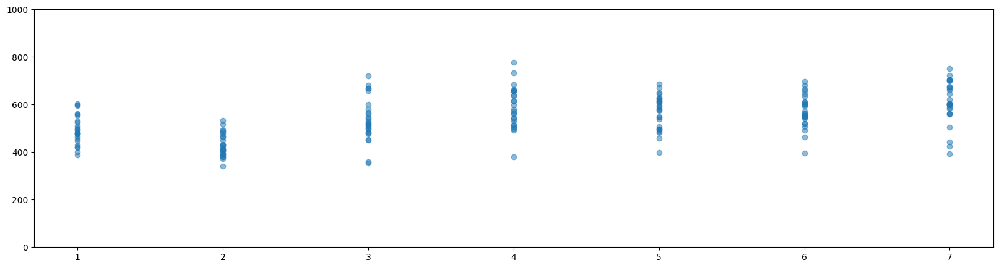

In [ ]:
# Plotting day of the week vs NUM_COLLISIONS in January
plt.ylim(0, 1000)
plt.scatter(df_final_jan.day, df_final_jan.NUM_COLLISIONS, alpha=0.5)
plt.show()

<ipython-input-191-b2535df8f672>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corrMatrix = df_final_jan.corr()


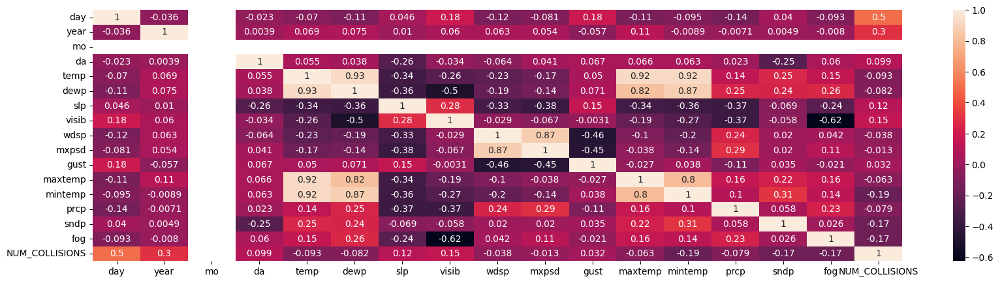

In [ ]:
# Plotting the correlation matrix for January 2013 to 2018
corrMatrix = df_final_jan.corr()
sn.heatmap(corrMatrix, annot=True)
plt.show()

Day of the week still has quite a similar correlation to NUM_COLLISIONS to previous analysis. We can see that temp, dewp, maxtemp and mintemp have very weak correlations now to NUM_COLLISIONS compared to when comparing by year.

**February** - Doing the same analaysis for Feb

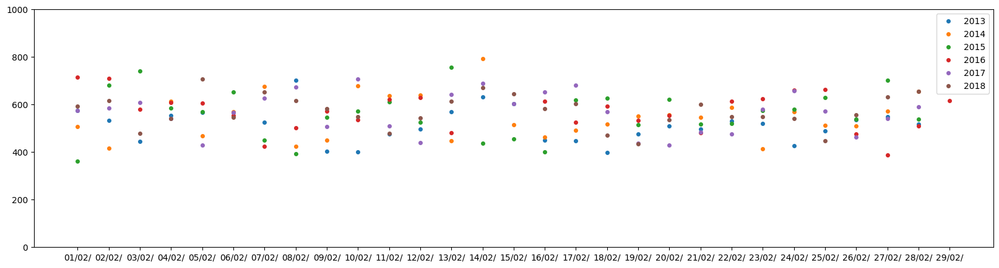

In [ ]:
# Plotting NUM_COLLISIONS for Feb
df_final_feb = df_final[df_final["mo"] == 2]
groups = df_final_feb.groupby('year') # We group by year as we want to create a legend and make the visualisation clearer using colour.
plt.ylim(0, 1000)
for name, group in groups:
    plt.plot(group.collision_date_no_year, group.NUM_COLLISIONS, marker='o', linestyle='', markersize=4, label=name)

plt.legend()

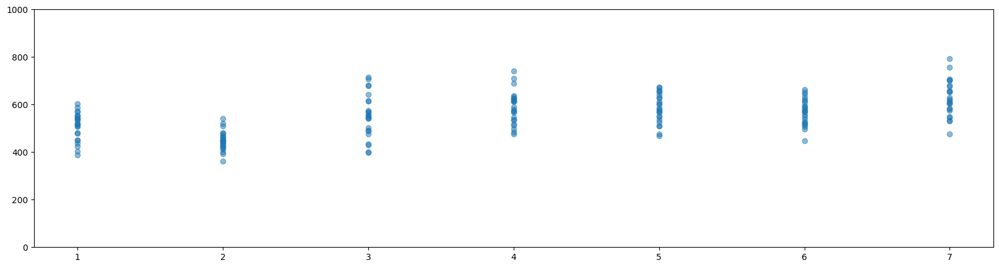

In [ ]:
# Day of the week vs NUM_COLLISIONS
plt.ylim(0, 1000)
plt.scatter(df_final_feb.day, df_final_feb.NUM_COLLISIONS, alpha=0.5)
plt.show()

<ipython-input-194-c0004ffbf900>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corrMatrix = df_final_feb.corr()


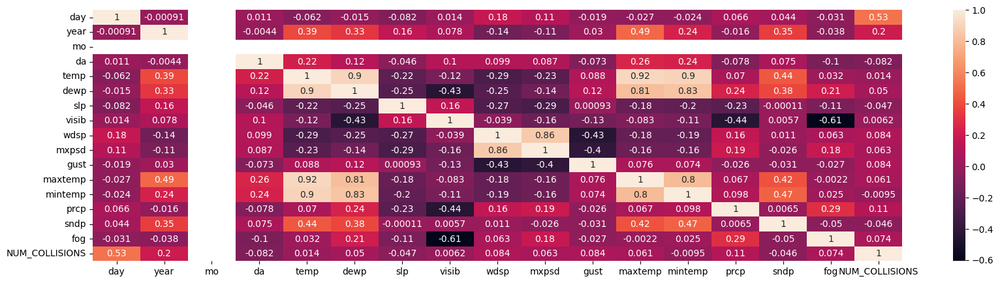

In [ ]:
# Final Correlation Matrix
corrMatrix = df_final_feb.corr()
sn.heatmap(corrMatrix, annot=True)
plt.show()

Slightly higher correlation at 0.53

**MARCH**

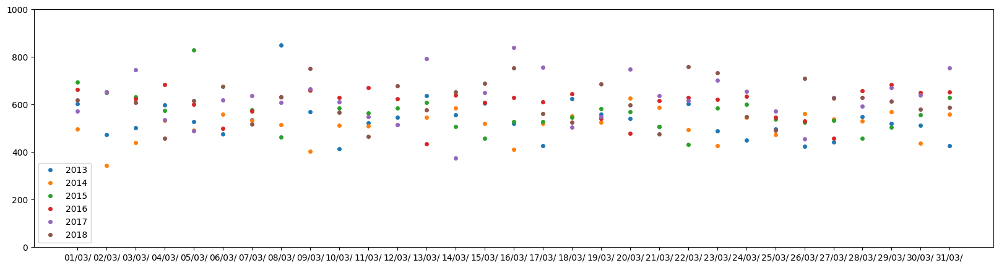

In [ ]:
# Plotting NUM_COLLISIONS for March
df_final_march = df_final[df_final["mo"] == 3]
groups = df_final_march.groupby('year') # We group by year as we want to create a legend and make the visualisation clearer using colour.
plt.ylim(0, 1000)
for name, group in groups:
    plt.plot(group.collision_date_no_year, group.NUM_COLLISIONS, marker='o', linestyle='', markersize=4, label=name)

plt.legend()

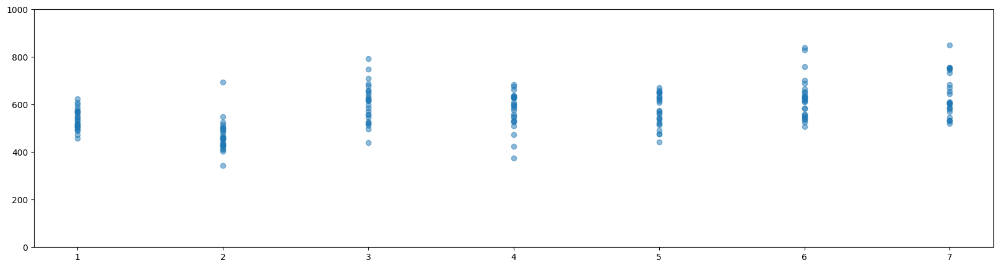

In [ ]:
# Day of the week vs NUM_COLLISIONS
plt.ylim(0, 1000)
plt.scatter(df_final_march.day, df_final_march.NUM_COLLISIONS, alpha=0.5)
plt.show()

<ipython-input-197-56999a57828d>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corrMatrix = df_final_march.corr()


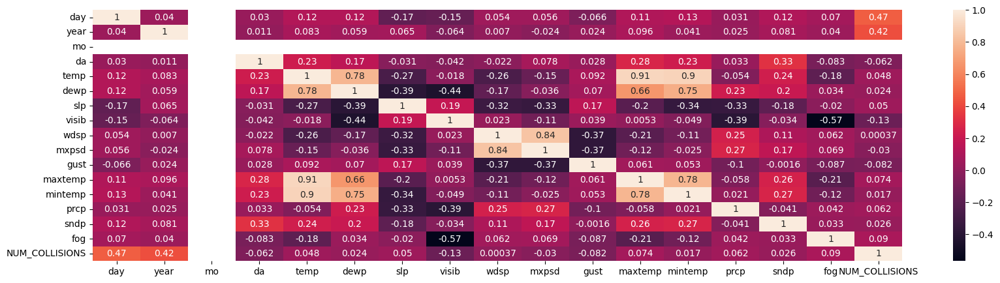

In [ ]:
# Final Correlation Matrix
corrMatrix = df_final_march.corr()
sn.heatmap(corrMatrix, annot=True)
plt.show()

Day vs NUM_COLLISIONS slightly decrease but year vs NUM_COLLISIONS increases.

**April**

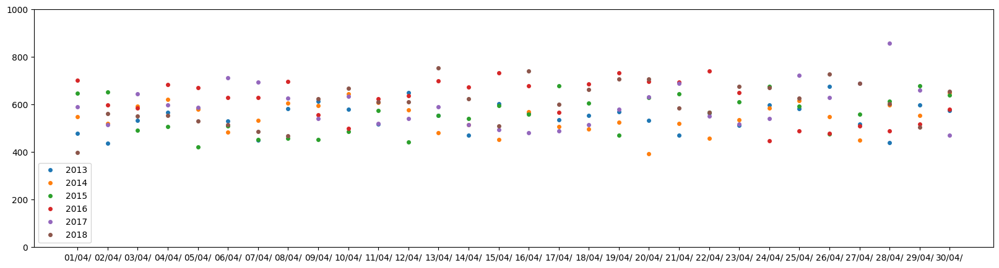

In [ ]:
# Plotting NUM_COLLISIONS for March
df_final_april = df_final[df_final["mo"] == 4]
groups = df_final_april.groupby('year') # We group by year as we want to create a legend and make the visualisation clearer using colour.
plt.ylim(0, 1000)
for name, group in groups:
    plt.plot(group.collision_date_no_year, group.NUM_COLLISIONS, marker='o', linestyle='', markersize=4, label=name)

plt.legend()

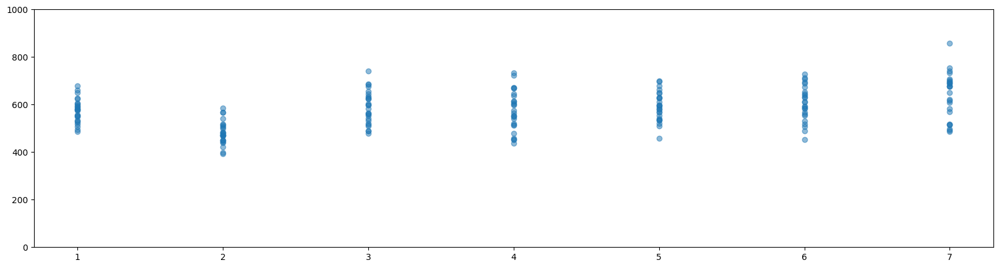

In [ ]:
# Day of the week vs NUM_COLLISIONS
plt.ylim(0, 1000)
plt.scatter(df_final_april.day, df_final_april.NUM_COLLISIONS, alpha=0.5)
plt.show()

<ipython-input-200-9c3ce5696b7f>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corrMatrix = df_final_april.corr()


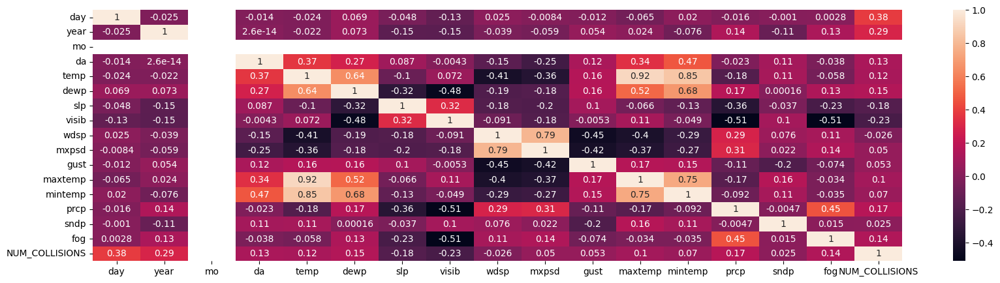

In [ ]:
# Final Correlation Matrix
corrMatrix = df_final_april.corr()
sn.heatmap(corrMatrix, annot=True)
plt.show()

Day vs NUM_COLLISIONS slightly weaker correlation but still the strongest out of all the other variables. At this point it might be possible to assume that including month and year may help improve our model (particularly the DNN model), by searching for correlations that might not be apparent to us directly.

**Importing 2019 test data for use in Section 4 and 5**

In [ ]:
df_2019_test_data = pd.read_csv('/content/gdrive/MyDrive/Colab Notebooks/LBD_testdata2019.csv')
df_2019_test_data = df_2019_test_data.sort_values(["year", "mo", "da"], ascending = (True, True, True))

In [ ]:
df_2019_test_data.head()

,day,year,mo,da,collision_date,temp,dewp,slp,visib,wdsp,mxpsd,gust,max,min,prcp,sndp,fog,NUM_COLLISIONS
0,2,2019,1,1,01/01/2019,50.5,43.2,1009.8,7.0,999.9,999.9,999.9,57.9,36.0,1.08,999.9,0,430
1,3,2019,1,2,02/01/2019,38.0,23.2,1024.2,10.0,999.9,999.9,999.9,57.9,35.1,0.06,999.9,0,502
2,4,2019,1,3,03/01/2019,41.1,29.4,1015.8,9.9,999.9,999.9,999.9,44.1,35.1,0.00,999.9,0,504
3,5,2019,1,4,04/01/2019,39.7,26.4,1014.8,9.9,999.9,999.9,999.9,46.0,35.1,0.00,999.9,0,598
4,6,2019,1,5,05/01/2019,44.2,41.0,1003.3,5.3,999.9,999.9,999.9,46.9,35.1,0.22,999.9,0,455


In [ ]:
df_2019_test_data.loc[df_2019_test_data['day'] > 0, 'day'] = df_2019_test_data['day']+2 # change all days by adding 2 so that Saturday = 1.
df_2019_test_data.loc[df_2019_test_data['day'] == 9, 'day'] = 2 # change days that equal 9 to day 2
df_2019_test_data.loc[df_2019_test_data['day'] == 8, 'day'] = 1 # change days that equal 8 to day 1

In [ ]:
df_2019_test_data.head()

,day,year,mo,da,collision_date,temp,dewp,slp,visib,wdsp,mxpsd,gust,max,min,prcp,sndp,fog,NUM_COLLISIONS
0,4,2019,1,1,01/01/2019,50.5,43.2,1009.8,7.0,999.9,999.9,999.9,57.9,36.0,1.08,999.9,0,430
1,5,2019,1,2,02/01/2019,38.0,23.2,1024.2,10.0,999.9,999.9,999.9,57.9,35.1,0.06,999.9,0,502
2,6,2019,1,3,03/01/2019,41.1,29.4,1015.8,9.9,999.9,999.9,999.9,44.1,35.1,0.00,999.9,0,504
3,7,2019,1,4,04/01/2019,39.7,26.4,1014.8,9.9,999.9,999.9,999.9,46.0,35.1,0.00,999.9,0,598
4,1,2019,1,5,05/01/2019,44.2,41.0,1003.3,5.3,999.9,999.9,999.9,46.9,35.1,0.22,999.9,0,455


In [ ]:
# Finding number of missing values for problematic columns out of 365 datapoints
print("slp: ", (df_2019_test_data['slp']> 2000).sum())
print("visib: ", (df_2019_test_data['visib']> 100).sum())
print("wdsp: ", (df_2019_test_data['wdsp']> 100).sum())
print("mxpsd: ", (df_2019_test_data['mxpsd']> 100).sum())
print("gust: ", (df_2019_test_data['gust']> 100).sum())
print("sndp: ", (df_2019_test_data['sndp']> 200).sum())

slp:  1
visib:  0
wdsp:  70
mxpsd:  70
gust:  201
sndp:  354


wdsp, mxpsd, gust and sndp most likely unusable due to significant amount of missing data

Cleaning slp in 2019 dataset

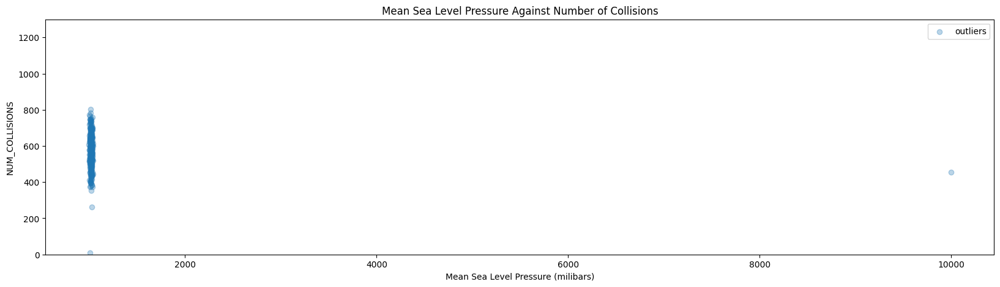

In [ ]:
plt.ylim(0, 1300)
plt.scatter(df_2019_test_data.slp, df_2019_test_data.NUM_COLLISIONS, alpha=0.3, label='outliers') # Visualising outliers
# plt.xticks(np.arange(-20, 80, step=10))
plt.title("Mean Sea Level Pressure Against Number of Collisions")
plt.xlabel("Mean Sea Level Pressure (milibars)")
plt.ylabel("NUM_COLLISIONS")
plt.legend()
plt.show()

In [ ]:
# Replacing missing slp value with the mean value from 2019 dataset
avg_slp_value = df_2019_test_data[df_2019_test_data['slp'] <= 2000]['slp'].mean()
from sklearn.impute import SimpleImputer
import numpy as np
pd.set_option('display.max_rows', None)
imputer = SimpleImputer(missing_values=9999.9, strategy='mean')

slpcolumn =  df_2019_test_data['slp'].copy()
slpcolumn = np.array([slpcolumn]).reshape(-1, 1)
imputer.fit(slpcolumn)
slpcolumn = imputer.transform(slpcolumn)
df_2019_test_data['slp'] = slpcolumn

newslp_avg = df_2019_test_data['slp'].mean()
print(avg_slp_value, newslp_avg)

1017.0640109890109 1017.0640109890109


In [ ]:
# Finding number of missing values for problematic columns out of 365 datapoints
print("slp: ", (df_2019_test_data['slp']> 2000).sum())

slp:  0


## Module 4: Regression models

In [ ]:
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers

print(tf.__version__)

2.12.0


Checking for any more missing data

In [ ]:
df_final_linear.isna().sum()
# df_final_linear = df_final_linear.dropna()

day                       0
year                      0
mo                        0
da                        0
collision_date            0
temp                      0
dewp                      0
slp                       0
visib                     0
wdsp                      0
mxpsd                     0
gust                      0
maxtemp                   0
mintemp                   0
prcp                      0
sndp                      0
fog                       0
NUM_COLLISIONS            0
collision_date_no_year    0
dtype: int64

**Creating first simple regression model**: One input - One output

In [ ]:
one_input_data = [df_final["day"], df_final["NUM_COLLISIONS"]] # create an array of all values for day and all values for NUM_COLLISIONS
headers = ["day", "NUM_COLLISIONS"] # declare the titles of input and output
df_one_input = pd.concat(one_input_data, axis=1, keys=headers) # Bring these two arrays together to make a new dataframe
df_one_input.head()

,day,NUM_COLLISIONS
0,4,381
1,5,480
2,6,549
3,7,505
4,1,389


**Splitting into Training set and Test set**

In [ ]:
train_dataset = df_one_input.sample(frac=0.8, random_state=0) # 80% into training set
test_dataset = df_one_input.drop(train_dataset.index)  # 20% into test set

In [ ]:
train_dataset.describe()

,day,NUM_COLLISIONS
count,1736.000000,1736.000000
mean,4.001728,601.396313
std,2.004461,95.757063
min,1.000000,333.000000
25%,2.000000,536.000000
50%,4.000000,603.000000
75%,6.000000,668.000000
max,7.000000,872.000000


In [ ]:
test_dataset.describe()

,day,NUM_COLLISIONS
count,434.000000,434.000000
mean,3.970046,603.578341
std,1.982959,99.794568
min,1.000000,341.000000
25%,2.000000,529.250000
50%,4.000000,607.500000
75%,6.000000,672.000000
max,7.000000,867.000000


Separating independent and dependent variable in training and test set

In [ ]:
train_features = train_dataset.copy()
test_features = test_dataset.copy()

train_labels = train_features.pop('NUM_COLLISIONS')
test_labels = test_features.pop('NUM_COLLISIONS')

**Scaling the output**: NUM_COLLISIONS never above 1000

In [ ]:
scale_factor = 1000 # Scaling so that output is between 0 and 1

In [ ]:
train_labels = train_labels/scale_factor
test_labels = test_labels/scale_factor

In [ ]:
# print(test_labels)

**Normalising input and applying linear transformation**

In [ ]:
normalizer = tf.keras.layers.Normalization(axis=-1)
normalizer.adapt(np.array(train_features))
first = np.array(train_features[:1])

with np.printoptions(precision=2, suppress=True):
  print('First example:', first)
  print()
  print('Normalized:', normalizer(first).numpy())

First example: [[2]]

Normalized: [[-1.]]


In [ ]:
day = np.array(train_features['day']) # Creating normalisation layer

day_normalizer = layers.Normalization(input_shape=[1,], axis=None)
day_normalizer.adapt(day)

In [ ]:
day_model = tf.keras.Sequential([
    day_normalizer,
    layers.Dense(units=1)
])
day_model.summary() # Creating model that predicts NUM_COLLISIONS with one normalisation layer and one dense layer

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization_1 (Normalizat  (None, 1)                3         
 ion)                                                            
                                                                 
 dense (Dense)               (None, 1)                 2         
                                                                 
Total params: 5
Trainable params: 2
Non-trainable params: 3
_________________________________________________________________


In [ ]:
day_model.predict(day[:10]) # Testing the model pre-training

1/1 [==============================] - 0s 83ms/step


array([[ 1.5392556e+00],
       [ 2.3082190e+00],
       [-1.5365980e+00],
       [ 1.3288133e-03],
       [-1.5365980e+00],
       [ 1.5392556e+00],
       [ 1.5392556e+00],
       [ 1.5392556e+00],
       [ 7.7029222e-01],
       [-1.5365980e+00]], dtype=float32)

In [ ]:
day_model.compile(
    optimizer=tf.optimizers.Adam(learning_rate=0.1),
    loss='mean_absolute_error') # Configuring model training procedure

Training model over set number of epochs

In [ ]:
%%time
history = day_model.fit(
    train_features['day'],
    train_labels,
    epochs=100,
    # Suppress logging.
    verbose=0,
    # Calculate validation results on 20% of the training data.
    validation_split = 0.2)

CPU times: user 6.88 s, sys: 371 ms, total: 7.26 s
Wall time: 7.31 s


Target is to minimise loss

In [ ]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.tail()

,loss,val_loss,epoch
95,0.074936,0.085360,95
96,0.071756,0.073969,96
97,0.072510,0.072925,97
98,0.080867,0.090934,98
99,0.077166,0.075377,99


In [ ]:
def plot_loss(history):
  plt.plot(history.history['loss'], label='loss')
  plt.plot(history.history['val_loss'], label='val_loss')
  plt.ylim([0, 0.2])
  plt.xlabel('Epoch')
  plt.ylabel('Error [NUM_TRIPS]')
  plt.legend()
  plt.grid(True)

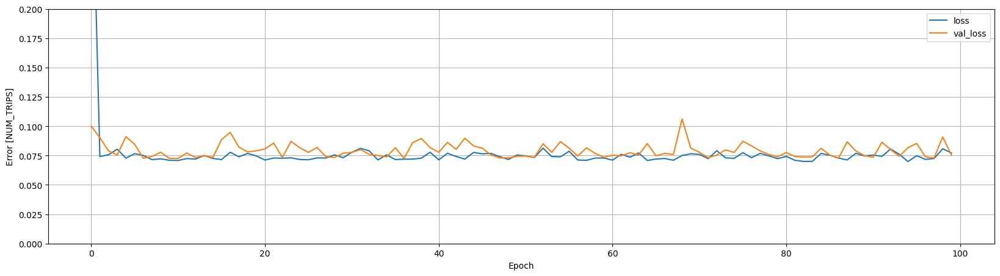

In [ ]:
plot_loss(history) # Plotting the loss value

Testing data and getting predictions

In [ ]:
test_results = {}

test_results['day_model'] = day_model.evaluate(
    test_features['day'],
    test_labels, verbose=0)

In [ ]:
x = tf.linspace(1, 7, 8)
y = day_model.predict(x)

1/1 [==============================] - 0s 40ms/step


In [ ]:
def plot_day(x, y):
  plt.scatter(train_features['day'], train_labels, label='Data', alpha=0.3)
  plt.plot(x, y, color='k', label='Predictions')
  plt.xlabel('day')
  plt.ylim([0.0, 1.0])
  plt.ylabel('NUM_COLLISIONS')
  plt.legend()

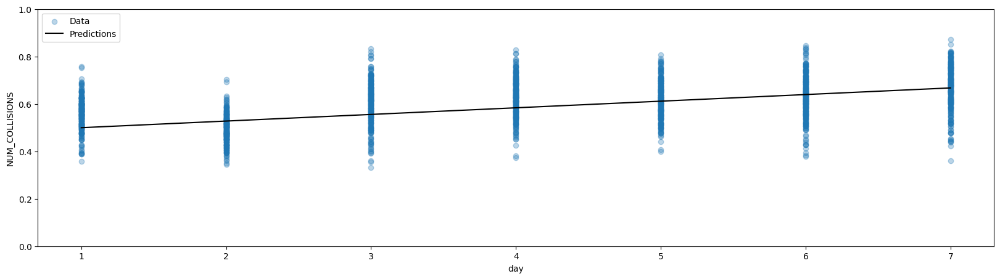

In [ ]:
plot_day(x, y)

In [ ]:
pd.DataFrame(test_results, index=['Mean absolute error [NUM_COLLISIONS]']).T # Getting the mean absolute error

,Mean absolute error [NUM_COLLISIONS]
day_model,0.067924


**Trying out for multiple inputs**

1. Day, temp, dewp, maxtemp, mintemp has relatively high correlation to NUM_COLLISIONS as seen below. (excluding mo and year)

Several multiple linear regression models were created, starting with these five as inputs.

<ipython-input-233-47b05f8ad933>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corrMatrix = df_final.corr() # Final correlation matrix


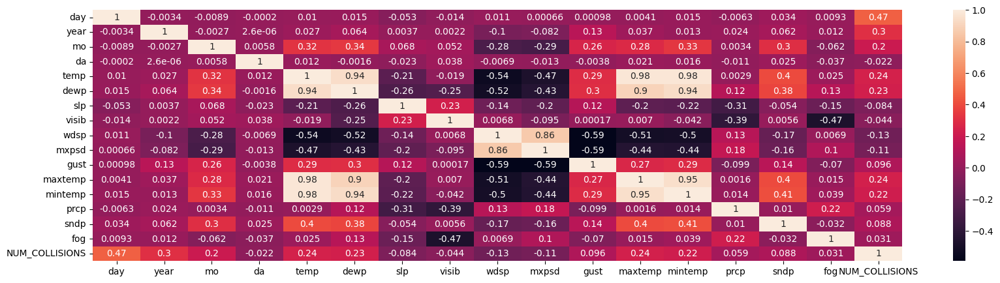

In [ ]:
corrMatrix = df_final.corr() # Final correlation matrix
sn.heatmap(corrMatrix, annot=True)
plt.show()

In [ ]:
many_input_data = [df_final["day"], df_final["temp"], df_final["dewp"], df_final["maxtemp"], df_final["mintemp"], df_final["NUM_COLLISIONS"]]
headers = ["day", "temp", "dewp", "maxtemp", "mintemp", "NUM_COLLISIONS"] # declare the titles of our input and output.
df_many_input = pd.concat(many_input_data, axis=1, keys=headers) # Bring these two arrays together to make a new dataframe
df_many_input.head()

,day,temp,dewp,maxtemp,mintemp,NUM_COLLISIONS
0,4,37.8,23.6,39.9,33.1,381
1,5,27.1,10.5,33.1,21.9,480
2,6,28.4,14.1,32.0,24.1,549
3,7,33.4,18.6,37.0,30.0,505
4,1,36.1,18.7,42.1,32.0,389


Split to training and test sets

In [ ]:
train_dataset = df_many_input.sample(frac=0.8, random_state=0)
test_dataset = df_many_input.drop(train_dataset.index)

In [ ]:
train_features = train_dataset.copy()
test_features = test_dataset.copy()

train_labels = train_features.pop('NUM_COLLISIONS')
test_labels = test_features.pop('NUM_COLLISIONS')

In [ ]:
train_features.head()

,day,temp,dewp,maxtemp,mintemp
194,2,80.3,71.5,88.0,73.4
389,1,21.8,6.6,28.0,15.8
450,6,30.5,6.5,44.1,21.9
1869,4,32.1,12.5,39.0,26.1
2186,6,40.3,26.6,44.1,32.0


In [ ]:
train_labels = train_labels/scale_factor # Scaling the output
test_labels = test_labels/scale_factor

Building the model

In [ ]:
normalizer = tf.keras.layers.Normalization(axis=-1) # Normalisation layer
normalizer.adapt(np.array(train_features))
first = np.array(train_features[:1])

with np.printoptions(precision=2, suppress=True):
  print('First example:', first)
  print()
  print('Normalized:', normalizer(first).numpy())

First example: [[ 2.  80.3 71.5 88.  73.4]]

Normalized: [[-1.    1.4   1.58  1.25  1.5 ]]


In [ ]:
linear_model = tf.keras.Sequential([
    normalizer,
    layers.Dense(units=1)
]) # Setting up model structure with one normalisation layer and one dense layer

In [ ]:
linear_model.predict(train_features[:10]) # Checking untrained predictions

1/1 [==============================] - 0s 42ms/step


array([[ 2.1030085],
       [-4.969055 ],
       [-2.2368097],
       [-2.9143124],
       [-1.1461762],
       [ 1.6472462],
       [ 1.3426346],
       [-1.313488 ],
       [-0.9720215],
       [ 2.3372457]], dtype=float32)

In [ ]:
linear_model.layers[1].kernel

<tf.Variable 'dense_1/kernel:0' shape=(5, 1) dtype=float32, numpy=
array([[ 0.745101  ],
       [ 0.2803557 ],
       [ 0.9097874 ],
       [ 0.8406005 ],
       [-0.02370119]], dtype=float32)>

In [ ]:
linear_model.compile(
    optimizer=tf.optimizers.Adam(learning_rate=0.1),
    loss='mean_absolute_error') # Optimising training procedure

In [ ]:
%%time
history = linear_model.fit(
    train_features,
    train_labels,
    epochs=100,
    # Suppress logging.
    verbose=0,
    # Calculate validation results on 20% of the training data.
    validation_split = 0.2) # Training over 100 epochs

CPU times: user 6.79 s, sys: 397 ms, total: 7.19 s
Wall time: 10.6 s


In [ ]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.tail()

,loss,val_loss,epoch
95,0.078669,0.077724,95
96,0.082496,0.076231,96
97,0.080381,0.111000,97
98,0.079507,0.082292,98
99,0.077542,0.073616,99


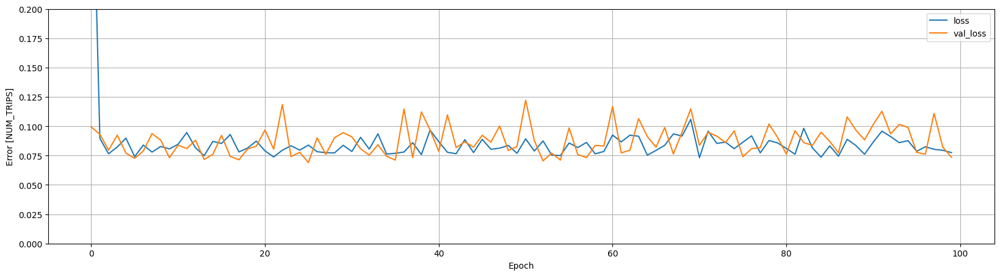

In [ ]:
plot_loss(history)

In [ ]:
test_results['linear_model'] = linear_model.evaluate(
    test_features, test_labels, verbose=0)

In [ ]:
pd.DataFrame(test_results, index=['Mean absolute error [NUM_COLLISIONS]']).T # Shows results

,Mean absolute error [NUM_COLLISIONS]
day_model,0.067924
linear_model,0.072876


In [ ]:
predictions = linear_model.predict(test_features)

14/14 [==============================] - 0s 862us/step


In [ ]:
# print(test_labels[0:10] * 1000, predictions[0:10] * 1000)

2. Linear regression model with Day, temp, dewp, slp, visib, maxtemp, mintemp, prcp, fog (wdsp, mxpsd has quite a lot of missing data; gust and sndp unusable)

In [ ]:
many_input_data = [df_final["day"], df_final["temp"], df_final["dewp"], df_final["slp"], df_final["visib"], df_final["maxtemp"], df_final["mintemp"], df_final["prcp"], df_final["fog"], df_final["NUM_COLLISIONS"]]
headers = ["day", "temp", "dewp", "slp", "visib", "maxtemp", "mintemp", "prcp", "fog", "NUM_COLLISIONS"] # declare the titles of our input and output.
df_many_input = pd.concat(many_input_data, axis=1, keys=headers) # Bring these two arrays together to make a new dataframe
df_many_input.head()

,day,temp,dewp,slp,visib,maxtemp,mintemp,prcp,fog,NUM_COLLISIONS
0,4,37.8,23.6,1011.9,10.0,39.9,33.1,0.0,0,381
1,5,27.1,10.5,1016.8,10.0,33.1,21.9,0.0,0,480
2,6,28.4,14.1,1020.6,10.0,32.0,24.1,0.0,0,549
3,7,33.4,18.6,1017.0,10.0,37.0,30.0,0.0,0,505
4,1,36.1,18.7,1020.6,10.0,42.1,32.0,0.0,0,389


Split into training and test sets

In [ ]:
train_dataset = df_many_input.sample(frac=0.8, random_state=0)
test_dataset = df_many_input.drop(train_dataset.index)

In [ ]:
train_features = train_dataset.copy()
test_features = test_dataset.copy()

train_labels = train_features.pop('NUM_COLLISIONS')
test_labels = test_features.pop('NUM_COLLISIONS')

In [ ]:
train_features.head()

,day,temp,dewp,slp,visib,maxtemp,mintemp,prcp,fog
194,2,80.3,71.5,1025.5,7.7,88.0,73.4,0.03,0
389,1,21.8,6.6,999.1,5.3,28.0,15.8,0.00,0
450,6,30.5,6.5,1026.3,10.0,44.1,21.9,0.00,0
1869,4,32.1,12.5,1040.6,10.0,39.0,26.1,0.00,0
2186,6,40.3,26.6,1034.2,10.0,44.1,32.0,0.00,0


In [ ]:
train_labels = train_labels/scale_factor # Scaling the output
test_labels = test_labels/scale_factor

Building the model

In [ ]:
normalizer = tf.keras.layers.Normalization(axis=-1) # Normalisation layer
normalizer.adapt(np.array(train_features))
first = np.array(train_features[:1])

with np.printoptions(precision=2, suppress=True):
  print('First example:', first)
  print()
  print('Normalized:', normalizer(first).numpy())

First example: [[   2.     80.3    71.5  1025.5     7.7    88.     73.4     0.03    0.  ]]

Normalized: [[-1.    1.4   1.58  1.16 -0.86  1.25  1.5  -0.3  -0.27]]


In [ ]:
linear_model_2 = tf.keras.Sequential([
    normalizer,
    layers.Dense(units=1)
]) # Setting up model structure

In [ ]:
linear_model_2.predict(train_features[:10]) # Checking untrained predictions

1/1 [==============================] - 0s 41ms/step


array([[ 0.06815019],
       [ 0.16657439],
       [-0.58534384],
       [-0.854887  ],
       [-1.1025097 ],
       [ 0.86564445],
       [ 0.83397365],
       [ 1.0186263 ],
       [ 0.86159885],
       [ 0.20805398]], dtype=float32)

In [ ]:
linear_model_2.layers[1].kernel # Nine independent variables check

<tf.Variable 'dense_2/kernel:0' shape=(9, 1) dtype=float32, numpy=
array([[-0.3851269 ],
       [-0.27401948],
       [-0.3123853 ],
       [-0.27724174],
       [ 0.31102216],
       [ 0.3096583 ],
       [ 0.45402145],
       [ 0.4188316 ],
       [-0.75506884]], dtype=float32)>

In [ ]:
linear_model_2.compile(
    optimizer=tf.optimizers.Adam(learning_rate=0.1),
    loss='mean_absolute_error') # Optimising training procedure

In [ ]:
%%time
history = linear_model_2.fit(
    train_features,
    train_labels,
    epochs=100,
    # Suppress logging.
    verbose=0,
    # Calculate validation results on 20% of the training data.
    validation_split = 0.2) # Training over 100 epochs

CPU times: user 7.06 s, sys: 365 ms, total: 7.43 s
Wall time: 10.7 s


In [ ]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.tail()

,loss,val_loss,epoch
95,0.105502,0.182407,95
96,0.108415,0.116108,96
97,0.099905,0.091721,97
98,0.086414,0.088714,98
99,0.102046,0.129894,99


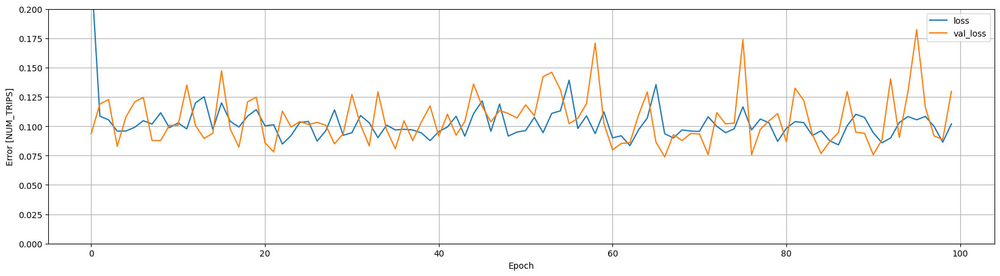

In [ ]:
plot_loss(history)

In [ ]:
test_results['linear_model_2'] = linear_model_2.evaluate(
    test_features, test_labels, verbose=0)

In [ ]:
pd.DataFrame(test_results, index=['Mean absolute error [NUM_COLLISIONS]']).T # Shows results

,Mean absolute error [NUM_COLLISIONS]
day_model,0.067924
linear_model,0.072876
linear_model_2,0.126304


In [ ]:
predictions = linear_model_2.predict(test_features)

14/14 [==============================] - 0s 944us/step


In [ ]:
# print(test_labels[0:10] * 1000, predictions[0:10] * 1000)

3. Linear regression model with Day, temp, dewp, slp, visib, maxtemp, mintemp, prcp, fog, wdsp, mxpsd (gust and sndp unusable). Wdsp and Mxpsd were included to see if it decreases or increases the quality of the model.

In [ ]:
many_input_data = [df_final["day"], df_final["temp"], df_final["dewp"], df_final["slp"], df_final["visib"], df_final["wdsp"], df_final["mxpsd"], df_final["maxtemp"], df_final["mintemp"], df_final["prcp"], df_final["fog"], df_final["NUM_COLLISIONS"]]
headers = ["day", "temp", "dewp", "slp", "visib", "wdsp", "mxpsd", "maxtemp", "mintemp", "prcp", "fog", "NUM_COLLISIONS"] # declare the titles of our input and output.
df_many_input = pd.concat(many_input_data, axis=1, keys=headers) # Bring these two arrays together to make a new dataframe
df_many_input.head()

,day,temp,dewp,slp,visib,wdsp,mxpsd,maxtemp,mintemp,prcp,fog,NUM_COLLISIONS
0,4,37.8,23.6,1011.9,10.0,6.1,8.9,39.9,33.1,0.0,0,381
1,5,27.1,10.5,1016.8,10.0,5.3,9.9,33.1,21.9,0.0,0,480
2,6,28.4,14.1,1020.6,10.0,3.7,8.0,32.0,24.1,0.0,0,549
3,7,33.4,18.6,1017.0,10.0,6.5,13.0,37.0,30.0,0.0,0,505
4,1,36.1,18.7,1020.6,10.0,6.6,12.0,42.1,32.0,0.0,0,389


Splitting into training and test sets

In [ ]:
train_dataset = df_many_input.sample(frac=0.8, random_state=0)
test_dataset = df_many_input.drop(train_dataset.index)

In [ ]:
train_features = train_dataset.copy()
test_features = test_dataset.copy()

train_labels = train_features.pop('NUM_COLLISIONS')
test_labels = test_features.pop('NUM_COLLISIONS')

In [ ]:
train_features.head()

,day,temp,dewp,slp,visib,wdsp,mxpsd,maxtemp,mintemp,prcp,fog
194,2,80.3,71.5,1025.5,7.7,2.900000,7.000000,88.0,73.4,0.03,0
389,1,21.8,6.6,999.1,5.3,6.200000,8.000000,28.0,15.8,0.00,0
450,6,30.5,6.5,1026.3,10.0,6.700000,15.900000,44.1,21.9,0.00,0
1869,4,32.1,12.5,1040.6,10.0,5.000000,8.900000,39.0,26.1,0.00,0
2186,6,40.3,26.6,1034.2,10.0,3.915357,8.562143,44.1,32.0,0.00,0


In [ ]:
train_labels = train_labels/scale_factor # Scaling the output
test_labels = test_labels/scale_factor

Building the model

In [ ]:
normalizer = tf.keras.layers.Normalization(axis=-1) # Normalisation layer
normalizer.adapt(np.array(train_features))
first = np.array(train_features[:1])

with np.printoptions(precision=2, suppress=True):
  print('First example:', first)
  print()
  print('Normalized:', normalizer(first).numpy())

First example: [[   2.     80.3    71.5  1025.5     7.7     2.9     7.     88.     73.4
     0.03    0.  ]]

Normalized: [[-1.    1.4   1.58  1.16 -0.86 -0.81 -0.76  1.25  1.5  -0.3  -0.27]]


In [ ]:
linear_model_3 = tf.keras.Sequential([
    normalizer,
    layers.Dense(units=1)
]) # Setting up model structure

In [ ]:
linear_model_3.predict(train_features[:10]) # Checking untrained predictions

1/1 [==============================] - 0s 43ms/step


array([[-1.063394  ],
       [-1.7580172 ],
       [ 1.6613666 ],
       [ 1.9361837 ],
       [ 2.2879827 ],
       [-0.9522997 ],
       [-0.38406652],
       [-1.7470126 ],
       [-0.56411684],
       [ 0.50663275]], dtype=float32)

In [ ]:
linear_model_3.layers[1].kernel # Nine independent variables check

<tf.Variable 'dense_3/kernel:0' shape=(11, 1) dtype=float32, numpy=
array([[ 0.5542063 ],
       [-0.62595826],
       [ 0.28865314],
       [ 0.2888927 ],
       [ 0.43489307],
       [-0.45892894],
       [-0.00092638],
       [ 0.20600653],
       [-0.47181594],
       [-0.57917595],
       [ 0.5389983 ]], dtype=float32)>

In [ ]:
linear_model_3.compile(
    optimizer=tf.optimizers.Adam(learning_rate=0.1),
    loss='mean_absolute_error') # Optimising training procedure

In [ ]:
%%time
history = linear_model_3.fit(
    train_features,
    train_labels,
    epochs=100,
    # Suppress logging.
    verbose=0,
    # Calculate validation results on 20% of the training data.
    validation_split = 0.2) # Training over 100 epochs

CPU times: user 6.89 s, sys: 389 ms, total: 7.28 s
Wall time: 10.7 s


In [ ]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.tail()

,loss,val_loss,epoch
95,0.101952,0.105070,95
96,0.091248,0.142380,96
97,0.118270,0.084574,97
98,0.095723,0.129335,98
99,0.111185,0.133191,99


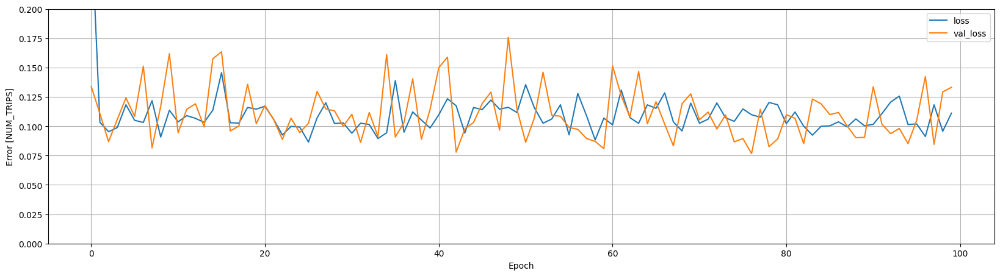

In [ ]:
plot_loss(history)

In [ ]:
test_results['linear_model_3'] = linear_model_3.evaluate(
    test_features, test_labels, verbose=0)

In [ ]:
pd.DataFrame(test_results, index=['Mean absolute error [NUM_COLLISIONS]']).T # Shows results

,Mean absolute error [NUM_COLLISIONS]
day_model,0.067924
linear_model,0.072876
linear_model_2,0.126304
linear_model_3,0.127404


In [ ]:
predictions = linear_model_3.predict(test_features)

14/14 [==============================] - 0s 962us/step


Trend seems to be that the less variables used, the more accurate the model. Numbers may change depending on the run but usually the day_model proved to be more accurate compared to the multi_linear models. However, a smaller MAE does not mean more profits generated.

**Trying out a Random Forest Regression model using SciKitLearn**

Due to the apparent non-linear correlations between the variables and NUM_COLLISIONS, I decided to try creating Random Forest Regression models (an ensemble learning model) using SciKitlearn to see if there are any improved results.

1. Below is a trial using a random forest regression model using day, temp, dewp, maxtemp and mintemp.

In [ ]:
many_input_data = [df_final["day"], df_final["temp"], df_final["dewp"], df_final["maxtemp"], df_final["mintemp"], df_final["NUM_COLLISIONS"]]
headers = ["day", "temp", "dewp", "maxtemp", "mintemp", "NUM_COLLISIONS"] # declare the titles of our input and output.
df_many_input = pd.concat(many_input_data, axis=1, keys=headers) # Bring these two arrays together to make a new dataframe
df_many_input.head()

,day,temp,dewp,maxtemp,mintemp,NUM_COLLISIONS
0,4,37.8,23.6,39.9,33.1,381
1,5,27.1,10.5,33.1,21.9,480
2,6,28.4,14.1,32.0,24.1,549
3,7,33.4,18.6,37.0,30.0,505
4,1,36.1,18.7,42.1,32.0,389


In [ ]:
# Splitting to training and test sets
train_dataset = df_many_input.sample(frac=0.8, random_state=0)
test_dataset = df_many_input.drop(train_dataset.index)

train_features = train_dataset.copy()
test_features = test_dataset.copy()

train_labels = train_features.pop('NUM_COLLISIONS')
test_labels = test_features.pop('NUM_COLLISIONS')

train_labels = np.array([train_labels]).reshape(-1, 1)
test_labels = np.array([test_labels]).reshape(-1, 1)

In [ ]:
# Feature scaling
from sklearn.preprocessing import StandardScaler
sc_x = StandardScaler()
sc_y = StandardScaler()

train_features = sc_x.fit_transform(train_features)
test_features = sc_x.transform(test_features)

train_labels = train_labels/scale_factor
test_labels = test_labels/scale_factor

In [ ]:
from sklearn.ensemble import RandomForestRegressor
rfr_regressor = RandomForestRegressor(n_estimators = 100, random_state = 0)
rfr_regressor.fit(train_features, train_labels)

<ipython-input-287-1d19541782b8>:3: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfr_regressor.fit(train_features, train_labels)


RandomForestRegressor(random_state=0)

In [ ]:
# Predicting test set results
y_pred_rfr = np.array([rfr_regressor.predict(test_features)]).reshape(-1, 1)

In [ ]:
from sklearn.metrics import mean_absolute_error
result = mean_absolute_error(test_labels, y_pred_rfr) # Evaluating performance
print(result)

0.06071850230414743


In [ ]:
test_results['sklearn_Random_Forest_model'] = result
pd.DataFrame(test_results, index=['Mean absolute error [NUM_COLLISIONS]']).T # Shows results

,Mean absolute error [NUM_COLLISIONS]
day_model,0.067924
linear_model,0.072876
linear_model_2,0.126304
linear_model_3,0.127404
sklearn_Random_Forest_model,0.060719


Generating predictions for the 2019 dataset using the first random forest model

In [ ]:
dataset_2019 = [df_2019_test_data["day"], df_2019_test_data["temp"], df_2019_test_data["dewp"], df_2019_test_data["max"], df_2019_test_data["min"]]
headers = ["day", "temp", "dewp", "maxtemp", "mintemp"] # declare the titles of our input and output.
df_many_input = pd.concat(dataset_2019, axis=1, keys=headers) # Bring these two arrays together to make a new dataframe
df_many_input.head()

,day,temp,dewp,maxtemp,mintemp
0,4,50.5,43.2,57.9,36.0
1,5,38.0,23.2,57.9,35.1
2,6,41.1,29.4,44.1,35.1
3,7,39.7,26.4,46.0,35.1
4,1,44.2,41.0,46.9,35.1


In [ ]:
# Feature scaling
df_many_input = sc_x.transform(df_many_input)

In [ ]:
# Predicting 2019 set results - for use in section 5
y_pred_rfr_2019 = np.array([rfr_regressor.predict(df_many_input)]).reshape(-1, 1) * scale_factor

2. Trying out Random Forest Regression with the other variables except for wdsp, mxpsd, gust and wind

In [ ]:
many_input_data = [df_final["day"], df_final["temp"], df_final["dewp"], df_final["slp"], df_final["visib"], df_final["maxtemp"], df_final["mintemp"], df_final["prcp"], df_final["fog"],  df_final["NUM_COLLISIONS"]]
headers = ["day", "temp", "dewp", "slp", "visib", "maxtemp", "mintemp", "prcp", "fog", "NUM_COLLISIONS"] # declare the titles of our input and output.
df_many_input = pd.concat(many_input_data, axis=1, keys=headers) # Bring these two arrays together to make a new dataframe
df_many_input.head()

,day,temp,dewp,slp,visib,maxtemp,mintemp,prcp,fog,NUM_COLLISIONS
0,4,37.8,23.6,1011.9,10.0,39.9,33.1,0.0,0,381
1,5,27.1,10.5,1016.8,10.0,33.1,21.9,0.0,0,480
2,6,28.4,14.1,1020.6,10.0,32.0,24.1,0.0,0,549
3,7,33.4,18.6,1017.0,10.0,37.0,30.0,0.0,0,505
4,1,36.1,18.7,1020.6,10.0,42.1,32.0,0.0,0,389


In [ ]:
# Splitting to training and test sets
train_dataset = df_many_input.sample(frac=0.8, random_state=0)
test_dataset = df_many_input.drop(train_dataset.index)

train_features = train_dataset.copy()
test_features = test_dataset.copy()

train_labels = train_features.pop('NUM_COLLISIONS')
test_labels = test_features.pop('NUM_COLLISIONS')

train_labels = np.array([train_labels]).reshape(-1, 1)
test_labels = np.array([test_labels]).reshape(-1, 1)

In [ ]:
# Feature scaling
from sklearn.preprocessing import StandardScaler
sc_x = StandardScaler()
sc_y = StandardScaler()

train_features = sc_x.fit_transform(train_features)
test_features = sc_x.transform(test_features)

train_labels = train_labels/scale_factor
test_labels = test_labels/scale_factor

In [ ]:
from sklearn.ensemble import RandomForestRegressor
rfr_regressor = RandomForestRegressor(n_estimators = 100, random_state = 0)
rfr_regressor.fit(train_features, train_labels)

<ipython-input-297-1d19541782b8>:3: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfr_regressor.fit(train_features, train_labels)


RandomForestRegressor(random_state=0)

In [ ]:
# Predicting test set results
y_pred_rfr = np.array([rfr_regressor.predict(test_features)]).reshape(-1, 1)

In [ ]:
from sklearn.metrics import mean_absolute_error
result = mean_absolute_error(test_labels, y_pred_rfr) # Evaluating performance
print(result)

0.05959387096774193


In [ ]:
test_results['sklearn_Random_Forest_model_2'] = result
pd.DataFrame(test_results, index=['Mean absolute error [NUM_COLLISIONS]']).T # Shows results

,Mean absolute error [NUM_COLLISIONS]
day_model,0.067924
linear_model,0.072876
linear_model_2,0.126304
linear_model_3,0.127404
sklearn_Random_Forest_model,0.060719
sklearn_Random_Forest_model_2,0.059594


The second random forest model has slightly lower MAE value.

Generating predictions for the 2019 dataset using the second random forest model

In [ ]:
dataset_2019 = [df_2019_test_data["day"], df_2019_test_data["temp"], df_2019_test_data["dewp"], df_2019_test_data["slp"], df_2019_test_data["visib"], df_2019_test_data["max"], df_2019_test_data["min"], df_2019_test_data["prcp"], df_2019_test_data["fog"]]
headers = ["day", "temp", "dewp", "slp", "visib", "maxtemp", "mintemp", "prcp", "fog"] # declare the titles of our input and output.
df_many_input = pd.concat(dataset_2019, axis=1, keys=headers) # Bring these two arrays together to make a new dataframe
df_many_input.head()

,day,temp,dewp,slp,visib,maxtemp,mintemp,prcp,fog
0,4,50.5,43.2,1009.8,7.0,57.9,36.0,1.08,0
1,5,38.0,23.2,1024.2,10.0,57.9,35.1,0.06,0
2,6,41.1,29.4,1015.8,9.9,44.1,35.1,0.00,0
3,7,39.7,26.4,1014.8,9.9,46.0,35.1,0.00,0
4,1,44.2,41.0,1003.3,5.3,46.9,35.1,0.22,0


In [ ]:
# Feature scaling
df_many_input = sc_x.transform(df_many_input)

In [ ]:
# Predicting 2019 set results - for use in section 5
y_pred_rfr_2_2019 = np.array([rfr_regressor.predict(df_many_input)]).reshape(-1, 1) * scale_factor

**DNN model**

The DNN model was made to determine any non-linear relationships between variables and any variables not apparent to humans directly.

Since we are including da, mo and year, we need to one-hot-encode da and mo so that the values will be usable in training our model.

In [ ]:
df_final.head()

,day,year,mo,da,collision_date,temp,dewp,slp,visib,wdsp,mxpsd,gust,maxtemp,mintemp,prcp,sndp,fog,NUM_COLLISIONS,collision_date_no_year
0,4,2013,1,1,01/01/2013,37.8,23.6,1011.9,10.0,6.1,8.9,19.0,39.9,33.1,0.0,999.9,0,381,01/01/
1,5,2013,1,2,02/01/2013,27.1,10.5,1016.8,10.0,5.3,9.9,19.0,33.1,21.9,0.0,999.9,0,480,02/01/
2,6,2013,1,3,03/01/2013,28.4,14.1,1020.6,10.0,3.7,8.0,15.0,32.0,24.1,0.0,999.9,0,549,03/01/
3,7,2013,1,4,04/01/2013,33.4,18.6,1017.0,10.0,6.5,13.0,24.1,37.0,30.0,0.0,999.9,0,505,04/01/
4,1,2013,1,5,05/01/2013,36.1,18.7,1020.6,10.0,6.6,12.0,21.0,42.1,32.0,0.0,999.9,0,389,05/01/


In [ ]:
# One-Hot Encoding for day
df_final['day'] = df_final['day'].map({ 1: 'Saturday', 2: 'Sunday', 3: 'Monday', 4: 'Tuesday', 5: 'Wednesday', 6: 'Thursday', 7: 'Friday'})
df_final = pd.get_dummies(df_final, columns=['day'], prefix='', prefix_sep='')

In [ ]:
# One-Hot Encoding for month
df_final['mo'] = df_final['mo'].map({ 1: 'January', 2: 'February', 3: 'March', 4: 'April', 5: 'May', 6: 'June', 7: 'July', 8: 'August', 9: 'September', 10: 'October', 11: 'November', 12: 'December'})
df_final = pd.get_dummies(df_final, columns=['mo'], prefix='', prefix_sep='')

In [ ]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)

df_final.head()

<ipython-input-307-5481fc3e7a55>:4: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


,year,da,collision_date,temp,dewp,slp,visib,wdsp,mxpsd,gust,maxtemp,mintemp,prcp,sndp,fog,NUM_COLLISIONS,collision_date_no_year,Friday,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday,April,August,December,February,January,July,June,March,May,November,October,September
0,2013,1,01/01/2013,37.8,23.6,1011.9,10.0,6.1,8.9,19.0,39.9,33.1,0.0,999.9,0,381,01/01/,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0
1,2013,2,02/01/2013,27.1,10.5,1016.8,10.0,5.3,9.9,19.0,33.1,21.9,0.0,999.9,0,480,02/01/,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0
2,2013,3,03/01/2013,28.4,14.1,1020.6,10.0,3.7,8.0,15.0,32.0,24.1,0.0,999.9,0,549,03/01/,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0
3,2013,4,04/01/2013,33.4,18.6,1017.0,10.0,6.5,13.0,24.1,37.0,30.0,0.0,999.9,0,505,04/01/,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4,2013,5,05/01/2013,36.1,18.7,1020.6,10.0,6.6,12.0,21.0,42.1,32.0,0.0,999.9,0,389,05/01/,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0


In [ ]:
dnn_many_input_data = [df_final["year"], df_final["temp"], df_final["dewp"], df_final["slp"], df_final["visib"], df_final["maxtemp"], df_final["mintemp"],df_final["prcp"], df_final["fog"], df_final["Sunday"], df_final["Monday"], df_final["Tuesday"], df_final["Wednesday"], df_final["Thursday"], df_final["Friday"], df_final["Saturday"], df_final["January"], df_final["February"], df_final["March"], df_final["April"], df_final["May"], df_final["June"], df_final["July"], df_final["August"], df_final["September"], df_final["October"], df_final["November"], df_final["December"], df_final["NUM_COLLISIONS"]]
headers = ["year","temp","dewp","slp","visib", "maxtemp", "mintemp", "prcp", "fog","Sunday","Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","January","February","March","April","May","June","July","August","September","October","November","December","NUM_COLLISIONS"]
df_dnn_many_input = pd.concat(dnn_many_input_data, axis=1, keys=headers)
df_dnn_many_input.head()

,year,temp,dewp,slp,visib,maxtemp,mintemp,prcp,fog,Sunday,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,January,February,March,April,May,June,July,August,September,October,November,December,NUM_COLLISIONS
0,2013,37.8,23.6,1011.9,10.0,39.9,33.1,0.0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,381
1,2013,27.1,10.5,1016.8,10.0,33.1,21.9,0.0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,480
2,2013,28.4,14.1,1020.6,10.0,32.0,24.1,0.0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,549
3,2013,33.4,18.6,1017.0,10.0,37.0,30.0,0.0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,505
4,2013,36.1,18.7,1020.6,10.0,42.1,32.0,0.0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,389


Splitting to training and test sets

In [ ]:
train_dataset = df_dnn_many_input.sample(frac=0.8, random_state=0)
test_dataset = df_dnn_many_input.drop(train_dataset.index)

In [ ]:
train_features = train_dataset.copy()
test_features = test_dataset.copy()

train_labels = train_features.pop('NUM_COLLISIONS')
test_labels = test_features.pop('NUM_COLLISIONS')

In [ ]:
train_labels = train_labels/scale_factor
test_labels = test_labels/scale_factor

Building DNN model in a function to use later

In [ ]:
def build_and_compile_model(norm):
  model = keras.Sequential([
      norm,
      layers.Dense(64, activation='relu'),
      layers.Dense(64, activation='relu'),
      layers.Dense(1)
  ])

  model.compile(loss='mean_absolute_error',
                optimizer=tf.keras.optimizers.Adam(0.001))
  return model

Creating normalisation layer

In [ ]:
normalizer = tf.keras.layers.Normalization(axis=-1) # Creating normalisation layer
normalizer.adapt(np.array(train_features))
first = np.array(train_features[:1])

with np.printoptions(precision=2, suppress=True):
  print('First example:', first)
  print()
  print('Normalized:', normalizer(first).numpy())

First example: [[2013.     80.3    71.5  1025.5     7.7    88.     73.4     0.03    0.
     1.      0.      0.      0.      0.      0.      0.      0.      0.
     0.      0.      0.      0.      1.      0.      0.      0.      0.
     0.  ]]

Normalized: [[-1.45  1.4   1.58  1.16 -0.86  1.25  1.5  -0.3  -0.27  2.48 -0.41 -0.41
  -0.41 -0.41 -0.41 -0.41 -0.31 -0.29 -0.3  -0.3  -0.3  -0.3   3.21 -0.3
  -0.3  -0.3  -0.31 -0.3 ]]


Building the DNN model

In [ ]:
dnn_model = build_and_compile_model(normalizer)
dnn_model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization_5 (Normalizat  (None, 28)               57        
 ion)                                                            
                                                                 
 dense_4 (Dense)             (None, 64)                1856      
                                                                 
 dense_5 (Dense)             (None, 64)                4160      
                                                                 
 dense_6 (Dense)             (None, 1)                 65        
                                                                 
Total params: 6,138
Trainable params: 6,081
Non-trainable params: 57
_________________________________________________________________


Training the model

In [ ]:
%%time
# Training the model
history = dnn_model.fit(
    train_features,
    train_labels,
    validation_split=0.2,
    verbose=0, epochs=100)

CPU times: user 7.99 s, sys: 363 ms, total: 8.36 s
Wall time: 10.9 s


Plotting the loss

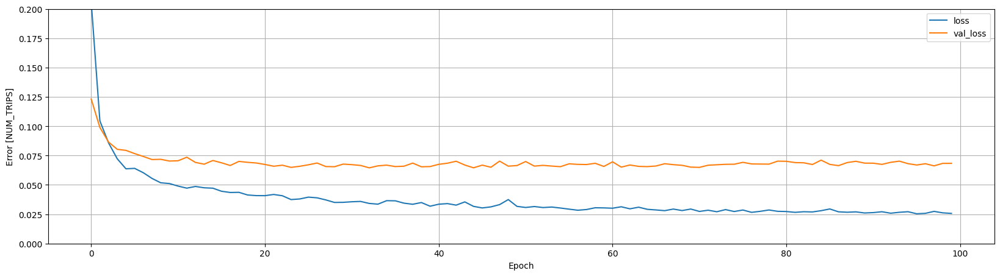

In [ ]:
plot_loss(history) # Plotting the loss

In [ ]:
test_results['dnn_model'] = dnn_model.evaluate(test_features, test_labels, verbose=0) # Storing test results

In [ ]:
pd.DataFrame(test_results, index=['Mean absolute error [NUM_COLLISIONS]']).T

,Mean absolute error [NUM_COLLISIONS]
day_model,0.067924
linear_model,0.072876
linear_model_2,0.126304
linear_model_3,0.127404
sklearn_Random_Forest_model,0.060719
sklearn_Random_Forest_model_2,0.059594
dnn_model,0.065136


DNN Model outperforms the other models aside from the scikitlearn models

**DNN Model 2** - includes wdsp and mxpsd

In [ ]:
df_final.head()

,year,da,collision_date,temp,dewp,slp,visib,wdsp,mxpsd,gust,maxtemp,mintemp,prcp,sndp,fog,NUM_COLLISIONS,collision_date_no_year,Friday,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday,April,August,December,February,January,July,June,March,May,November,October,September
0,2013,1,01/01/2013,37.8,23.6,1011.9,10.0,6.1,8.9,19.0,39.9,33.1,0.0,999.9,0,381,01/01/,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0
1,2013,2,02/01/2013,27.1,10.5,1016.8,10.0,5.3,9.9,19.0,33.1,21.9,0.0,999.9,0,480,02/01/,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0
2,2013,3,03/01/2013,28.4,14.1,1020.6,10.0,3.7,8.0,15.0,32.0,24.1,0.0,999.9,0,549,03/01/,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0
3,2013,4,04/01/2013,33.4,18.6,1017.0,10.0,6.5,13.0,24.1,37.0,30.0,0.0,999.9,0,505,04/01/,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4,2013,5,05/01/2013,36.1,18.7,1020.6,10.0,6.6,12.0,21.0,42.1,32.0,0.0,999.9,0,389,05/01/,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0


In [ ]:
dnn2_many_input_data = [df_final["year"], df_final["temp"], df_final["dewp"], df_final["slp"], df_final["visib"], df_final["wdsp"], df_final["mxpsd"], df_final["maxtemp"], df_final["mintemp"], df_final["prcp"], df_final["fog"], df_final["Sunday"], df_final["Monday"], df_final["Tuesday"], df_final["Wednesday"], df_final["Thursday"], df_final["Friday"], df_final["Saturday"], df_final["January"], df_final["February"], df_final["March"], df_final["April"], df_final["May"], df_final["June"], df_final["July"], df_final["August"], df_final["September"], df_final["October"], df_final["November"], df_final["December"], df_final["NUM_COLLISIONS"]]
headers = ["year","temp","dewp","slp","visib", "wdsp", "mxpsd", "maxtemp", "mintemp", "prcp", "fog","Sunday","Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","January","February","March","April","May","June","July","August","September","October","November","December","NUM_COLLISIONS"]
df_dnn_many_input = pd.concat(dnn2_many_input_data, axis=1, keys=headers)
df_dnn_many_input.head()

,year,temp,dewp,slp,visib,wdsp,mxpsd,maxtemp,mintemp,prcp,fog,Sunday,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,January,February,March,April,May,June,July,August,September,October,November,December,NUM_COLLISIONS
0,2013,37.8,23.6,1011.9,10.0,6.1,8.9,39.9,33.1,0.0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,381
1,2013,27.1,10.5,1016.8,10.0,5.3,9.9,33.1,21.9,0.0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,480
2,2013,28.4,14.1,1020.6,10.0,3.7,8.0,32.0,24.1,0.0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,549
3,2013,33.4,18.6,1017.0,10.0,6.5,13.0,37.0,30.0,0.0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,505
4,2013,36.1,18.7,1020.6,10.0,6.6,12.0,42.1,32.0,0.0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,389


Splitting to training and test sets

In [ ]:
train_dataset = df_dnn_many_input.sample(frac=0.8, random_state=0)
test_dataset = df_dnn_many_input.drop(train_dataset.index)

In [ ]:
train_features = train_dataset.copy()
test_features = test_dataset.copy()

train_labels = train_features.pop('NUM_COLLISIONS')
test_labels = test_features.pop('NUM_COLLISIONS')

In [ ]:
train_labels = train_labels/scale_factor
test_labels = test_labels/scale_factor

Building the second DNN model

In [ ]:
def build_and_compile_model(norm):
  model = keras.Sequential([
      norm,
      layers.Dense(64, activation='relu'),
      layers.Dense(64, activation='relu'),
      layers.Dense(1)
  ])

  model.compile(loss='mean_absolute_error',
                optimizer=tf.keras.optimizers.Adam(0.001))
  return model

In [ ]:
normalizer = tf.keras.layers.Normalization(axis=-1) # Creating normalisation layer
normalizer.adapt(np.array(train_features))
first = np.array(train_features[:1])

with np.printoptions(precision=2, suppress=True):
  print('First example:', first)
  print()
  print('Normalized:', normalizer(first).numpy())

First example: [[2013.     80.3    71.5  1025.5     7.7     2.9     7.     88.     73.4
     0.03    0.      1.      0.      0.      0.      0.      0.      0.
     0.      0.      0.      0.      0.      0.      1.      0.      0.
     0.      0.      0.  ]]

Normalized: [[-1.45  1.4   1.58  1.16 -0.86 -0.81 -0.76  1.25  1.5  -0.3  -0.27  2.48
  -0.41 -0.41 -0.41 -0.41 -0.41 -0.41 -0.31 -0.29 -0.3  -0.3  -0.3  -0.3
   3.21 -0.3  -0.3  -0.3  -0.31 -0.3 ]]


In [ ]:
dnn_model_2 = build_and_compile_model(normalizer)
dnn_model_2.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization_6 (Normalizat  (None, 30)               61        
 ion)                                                            
                                                                 
 dense_7 (Dense)             (None, 64)                1984      
                                                                 
 dense_8 (Dense)             (None, 64)                4160      
                                                                 
 dense_9 (Dense)             (None, 1)                 65        
                                                                 
Total params: 6,270
Trainable params: 6,209
Non-trainable params: 61
_________________________________________________________________


In [ ]:
%%time
# Training the model
history = dnn_model_2.fit(
    train_features,
    train_labels,
    validation_split=0.2,
    verbose=0, epochs=100)

CPU times: user 7.86 s, sys: 382 ms, total: 8.24 s
Wall time: 10.9 s


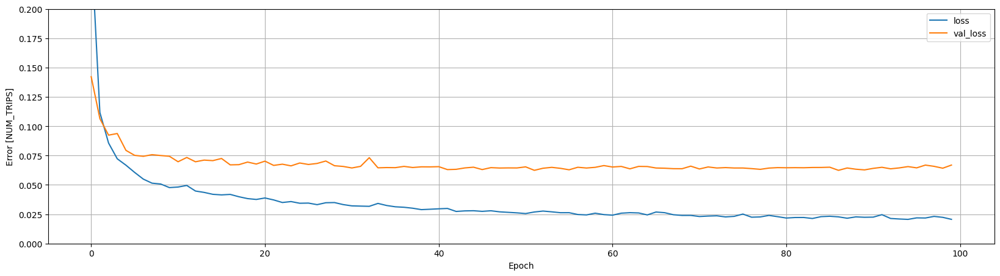

In [ ]:
plot_loss(history) # Plotting the loss

In [ ]:
test_results['dnn_model_2'] = dnn_model_2.evaluate(test_features, test_labels, verbose=0) # Storing test results

In [ ]:
pd.DataFrame(test_results, index=['Mean absolute error [NUM_COLLISIONS]']).T

,Mean absolute error [NUM_COLLISIONS]
day_model,0.067924
linear_model,0.072876
linear_model_2,0.126304
linear_model_3,0.127404
sklearn_Random_Forest_model,0.060719
sklearn_Random_Forest_model_2,0.059594
dnn_model,0.065136
dnn_model_2,0.068478


From multiple runs, the second random forest model tends to have the lowest MAE, followed by the first random forest model. If we were not accounting for the random forest models (due to it being out of the scope of this course), the DNN models tend to have the lowest MAE, followed by the single input day model. However, from these values alone, it is impossible to tell which model can bring in the most profit. That will be analysed further in Section 5.

# Module 5: Using the outcomes

In this section you want to use the test data to test what kind of money you will potentially make.

Your company rents cars daily to people in New York City and is struggling in a saturated market. You have noted that you offer a flat rate damage waiver insurance package to all customers and that most customers chose not to take it. This package is something that has the potential to make the company lots of money if marketed properly.

At the moment you offer the package for a fee of 30 dollars per day, with only around 30% of all customers taking it. You rent on average 20,000 vehicles per day and therefore this package makes the company 180,000 dollars. The damage caused by collisions costs on average 500 dollars per collision with 8% of customers encountering a collision of some kind resulting in damage. The total costs from damage come to 800,000 dollars, which is covered by the customers' insurance, but around 10% of this is covered by the company due to fradulent behaviour or customers taking the waiver. This results in a profit of around 100,000 dollars per day for the sale of this package alone.

This 30 dollars is based on an expected 1,200 collisions per day (based on the maximum).

The goal of this investigation is to accurately predict the number of expected collisions on a given day in order to reduce the price of the on-demand package and therefore give value to the customer. Surveys have shown that a competitive price would result in 80% of respondents taking the damage waiver insurance option – but the price must reflect the associated costs.

Plotting the actual collisions in 2019 and the expected collisions (1200) for the first 10 days of 2019

<Figure size 1000x500 with 0 Axes>

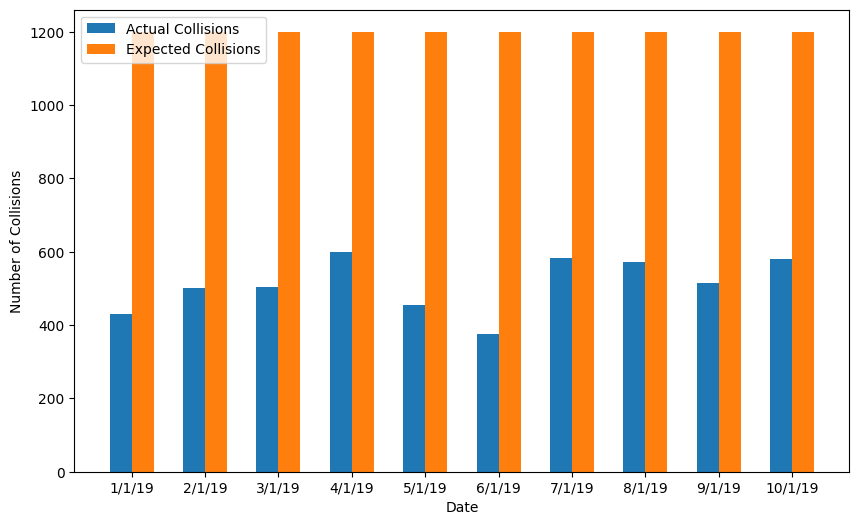

In [ ]:
plt.rcParams["figure.figsize"] = (10,6)
# Creating bar graph for comparing expected collisions and actual collisions for the first 10 days of 2019
expected_collision = np.ones(10) * 1200

# Numbers of pairs of bars
N = 10 # 10 days of predictions

# Actual Number of Collisions (2019)
actual_bar = df_2019_test_data["NUM_COLLISIONS"][:10]
# Expected Number of Collisions (1200 per day)
expected_bar = expected_collision

# Position of bars on x-axis
ind = np.arange(N)

# Figure size
plt.figure(figsize=(10,5))

# Width of a bar
width = 0.3

# Plotting

# Creating plot with dataset_1
fig, ax1 = plt.subplots()

color = 'tab:red'
ax1.set_xlabel('Date')
ax1.set_ylabel('Number of Collisions')
ax1.bar(ind, actual_bar, width, label='Actual Collisions')
ax1.bar(ind + width, expected_bar, width, label='Expected Collisions')

# xticks()
# First argument - A list of positions at which ticks should be placed
# Second argument -  A list of labels to place at the given locations
plt.xticks(ind + width / 2, ('1/1/19', '2/1/19', '3/1/19', '4/1/19',
                             '5/1/19', '6/1/19', '7/1/19', '8/1/19',
                             '9/1/19', '10/1/19'))

# Finding the best position for legends and putting it
plt.legend(loc='best')
plt.show()

**Linear Day Model Predictions**

In [ ]:
day_model_predictions = day_model.predict(df_2019_test_data["day"][:90]) * scale_factor # Day model predictions for test data

3/3 [==============================] - 0s 3ms/step


In [ ]:
# print(day_model_predictions)

In [ ]:
# Getting average daily policy prices
day_model_all = day_model.predict(df_2019_test_data["day"]) * scale_factor
day_model_all = day_model_all.squeeze() / 1200 * 30 # Generating new rates per day

12/12 [==============================] - 0s 957us/step


Plotting against actual results

12/12 [==============================] - 0s 1ms/step


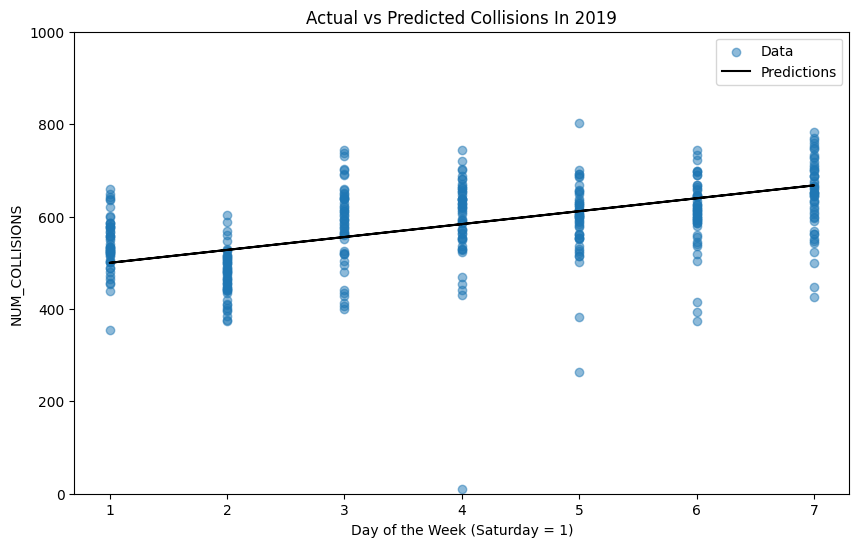

In [ ]:
plt.scatter(df_2019_test_data["day"], df_2019_test_data["NUM_COLLISIONS"], label='Data', alpha=0.5)
day_model_plot = day_model.predict(df_2019_test_data["day"]) * scale_factor
plt.plot(df_2019_test_data["day"], day_model_plot, color='k', label='Predictions')

plt.ylim([0, 1000])
plt.xlabel('Day of the Week (Saturday = 1)')
plt.ylabel('NUM_COLLISIONS')
plt.title('Actual vs Predicted Collisions In 2019')

# Finding the best position for legends and putting it
plt.legend(loc='best')
plt.show()

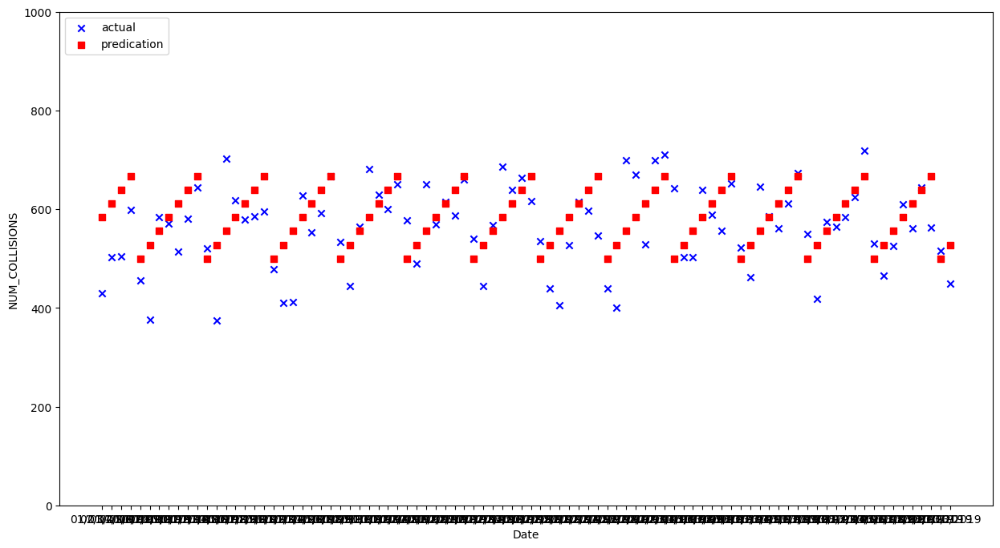

In [ ]:
plt.rcParams["figure.figsize"] = (15,8)
plt.scatter(df_2019_test_data["collision_date"][:90], df_2019_test_data["NUM_COLLISIONS"][:90], c='b', marker='x', label='actual')
plt.scatter(df_2019_test_data["collision_date"][:90], day_model_predictions[:90], c='r', marker='s', label='predication')
plt.xlabel('Date')
plt.ylabel('NUM_COLLISIONS')
plt.ylim(0, 1000)
plt.legend(loc='upper left')
plt.show()

Predictions are generally not too bad but could be better to reflect some of the outliers visible.

<Figure size 1000x500 with 0 Axes>

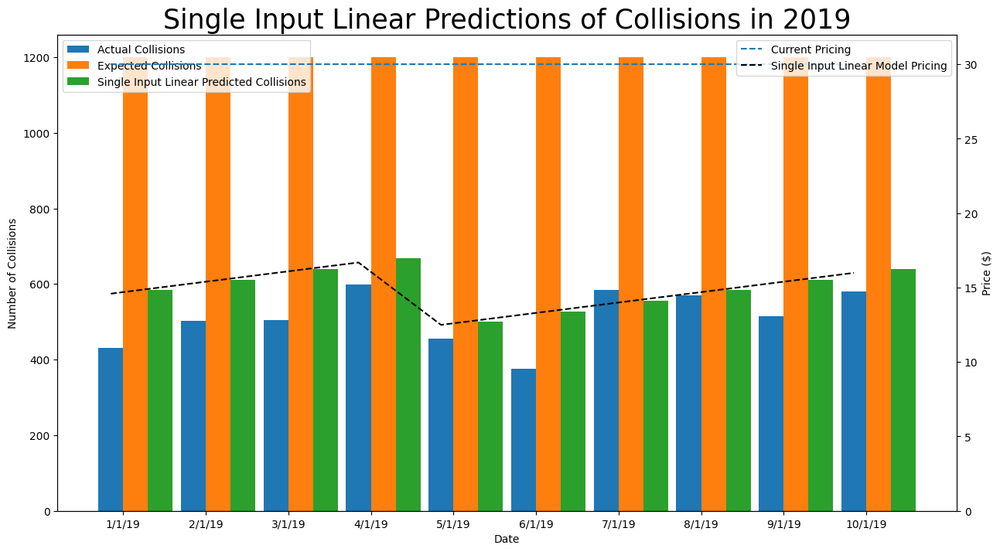

In [ ]:
# Creating bar graph for comparing single input model predictions, expected collisions
# and actual collisions for the first 10 days of 2019
expected_collision = np.ones(10) * 1200

# Numbers of pairs of bars
N = 10 # 10 days of predictions

# Actual Number of Collisions (2019)
actual_bar = df_2019_test_data["NUM_COLLISIONS"][:10]
# Expected Number of Collisions (1200 per day)
expected_bar = expected_collision
# Predicted Number of Collisions
predicted_bar = np.squeeze(day_model_predictions[:10])

# Position of bars on x-axis
ind = np.arange(N)

# Figure size
plt.figure(figsize=(10,5))

# Width of a bar
width = 0.3

# Plotting

# Creating plot with dataset_1
fig, ax1 = plt.subplots()

ax1.set_xlabel('Date')
ax1.set_ylabel('Number of Collisions')
ax1.bar(ind, actual_bar, width, label='Actual Collisions')
ax1.bar(ind + width, expected_bar, width, label='Expected Collisions')
ax1.bar(ind + width + width, predicted_bar, width, label='Single Input Linear Predicted Collisions')
plt.legend(loc='upper left')
plt.title('Single Input Linear Predictions of Collisions in 2019', fontsize=25)

# xticks()
# First argument - A list of positions at which ticks should be placed
# Second argument -  A list of labels to place at the given locations
plt.xticks(ind + width / 2, ('1/1/19', '2/1/19', '3/1/19', '4/1/19',
                             '5/1/19', '6/1/19', '7/1/19', '8/1/19',
                             '9/1/19', '10/1/19'))

# Adding Twin Axes to plot using dataset_2
ax2 = ax1.twinx()

ax2.plot(ind, np.ones(10) * 30, label='Current Pricing', linestyle='dashed')
ax2.plot(ind, day_model_predictions[:10].squeeze() / 1200 * 30, label='Single Input Linear Model Pricing',
         linestyle='dashed', color='black')
ax2.set_ylabel('Price ($)')
ax2.set_ylim(0, 32)


# Finding the best position for legends and putting it
plt.legend(loc='upper right')
plt.show()

**First multi-linear model** (Day, Temp, Dewp, Maxtemp, Mintemp)

In [ ]:
input_data_multi_linear = [df_2019_test_data["day"][:90], df_2019_test_data["temp"][:90], df_2019_test_data["dewp"][:90], df_2019_test_data["max"][:90], df_2019_test_data["min"][:90]]
headers = ["day","temp", "dewp", "maxtemp", "mintemp"]
df_input_data_multi_linear = pd.concat(input_data_multi_linear, axis=1, keys=headers)
df_input_data_multi_linear.head()

,day,temp,dewp,maxtemp,mintemp
0,4,50.5,43.2,57.9,36.0
1,5,38.0,23.2,57.9,35.1
2,6,41.1,29.4,44.1,35.1
3,7,39.7,26.4,46.0,35.1
4,1,44.2,41.0,46.9,35.1


In [ ]:
linear_multi_predictions = linear_model.predict(df_input_data_multi_linear) * scale_factor

3/3 [==============================] - 0s 2ms/step


In [ ]:
# linear_multi_predictions

In [ ]:
linear_model_all = linear_model.predict(df_input_data_multi_linear) * scale_factor
linear_model_all = linear_model_all.squeeze() / 1200 * 30 # Generating new rates per day

3/3 [==============================] - 0s 2ms/step


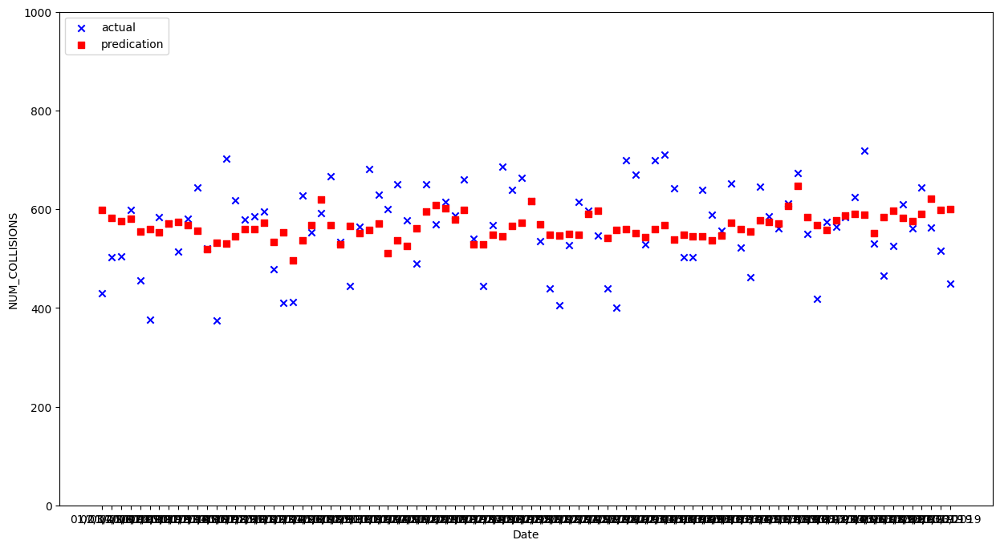

In [ ]:
plt.rcParams["figure.figsize"] = (15,8)
plt.scatter(df_2019_test_data["collision_date"][:90], df_2019_test_data["NUM_COLLISIONS"][:90], c='b', marker='x', label='actual')
plt.scatter(df_2019_test_data["collision_date"][:90], linear_multi_predictions[:90], c='r', marker='s', label='predication')
plt.xlabel('Date')
plt.ylabel('NUM_COLLISIONS')
plt.ylim(0, 1000)
plt.legend(loc='upper left')
plt.show()

Multiple input model does not seem to show any improvements over single input one. Based on the MAE results, this model tends to be worse than the linear single input model. Looking at the visualisations, it does not seem likely that this model is better than the single input one.

<Figure size 1000x500 with 0 Axes>

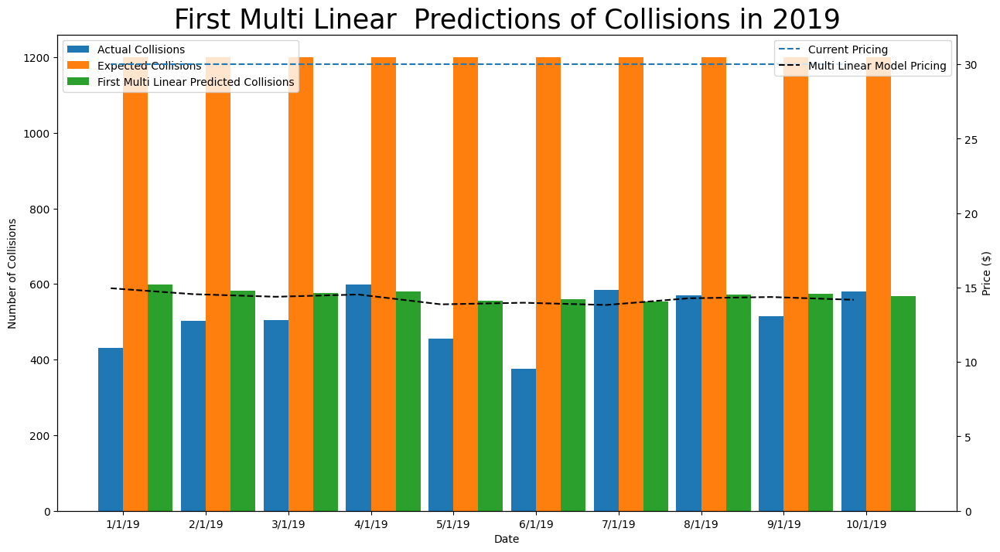

In [ ]:
# Creating bar graph for comparing First Multi Linear model predictions, expected collisions
# and actual collisions for the first 10 days of 2019
expected_collision = np.ones(10) * 1200

# Numbers of pairs of bars
N = 10 # 10 days of predictions

# Actual Number of Collisions (2019)
actual_bar = df_2019_test_data["NUM_COLLISIONS"][:10]
# Expected Number of Collisions (1200 per day)
expected_bar = expected_collision
# Predicted Number of Collisions
predicted_bar = np.squeeze(linear_multi_predictions[:10])

# Position of bars on x-axis
ind = np.arange(N)

# Figure size
plt.figure(figsize=(10,5))

# Width of a bar
width = 0.3

# Plotting

# Creating plot with dataset_1
fig, ax1 = plt.subplots()

ax1.set_xlabel('Date')
ax1.set_ylabel('Number of Collisions')
ax1.bar(ind, actual_bar, width, label='Actual Collisions')
ax1.bar(ind + width, expected_bar, width, label='Expected Collisions')
ax1.bar(ind + width + width, predicted_bar, width, label='First Multi Linear Predicted Collisions')
plt.legend(loc='upper left')
plt.title('First Multi Linear  Predictions of Collisions in 2019', fontsize=25)

# xticks()
# First argument - A list of positions at which ticks should be placed
# Second argument -  A list of labels to place at the given locations
plt.xticks(ind + width / 2, ('1/1/19', '2/1/19', '3/1/19', '4/1/19',
                             '5/1/19', '6/1/19', '7/1/19', '8/1/19',
                             '9/1/19', '10/1/19'))

# Adding Twin Axes to plot using dataset_2
ax2 = ax1.twinx()

ax2.plot(ind, np.ones(10) * 30, label='Current Pricing', linestyle='dashed')
ax2.plot(ind, linear_multi_predictions[:10].squeeze() / 1200 * 30, label='Multi Linear Model Pricing',
         linestyle='dashed', color='black')
ax2.set_ylabel('Price ($)')
ax2.set_ylim(0, 32)


# Finding the best position for legends and putting it
plt.legend(loc='upper right')
plt.show()

**Multi-Linear Model 2 predictions** (includes other variables except wdsp, mxpsd, sndp and gust)

In [ ]:
df_2019_test_data.head()

,day,year,mo,da,collision_date,temp,dewp,slp,visib,wdsp,mxpsd,gust,max,min,prcp,sndp,fog,NUM_COLLISIONS
0,4,2019,1,1,01/01/2019,50.5,43.2,1009.8,7.0,999.9,999.9,999.9,57.9,36.0,1.08,999.9,0,430
1,5,2019,1,2,02/01/2019,38.0,23.2,1024.2,10.0,999.9,999.9,999.9,57.9,35.1,0.06,999.9,0,502
2,6,2019,1,3,03/01/2019,41.1,29.4,1015.8,9.9,999.9,999.9,999.9,44.1,35.1,0.00,999.9,0,504
3,7,2019,1,4,04/01/2019,39.7,26.4,1014.8,9.9,999.9,999.9,999.9,46.0,35.1,0.00,999.9,0,598
4,1,2019,1,5,05/01/2019,44.2,41.0,1003.3,5.3,999.9,999.9,999.9,46.9,35.1,0.22,999.9,0,455


In [ ]:
input_data_multi_linear = [df_2019_test_data["day"][:90], df_2019_test_data["temp"][:90], df_2019_test_data["dewp"][:90], df_2019_test_data["slp"][:90], df_2019_test_data["visib"][:90], df_2019_test_data["max"][:90], df_2019_test_data["min"][:90], df_2019_test_data["prcp"][:90], df_2019_test_data["fog"][:90]]
headers = ["day","temp", "dewp", "slp", "visib", "maxtemp", "mintemp", "prcp", "fog"]
df_input_data_multi_linear = pd.concat(input_data_multi_linear, axis=1, keys=headers)
df_input_data_multi_linear.head()

,day,temp,dewp,slp,visib,maxtemp,mintemp,prcp,fog
0,4,50.5,43.2,1009.8,7.0,57.9,36.0,1.08,0
1,5,38.0,23.2,1024.2,10.0,57.9,35.1,0.06,0
2,6,41.1,29.4,1015.8,9.9,44.1,35.1,0.00,0
3,7,39.7,26.4,1014.8,9.9,46.0,35.1,0.00,0
4,1,44.2,41.0,1003.3,5.3,46.9,35.1,0.22,0


In [ ]:
linear_multi_2_predictions = linear_model_2.predict(df_input_data_multi_linear) * scale_factor

3/3 [==============================] - 0s 2ms/step


In [ ]:
# linear_multi_2_predictions

In [ ]:
linear_model_2_all = linear_model_2.predict(df_input_data_multi_linear) * scale_factor
linear_model_2_all = linear_model_2_all.squeeze() / 1200 * 30 # Generating new rates per day

3/3 [==============================] - 0s 2ms/step


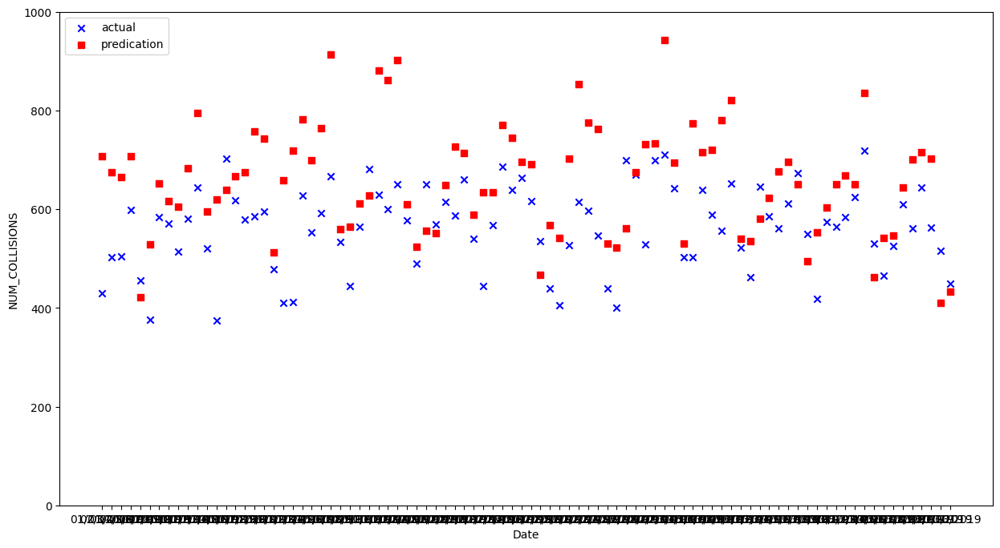

In [ ]:
plt.rcParams["figure.figsize"] = (15,8)
plt.scatter(df_2019_test_data["collision_date"][:90], df_2019_test_data["NUM_COLLISIONS"][:90], c='b', marker='x', label='actual')
plt.scatter(df_2019_test_data["collision_date"][:90], linear_multi_2_predictions[:90], c='r', marker='s', label='predication')
plt.xlabel('Date')
plt.ylabel('NUM_COLLISIONS')
plt.ylim(0, 1000)
plt.legend(loc='upper left')
plt.show()

<Figure size 1000x500 with 0 Axes>

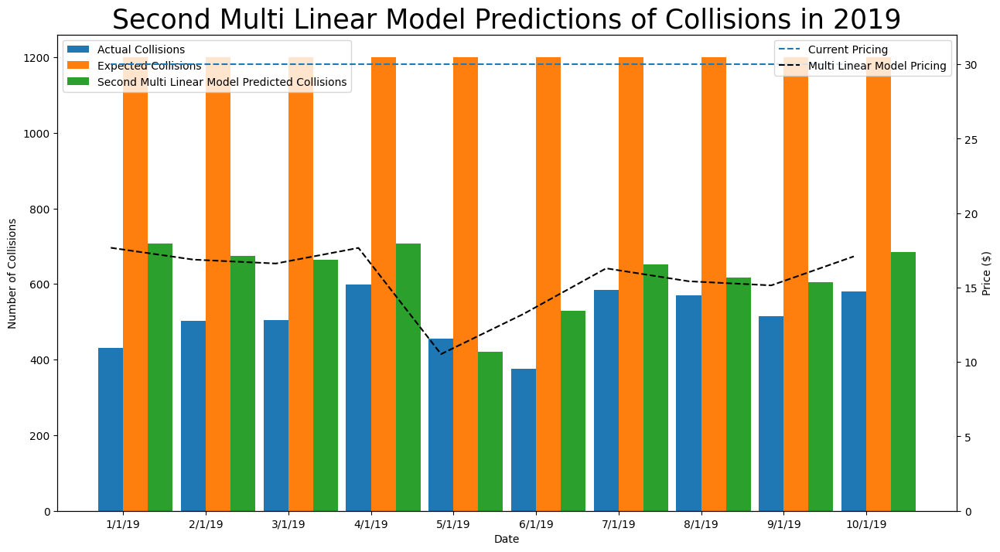

In [ ]:
# Creating bar graph for comparing Second Multi Linear model predictions, expected collisions
# and actual collisions for the first 10 days of 2019
expected_collision = np.ones(10) * 1200

# Numbers of pairs of bars
N = 10 # 10 days of predictions

# Actual Number of Collisions (2019)
actual_bar = df_2019_test_data["NUM_COLLISIONS"][:10]
# Expected Number of Collisions (1200 per day)
expected_bar = expected_collision
# Predicted Number of Collisions
predicted_bar = np.squeeze(linear_multi_2_predictions[:10])

# Position of bars on x-axis
ind = np.arange(N)

# Figure size
plt.figure(figsize=(10,5))

# Width of a bar
width = 0.3

# Plotting

# Creating plot with dataset_1
fig, ax1 = plt.subplots()

ax1.set_xlabel('Date')
ax1.set_ylabel('Number of Collisions')
ax1.bar(ind, actual_bar, width, label='Actual Collisions')
ax1.bar(ind + width, expected_bar, width, label='Expected Collisions')
ax1.bar(ind + width + width, predicted_bar, width, label='Second Multi Linear Model Predicted Collisions')
plt.legend(loc='upper left')
plt.title('Second Multi Linear Model Predictions of Collisions in 2019', fontsize=25)

# xticks()
# First argument - A list of positions at which ticks should be placed
# Second argument -  A list of labels to place at the given locations
plt.xticks(ind + width / 2, ('1/1/19', '2/1/19', '3/1/19', '4/1/19',
                             '5/1/19', '6/1/19', '7/1/19', '8/1/19',
                             '9/1/19', '10/1/19'))

# Adding Twin Axes to plot using dataset_2
ax2 = ax1.twinx()

ax2.plot(ind, np.ones(10) * 30, label='Current Pricing', linestyle='dashed')
ax2.plot(ind, linear_multi_2_predictions[:10].squeeze() / 1200 * 30, label='Multi Linear Model Pricing',
         linestyle='dashed', color='black')
ax2.set_ylabel('Price ($)')
ax2.set_ylim(0, 32)


# Finding the best position for legends and putting it
plt.legend(loc='upper right')
plt.show()

**Random Forest Regression Model 1 Predictions** (day, temp, dewp, maxtemp, mintemp)

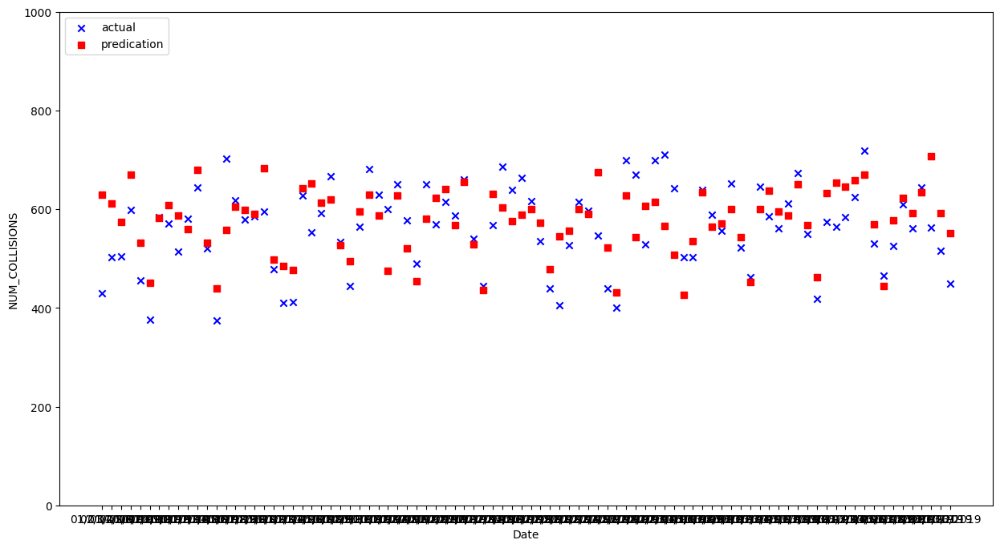

In [ ]:
plt.rcParams["figure.figsize"] = (15,8)
plt.scatter(df_2019_test_data["collision_date"][:90], df_2019_test_data["NUM_COLLISIONS"][:90], c='b', marker='x', label='actual')
plt.scatter(df_2019_test_data["collision_date"][:90], y_pred_rfr_2019[:90], c='r', marker='s', label='predication')
plt.xlabel('Date')
plt.ylabel('NUM_COLLISIONS')
plt.ylim(0, 1000)
plt.legend(loc='upper left')
plt.show()

This first random forest model actually tends to shows the best predictions so far if seen visually.

**Random Forest Regression Model 2 Predictions** (all variables except for wdsp, mxpsd, gust and sndp)

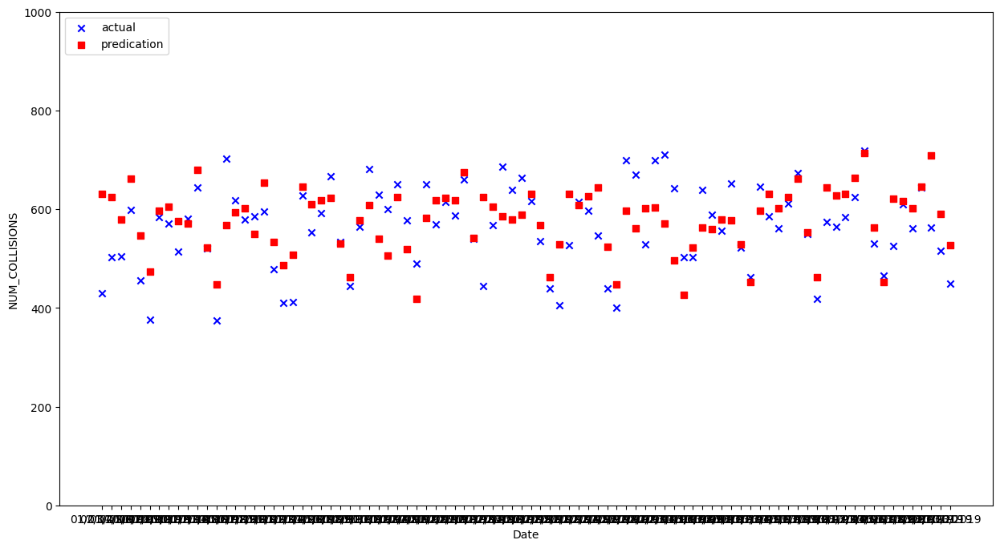

In [ ]:
plt.rcParams["figure.figsize"] = (15,8)
plt.scatter(df_2019_test_data["collision_date"][:90], df_2019_test_data["NUM_COLLISIONS"][:90], c='b', marker='x', label='actual')
plt.scatter(df_2019_test_data["collision_date"][:90], y_pred_rfr_2_2019[:90], c='r', marker='s', label='predication')
plt.xlabel('Date')
plt.ylabel('NUM_COLLISIONS')
plt.ylim(0, 1000)
plt.legend(loc='upper left')
plt.show()

Visually there's not much difference between the first and second random forest regression models. Both show relatively very good reflections of the actual data compared to the previous models.

**DNN Model 1 Predictions**

In [ ]:
df_2019_test_data_dnn = df_2019_test_data.copy()
# One-Hot Encoding for day
df_2019_test_data_dnn['day'] = df_2019_test_data_dnn['day'].map({ 1: 'Sunday', 2: 'Monday', 3: 'Tuesday', 4: 'Wednesday', 5: 'Thursday', 6: 'Friday', 7: 'Saturday'})
df_2019_test_data_dnn = pd.get_dummies(df_2019_test_data_dnn, columns=['day'], prefix='', prefix_sep='')

# One-Hot Encoding for month
df_2019_test_data_dnn['mo'] = df_2019_test_data_dnn['mo'].map({ 1: 'January', 2: 'February', 3: 'March', 4: 'April', 5: 'May', 6: 'June', 7: 'July', 8: 'August', 9: 'September', 10: 'October', 11: 'November', 12: 'December'})
df_2019_test_data_dnn = pd.get_dummies(df_2019_test_data_dnn, columns=['mo'], prefix='', prefix_sep='')


In [ ]:
df_2019_test_data_dnn.head() # Checking over the data

,year,da,collision_date,temp,dewp,slp,visib,wdsp,mxpsd,gust,max,min,prcp,sndp,fog,NUM_COLLISIONS,Friday,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday,April,August,December,February,January,July,June,March,May,November,October,September
0,2019,1,01/01/2019,50.5,43.2,1009.8,7.0,999.9,999.9,999.9,57.9,36.0,1.08,999.9,0,430,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0
1,2019,2,02/01/2019,38.0,23.2,1024.2,10.0,999.9,999.9,999.9,57.9,35.1,0.06,999.9,0,502,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0
2,2019,3,03/01/2019,41.1,29.4,1015.8,9.9,999.9,999.9,999.9,44.1,35.1,0.00,999.9,0,504,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
3,2019,4,04/01/2019,39.7,26.4,1014.8,9.9,999.9,999.9,999.9,46.0,35.1,0.00,999.9,0,598,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4,2019,5,05/01/2019,44.2,41.0,1003.3,5.3,999.9,999.9,999.9,46.9,35.1,0.22,999.9,0,455,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0


There is a lot of missing data from wdsp, mxpsd, gust and sndp. This is why gust and sndp weren't included in any of the models. It is also best to choose the DNN model which was trained without wdsp and mxpsd.

Create a new dataframe based on the inputs required

In [ ]:
array_2019_test_data_dnn = [df_2019_test_data_dnn["year"], df_2019_test_data_dnn["temp"], df_2019_test_data_dnn["dewp"], df_2019_test_data_dnn["slp"], df_2019_test_data_dnn["visib"], df_2019_test_data_dnn["max"], df_2019_test_data_dnn["min"], df_2019_test_data_dnn["prcp"], df_2019_test_data_dnn["fog"], df_2019_test_data_dnn["Sunday"], df_2019_test_data_dnn["Monday"], df_2019_test_data_dnn["Tuesday"], df_2019_test_data_dnn["Wednesday"], df_2019_test_data_dnn["Thursday"], df_2019_test_data_dnn["Friday"], df_2019_test_data_dnn["Saturday"], df_2019_test_data_dnn["January"], df_2019_test_data_dnn["February"], df_2019_test_data_dnn["March"], df_2019_test_data_dnn["April"], df_2019_test_data_dnn["May"], df_2019_test_data_dnn["June"], df_2019_test_data_dnn["July"], df_2019_test_data_dnn["August"], df_2019_test_data_dnn["September"], df_2019_test_data_dnn["October"], df_2019_test_data_dnn["November"], df_2019_test_data_dnn["December"]]
headers = ["year","temp","dewp","slp","visib", "maxtemp", "mintemp", "prcp", "fog","Sunday","Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","January","February","March","April","May","June","July","August","September","October","November","December"]
df_2019_test_data_dnn_cleaned = pd.concat(array_2019_test_data_dnn, axis=1, keys=headers)
df_2019_test_data_dnn_cleaned.head()

,year,temp,dewp,slp,visib,maxtemp,mintemp,prcp,fog,Sunday,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,January,February,March,April,May,June,July,August,September,October,November,December
0,2019,50.5,43.2,1009.8,7.0,57.9,36.0,1.08,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
1,2019,38.0,23.2,1024.2,10.0,57.9,35.1,0.06,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0
2,2019,41.1,29.4,1015.8,9.9,44.1,35.1,0.00,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0
3,2019,39.7,26.4,1014.8,9.9,46.0,35.1,0.00,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0
4,2019,44.2,41.0,1003.3,5.3,46.9,35.1,0.22,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0


Generating predictions

In [ ]:
dnn_predictions_2019 = dnn_model.predict(df_2019_test_data_dnn_cleaned[:90])*scale_factor

3/3 [==============================] - 0s 2ms/step


In [ ]:
#print(dnn_predictions_2019)

In [ ]:
dnn_model_all = dnn_model.predict(df_2019_test_data_dnn_cleaned)*scale_factor
dnn_model_all = dnn_model_all.squeeze() / 1200 * 30 # Generating new rates per day

12/12 [==============================] - 0s 1ms/step


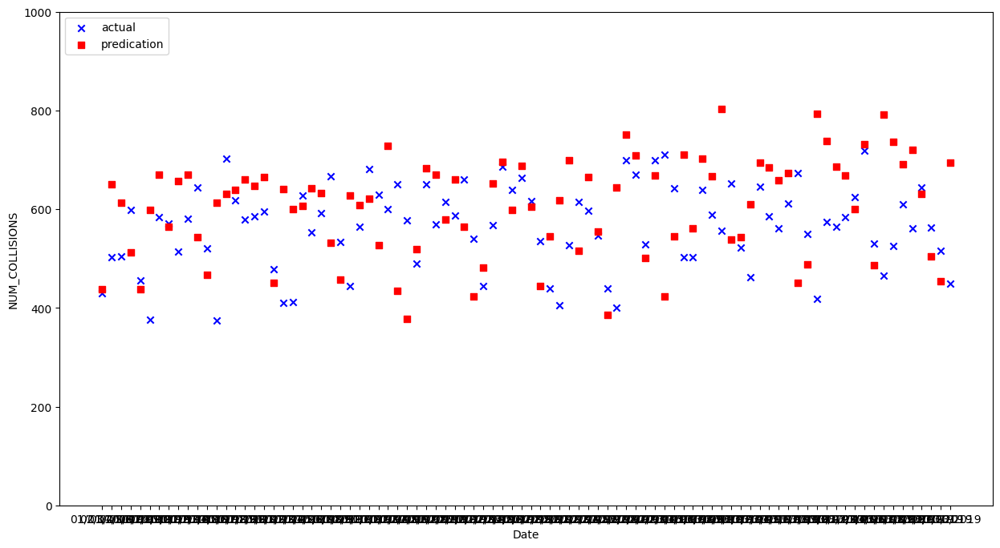

In [ ]:
plt.rcParams["figure.figsize"] = (15,8)
plt.scatter(df_2019_test_data["collision_date"][:90], df_2019_test_data["NUM_COLLISIONS"][:90], c='b', marker='x', label='actual')
plt.scatter(df_2019_test_data["collision_date"][:90], dnn_predictions_2019[:90], c='r', marker='s', label='predication')
plt.xlabel('Date')
plt.ylabel('NUM_COLLISIONS')
plt.ylim(0, 1000)
plt.legend(loc='upper left')
plt.show()

The first DNN model also shows relatively very good predictions of the 2019 dataset (as what is expected) compared to the linear models. Although based on the MAE values, the random forest models are actually better than the DNN model.

As you may have noticed, I did not generate predictions for the third multi-linear model and the second DNN model as wdsp and mxpsd were generally unusable in the 2019 dataset due to the large amounts of missing values. I could replace these missing values with the mean, but due to the large amount of missing value, there is too high of a risk of skewing the data, giving unrealistic results.

Making plot of predicted NUM_COLLISIONS for DNN model and expected number (1200)

<Figure size 1000x500 with 0 Axes>

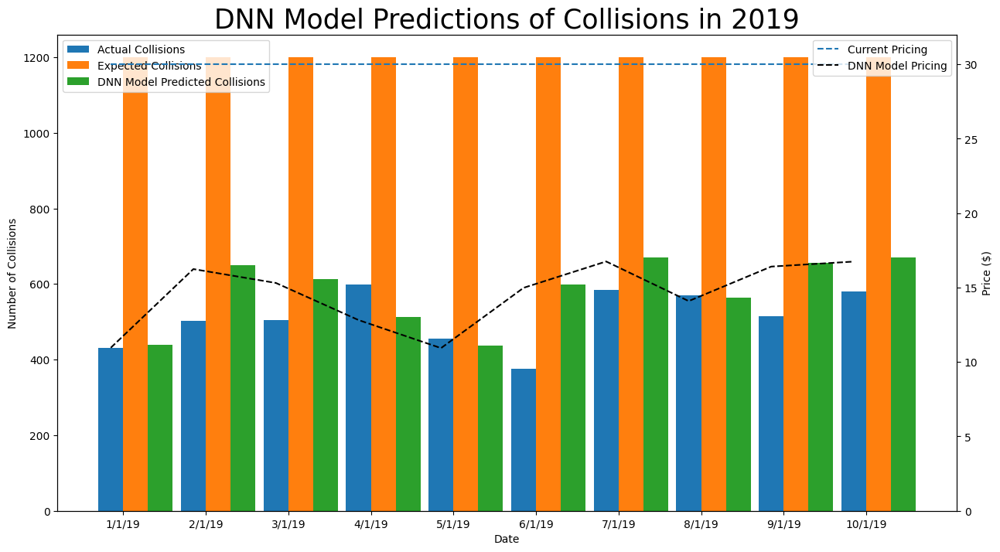

In [ ]:
# Creating bar graph for comparing DNN model predictions, expected collisions
# and actual collisions for the first 10 days of 2019
expected_collision = np.ones(10) * 1200

# Numbers of pairs of bars
N = 10 # 10 days of predictions

# Actual Number of Collisions (2019)
actual_bar = df_2019_test_data["NUM_COLLISIONS"][:10]
# Expected Number of Collisions (1200 per day)
expected_bar = expected_collision
# Predicted Number of Collisions
predicted_bar = np.squeeze(dnn_predictions_2019[:10])

# Position of bars on x-axis
ind = np.arange(N)

# Figure size
plt.figure(figsize=(10,5))

# Width of a bar
width = 0.3

# Plotting

# Creating plot with dataset_1
fig, ax1 = plt.subplots()

ax1.set_xlabel('Date')
ax1.set_ylabel('Number of Collisions')
ax1.bar(ind, actual_bar, width, label='Actual Collisions')
ax1.bar(ind + width, expected_bar, width, label='Expected Collisions')
ax1.bar(ind + width + width, predicted_bar, width, label='DNN Model Predicted Collisions')
plt.legend(loc='upper left')
plt.title('DNN Model Predictions of Collisions in 2019', fontsize=25)

# xticks()
# First argument - A list of positions at which ticks should be placed
# Second argument -  A list of labels to place at the given locations
plt.xticks(ind + width / 2, ('1/1/19', '2/1/19', '3/1/19', '4/1/19',
                             '5/1/19', '6/1/19', '7/1/19', '8/1/19',
                             '9/1/19', '10/1/19'))

# Adding Twin Axes to plot using dataset_2
ax2 = ax1.twinx()

ax2.plot(ind, np.ones(10) * 30, label='Current Pricing', linestyle='dashed')
ax2.plot(ind, dnn_predictions_2019[:10].squeeze() / 1200 * 30, label='DNN Model Pricing',
         linestyle='dashed', color='black')
ax2.set_ylabel('Price ($)')
ax2.set_ylim(0, 32)


# Finding the best position for legends and putting it
plt.legend(loc='upper right')
plt.show()

**Generating calculations and predictions for profit/loss**

Assuming a linear relationship for policy against NUM_COLLISIONS

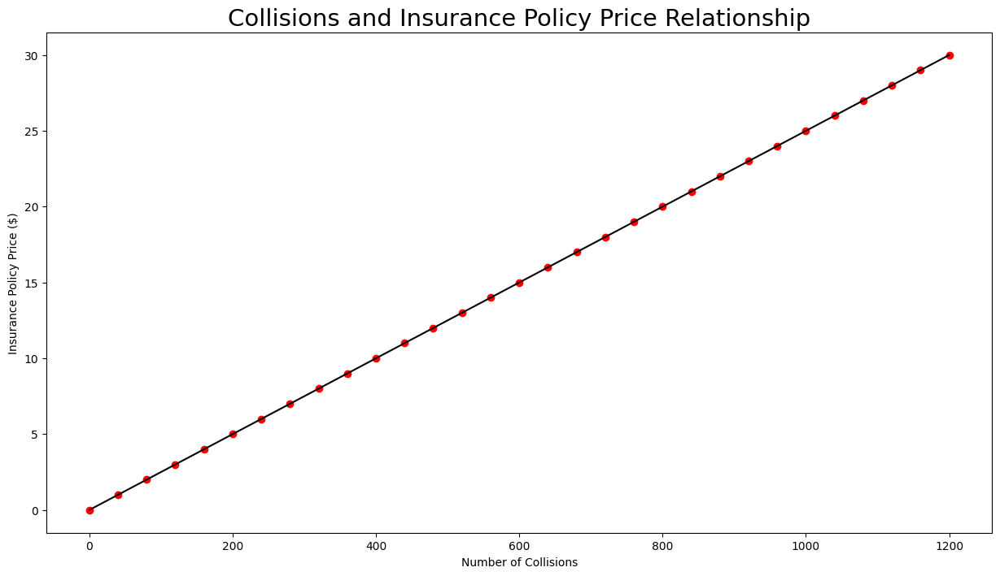

In [ ]:
x = np.linspace(0,1200,31)
y = np.linspace(0,30,31)
plt.plot(x, y, color='black')
plt.scatter(x, y, color='red')
plt.xlabel('Number of Collisions')
plt.ylabel('Insurance Policy Price ($)')
plt.title('Collisions and Insurance Policy Price Relationship', fontsize=21)
plt.show()

Baseline calculations

In [ ]:
# Revenue calculation
flat_rate_waiver = 30 # $30 per customer insurance waiver
revenue = 0.3 * 20000 * 30 # Assuming 30% of 20,000 customers take $30 waiver
print(revenue)

180000.0


The company generates $180,000 from the sales of these waivers

Calculating cost of collisions

In [ ]:
# Collision costs
collision_cost = 0.08 * 20000 * 500 # Assuming 8% of 20,000 customers face collisions - $500/collision
print("Total collision cost: $", collision_cost)
company_coverage = 0.1 * collision_cost
print("Company coverage: $", company_coverage)
baseline_profit = revenue - company_coverage
print("Daily baseline profit: $", baseline_profit, " assuming $30 package with 30% customers taking it")

Total collision cost: $ 800000.0
Company coverage: $ 80000.0
Daily baseline profit: $ 100000.0  assuming $30 package with 30% customers taking it


Collisions cost about 800k in total per day. 10% covered by company due waiver/fraud, resulting in 100k profit per day (180k-80k=100k)

In [ ]:
# 3 month profit
three_month_baseline_profit = 90 * baseline_profit
print(three_month_baseline_profit) # Profit made within 3 months (to compare to regression models)

9000000.0


$9 million in profit over three months (90 days)

day_model prediction and calculations

In [ ]:
# Getting rates per day - assuming linear relationship from 0 to 1200 collisions
# 0 collisions = $0, 1200 collisions = $30
normalised_predictions = day_model_predictions.squeeze() / 1200 * 30 # Generating new rates per day
print(normalised_predictions)

[14.590237  15.2890415 15.987848  16.686657  12.493817  13.192624
 13.891431  14.590237  15.2890415 15.987848  16.686657  12.493817
 13.192624  13.891431  14.590237  15.2890415 15.987848  16.686657
 12.493817  13.192624  13.891431  14.590237  15.2890415 15.987848
 16.686657  12.493817  13.192624  13.891431  14.590237  15.2890415
 15.987848  16.686657  12.493817  13.192624  13.891431  14.590237
 15.2890415 15.987848  16.686657  12.493817  13.192624  13.891431
 14.590237  15.2890415 15.987848  16.686657  12.493817  13.192624
 13.891431  14.590237  15.2890415 15.987848  16.686657  12.493817
 13.192624  13.891431  14.590237  15.2890415 15.987848  16.686657
 12.493817  13.192624  13.891431  14.590237  15.2890415 15.987848
 16.686657  12.493817  13.192624  13.891431  14.590237  15.2890415
 15.987848  16.686657  12.493817  13.192624  13.891431  14.590237
 15.2890415 15.987848  16.686657  12.493817  13.192624  13.891431
 14.590237  15.2890415 15.987848  16.686657  12.493817  13.192624 ]


In [ ]:
# Calculating revenue over 3 months
# Assume that 80% of customers take waiver due to lower price (as mentioned above)
total_waiver = 0.8 * 20000
day_model_revenue = (normalised_predictions * total_waiver).sum()
print("Day model 3-month revenue: $", day_model_revenue)
print("Day model daily revenue: $", day_model_revenue/90)

Day model 3-month revenue: $ 21021122.0
Day model daily revenue: $ 233568.02222222224


In [ ]:
# Collision costs
# Still assuming 8% of 20,000 customers face collisions, each worth $500
collision_cost = 0.08 * 20000 * 500 # Assuming 8% of 20,000 customers face collisions - $500/collision
print("Daily total collision cost: $", collision_cost)
company_coverage = 0.1 * collision_cost
print("Daily company coverage: $", company_coverage)
print("3-month company coverage: $", company_coverage * 90)
print("3-month company profit: $", day_model_revenue - (company_coverage * 90))

Daily total collision cost: $ 800000.0
Daily company coverage: $ 80000.0
3-month company coverage: $ 7200000.0
3-month company profit: $ 13821122.0


Definitely more than the $100,000 baseline profit.
On average about 60-70% increase depending on the run

Multi-linear model predictions and calculations

In [ ]:
# Getting rates per day - assuming linear relationship from 0 to 1200 collisions
# 0 collisions = $0, 1200 collisions = $30
normalised_predictions = linear_multi_predictions.squeeze() / 1200 * 30 # Generating new rates per day
print(normalised_predictions)

[14.955301  14.557772  14.38404   14.533739  13.872994  13.982098
 13.831174  14.281017  14.3660965 14.178254  13.905813  12.9858265
 13.308868  13.253934  13.619367  14.003601  13.997978  14.301392
 13.352917  13.819026  12.421486  13.415709  14.204144  15.508434
 14.187161  13.232529  14.165911  13.791931  13.93047   14.263354
 12.786828  13.431106  13.118097  14.03683   14.883952  15.19031
 15.026483  14.464159  14.9772625 13.221019  13.214473  13.714114
 13.64263   14.157786  14.325847  15.420513  14.218893  13.709132
 13.671011  13.745613  13.713417  14.742682  14.905409  13.542884
 13.953906  13.988733  13.779854  13.603199  14.002177  14.198873
 13.477275  13.704811  13.625151  13.639822  13.436702  13.6493225
 14.326307  14.006724  13.859022  14.446875  14.368439  14.265259
 15.181661  16.170835  14.586456  14.184216  13.948694  14.420926
 14.681202  14.766609  14.707565  13.772005  14.6004715 14.915596
 14.573794  14.380099  14.774538  15.518083  14.950939  14.9910345]


In [ ]:
# Calculating revenue over 3 months
# Assume that 80% of customers take waiver due to lower price (as mentioned above)
total_waiver = 0.8 * 20000
linear_multi_revenue = (normalised_predictions * total_waiver).sum()
print("Linear Multi model 3-month revenue: $", linear_multi_revenue)
print("Linear Multi model daily revenue: $", linear_multi_revenue/90)

Linear Multi model 3-month revenue: $ 20350880.0
Linear Multi model daily revenue: $ 226120.88888888888


In [ ]:
# Collision costs
# Still assuming 8% of 20,000 customers face collisions, each worth $500
collision_cost = 0.08 * 20000 * 500 # Assuming 8% of 20,000 customers face collisions - $500 per collision
print("Daily total collision cost: $", collision_cost)
company_coverage = 0.1 * collision_cost
print("Daily company coverage: $", company_coverage)
print("3-month company coverage: $", company_coverage * 90)
print("3-month company profit: $", linear_multi_revenue - (company_coverage * 90))

Daily total collision cost: $ 800000.0
Daily company coverage: $ 80000.0
3-month company coverage: $ 7200000.0
3-month company profit: $ 13150880.0


Multi Linear Model 2 predictions and calculations (including other variables except wdsp, mxpsd, gust and sndp)

In [ ]:
# Getting rates per day - assuming linear relationship from 0 to 1200 collisions
# 0 collisions = $0, 1200 collisions = $30
normalised_predictions = linear_multi_2_predictions.squeeze() / 1200 * 30 # Generating new rates per day
print(normalised_predictions)

[17.674738  16.8796    16.617395  17.664974  10.530274  13.230279
 16.293285  15.424345  15.146973  17.093935  19.86261   14.899388
 15.500575  15.969599  16.649786  16.854816  18.930553  18.570885
 12.814444  16.452303  17.973389  19.559547  17.489809  19.119867
 22.848959  13.981257  14.092717  15.308896  15.697123  22.023815
 21.554232  22.541395  15.260815  13.093869  13.908059  13.78606
 16.223146  18.156656  17.855515  14.740097  15.8402    15.856941
 19.264538  18.623173  17.417315  17.29308   11.695795  14.194616
 13.526983  17.561623  21.320375  19.379402  19.079002  13.250069
 13.051838  14.049826  16.885971  18.293457  18.31524   23.574406
 17.375046  13.269684  19.35035   17.905092  17.99212   19.502535
 20.52645   13.493551  13.368601  14.5288925 15.561805  16.907139
 17.395058  16.2688    12.349636  13.81246   15.092683  16.26953
 16.70577   16.269535  20.878698  11.541526  13.552504  13.650722
 16.08754   17.532635  17.870422  17.545164  10.270007  10.819912 ]


In [ ]:
# Calculating revenue over 3 months
# Assume that 80% of customers take waiver due to lower price (as mentioned above)
total_waiver = 0.8 * 20000
linear_multi_2_revenue = (normalised_predictions * total_waiver).sum()
print("Second Linear Multi model 3-month revenue: $", linear_multi_2_revenue)
print("Second Linear Multi model daily revenue: $", linear_multi_2_revenue/90)

Second Linear Multi model 3-month revenue: $ 23687098.0
Second Linear Multi model daily revenue: $ 263189.97777777776


In [ ]:
# Collision costs
# Still assuming 8% of 20,000 customers face collisions, each worth $500
collision_cost = 0.08 * 20000 * 500 # Assuming 8% of 20,000 customers face collisions - $500 per collision
print("Daily total collision cost: $", collision_cost)
company_coverage = 0.1 * collision_cost
print("Daily company coverage: $", company_coverage)
print("3-month company coverage: $", company_coverage * 90)
print("3-month company profit: $", linear_multi_2_revenue - (company_coverage * 90))

Daily total collision cost: $ 800000.0
Daily company coverage: $ 80000.0
3-month company coverage: $ 7200000.0
3-month company profit: $ 16487098.0


First Random Forest Regression model predictions and calculations (day, temp, dewp, maxtemp, mintemp)

In [ ]:
# Getting rates per day - assuming linear relationship from 0 to 1200 collisions
# 0 collisions = $0, 1200 collisions = $30
normalised_predictions = y_pred_rfr_2019[:90].squeeze() / 1200 * 30 # Generating new rates per day
print(normalised_predictions)

[15.7315  15.2905  14.35275 16.77025 13.28425 11.275   14.5645  15.2205
 14.676   13.971   16.9865  13.283   10.96725 13.9335  15.12325 14.96875
 14.76875 17.09275 12.444   12.1095  11.90925 16.05475 16.28825 15.316
 15.47675 13.16525 12.3555  14.863   15.738   14.6605  11.86075 15.69325
 13.00125 11.33275 14.53725 15.57975 16.01925 14.18825 16.40425 13.2105
 10.9055  15.78525 15.0745  14.38075 14.71525 14.99975 14.323   11.9635
 13.626   13.928   14.996   14.7675  16.86325 13.065   10.7745  15.70875
 13.5855  15.17975 15.38875 14.15925 12.69425 10.67125 13.37175 15.85375
 14.09475 14.2545  15.015   13.5765  11.3035  14.98675 15.94025 14.87625
 14.66625 16.2675  14.202   11.55625 15.8045  16.32675 16.1375  16.45425
 16.7495  14.22525 11.0945  14.45675 15.58975 14.81075 15.87225 17.701
 14.80275 13.8    ]


In [ ]:
# Calculating revenue over 3 months
# Assume that 80% of customers take waiver due to lower price (as mentioned above)
total_waiver = 0.8 * 20000
random_forest_revenue = (normalised_predictions * total_waiver).sum()
print("First Random Forest Regression model 3-month revenue: $", random_forest_revenue)

First Random Forest Regression model 3-month revenue: $ 20733020.0


In [ ]:
# Collision costs
# Still assuming 8% of 20,000 customers face collisions, each worth $500
collision_cost = 0.08 * 20000 * 500 # Assuming 8% of 20,000 customers face collisions - $500 per collision
print("Daily total collision cost: $", collision_cost)
company_coverage = 0.1 * collision_cost
print("Daily company coverage: $", company_coverage)
print("3-month company coverage: $", company_coverage * 90)
print("3-month company profit: $", random_forest_revenue - (company_coverage * 90))

Daily total collision cost: $ 800000.0
Daily company coverage: $ 80000.0
3-month company coverage: $ 7200000.0
3-month company profit: $ 13533020.0


Second random forest model predictions and calculations (all variables except wdsp, mxpsd, gust and sndp)

In [ ]:
# Getting rates per day - assuming linear relationship from 0 to 1200 collisions
# 0 collisions = $0, 1200 collisions = $30
normalised_predictions = y_pred_rfr_2_2019[:90].squeeze() / 1200 * 30 # Generating new rates per day
print(normalised_predictions)

[15.79125 15.634   14.4645  16.556   13.67925 11.83925 14.93175 15.121
 14.392   14.27625 16.98125 13.055   11.19225 14.203   14.85075 15.0555
 13.7475  16.35025 13.3315  12.17025 12.68475 16.158   15.268   15.46225
 15.5845  13.25275 11.57125 14.419   15.2125  13.50975 12.63475 15.596
 12.972   10.4795  14.547   15.44525 15.58575 15.4335  16.88775 13.54725
 15.626   15.10725 14.65825 14.47025 14.72975 15.76325 14.19075 11.57075
 13.2325  15.79625 15.2115  15.66775 16.10275 13.08125 11.19625 14.918
 14.02725 15.06025 15.09425 14.2865  12.40075 10.646   13.05625 14.07875
 13.99025 14.47675 14.43425 13.2105  11.3     14.92125 15.77725 15.0505
 15.62975 16.55225 13.8435  11.55925 16.08225 15.695   15.7805  16.5905
 17.861   14.0675  11.315   15.54175 15.4295  15.05275 16.15575 17.70725
 14.77975 13.195  ]


In [ ]:
# Calculating revenue over 3 months
# Assume that 80% of customers take waiver due to lower price (as mentioned above)
total_waiver = 0.8 * 20000
random_forest_2_revenue = (normalised_predictions * total_waiver).sum()
print("Second Random Forest Regression model 3-month revenue: $", random_forest_2_revenue)

Second Random Forest Regression model 3-month revenue: $ 20797528.0


In [ ]:
# Collision costs
# Still assuming 8% of 20,000 customers face collisions, each worth $500
collision_cost = 0.08 * 20000 * 500 # Assuming 8% of 20,000 customers face collisions - $500 per collision
print("Daily total collision cost: $", collision_cost)
company_coverage = 0.1 * collision_cost
print("Daily company coverage: $", company_coverage)
print("3-month company coverage: $", company_coverage * 90)
print("3-month company profit: $", random_forest_2_revenue - (company_coverage * 90))

Daily total collision cost: $ 800000.0
Daily company coverage: $ 80000.0
3-month company coverage: $ 7200000.0
3-month company profit: $ 13597528.0


First DNN model (without wdsp and mxpsd) predictions and calculations

In [ ]:
# Getting rates per day - assuming linear relationship from 0 to 1200 collisions
# 0 collisions = $0, 1200 collisions = $30
normalised_predictions = dnn_predictions_2019.squeeze() / 1200 * 30 # Generating new rates per day
print(normalised_predictions)

[10.957546  16.243326  15.31016   12.8195915 10.93296   14.984512
 16.75426   14.092741  16.410994  16.747389  13.570448  11.683962
 15.326437  15.780154  15.981138  16.487656  16.192345  16.628294
 11.27207   16.016064  15.014747  15.156287  16.069294  15.820817
 13.292649  11.433873  15.698095  15.211597  15.548002  13.170896
 18.204979  10.869514   9.453613  12.975115  17.088676  16.734966
 14.478657  16.514038  14.10259   10.583375  12.031204  16.318094
 17.411194  14.984116  17.216408  15.106557  11.098727  13.62319
 15.436576  17.48518   12.874289  16.618517  13.872615   9.668077
 16.115263  18.783491  17.715458  12.520027  16.69503   10.5626545
 13.620061  17.767208  14.024632  17.575945  16.677204  20.086264
 13.472836  13.579412  15.234797  17.347782  17.107885  16.453373
 16.819605  11.277588  12.204878  19.84943   18.473726  17.167711
 16.699385  15.010065  18.276764  12.153775  19.790108  18.401125
 17.261421  17.997023  15.757239  12.603796  11.35183   17.377794 ]


In [ ]:
# Calculating revenue over 3 months
# Assume that 80% of customers take waiver due to lower price (as mentioned above)
total_waiver = 0.8 * 20000
dnn_model_revenue = (normalised_predictions * total_waiver).sum()
print("First DNN model 3-month revenue: $", dnn_model_revenue)

First DNN model 3-month revenue: $ 21746738.0


In [ ]:
# Collision costs
# Still assuming 8% of 20,000 customers face collisions, each worth $500
collision_cost = 0.08 * 20000 * 500 # Assuming 8% of 20,000 customers face collisions - $500 per collision
print("Daily total collision cost: $", collision_cost)
company_coverage = 0.1 * collision_cost
print("Daily company coverage: $", company_coverage)
print("3-month company coverage: $", company_coverage * 90)
print("3-month company profit: $", dnn_model_revenue - (company_coverage * 90))

Daily total collision cost: $ 800000.0
Daily company coverage: $ 80000.0
3-month company coverage: $ 7200000.0
3-month company profit: $ 14546738.0


**All model relevant calculations over entire 2019 dataset**

In [ ]:
print("===== Single Input Linear Model =====")
print("Average Price: $", day_model_all.mean()) # Getting average policy price in 2019
print("Variance: $", day_model_all.var()) # Getting variance of daily policy prices
print("Average Number of Daily Collisions: ", day_model_all.mean() * 1200/30 ) # Getting average number of daily collisions
print("Average Daily Revenue: $", day_model_all.mean() * 16000) # Getting average daily revenue throughout 2019
print("Average Daily Profit: $", (day_model_all.mean() * 16000) - 80000) # Getting average daily profits throughout 2019
print("===== First Multi Linear Model =====")
print("Average Price: $", linear_model_all.mean())
print("Variance: $", linear_model_all.var())
print("Average Number of Daily Collisions: ", linear_model_all.mean() * 1200/30 )
print("Average Daily Revenue: $", linear_model_all.mean() * 16000)
print("Average Daily Profit: $", (linear_model_all.mean() * 16000) - 80000)
print("===== Second Multi Linear Model ===== ")
print("Average Price: $", linear_model_2_all.mean())
print("Variance: $", linear_model_2_all.var())
print("Average Number of Daily Collisions: ", linear_model_2_all.mean() * 1200/30 )
print("Average Daily Revenue: $", linear_model_2_all.mean() * 16000)
print("Average Daily Profit: $", (linear_model_2_all.mean() * 16000) - 80000)
print("===== DNN Model =====")
print("Average Price: $", dnn_model_all.mean())
print("Variance: $", dnn_model_all.var())
print("Average Number of Daily Collisions: ", dnn_model_all.mean() * 1200/30 )
print("Average Daily Revenue: $", dnn_model_all.mean() * 16000)
print("Average Daily Profit: $", (dnn_model_all.mean() * 16000) - 80000)

===== Single Input Linear Model =====
Average Price: $ 14.590237
Variance: $ 1.9479697
Average Number of Daily Collisions:  583.6094665527344
Average Daily Revenue: $ 233443.78662109375
Average Daily Profit: $ 153443.78662109375
===== First Multi Linear Model =====
Average Price: $ 14.132556
Variance: $ 0.42416412
Average Number of Daily Collisions:  565.3022384643555
Average Daily Revenue: $ 226120.8953857422
Average Daily Profit: $ 146120.8953857422
===== Second Multi Linear Model ===== 
Average Price: $ 16.449375
Variance: $ 7.8317485
Average Number of Daily Collisions:  657.9750061035156
Average Daily Revenue: $ 263190.00244140625
Average Daily Profit: $ 183190.00244140625
===== DNN Model =====
Average Price: $ 16.305187
Variance: $ 6.257876
Average Number of Daily Collisions:  652.2074890136719
Average Daily Revenue: $ 260882.99560546875
Average Daily Profit: $ 180882.99560546875


It is important to note that there were some assumptions made, the first of which is the price of the policy varying linearly depending on the predicted number of collisions, with 1200 collisions giving 30 dollars and 0 collisions giving 0 dollars. The valuation of the policy and its relationship to the number of collisions could be revised somehow to maximise profits while also making sure majority of customers want to take the policy.

Based on the predicted collisions in the first 90 days of the 2019 dataset, the price of the policy (using the linear assumption above) tends to vary somewhere in the range of 10 and 20 dollars and rarely goes above or below. The profit calculations assume that the survey done was correct and that 80% of customers would take the policy due to the more competitive prices. Hence, the calculations above take into account that 80% of the 20,000 daily customers would pay the policy rate on that day. It would however be better to know the exact price in which 80% of customers would be willing to pay for the policy to improve the profit calculations.

Overall, based on the crude calculations made so far with the assumptions in mind, all the models have the potential to generate more profits compared to the current baseline profit, with the DNN model predicting the most consistent values (not too much variance with each trial run). Aside from the assumptions above, the problem lies within the consistency of training the models, as each run may yield different training result and can lead to different profit calculations. The safest option would be to use the DNN model as based on multiple runs, it has the least variation in profit calculations, followed by the single input day model. The second multi input linear model had the most variation in profit calculations depending on the run but still does consistently manages to generate more profit compared to the current amount. The scikitlearn random forest models had no variance at all since it yielded the same results with each run. However, since it is out of the scope of this course, the best option is to stick with the DNN model as of this point.

**Recommendations and Next Steps**

Based on the test run used (12:30 p.m. 13 Aug 2023), the second multi input model could generate the most profits daily, followed by the DNN model. the first multi input model and linear model lags behind slightly. However, looking at the output graphs above comparing the expected and actual number of collisions in 2019, the second multi linear model tends to over-predict the number of collisions slightly compared to the DNN model. The DNN model however does have better spread (although this may change depending on the run).

If we were prioritising accuracy of data, it would be best to go with the DNN model. Since profit is most likely the priority, it would make sense to go with the second multi linear input (which includes all the variables except for those with problematic data).

However, further actions must be taken. All we have done now is prove that the models can predict the number of daily collisions quite reasonably. There are still assumptions which must be addressed in order to reliably calculate the profits generated, the first being that of the relationship of the insurance policy price with the number of collisons, and the second being that 80% of 20,000 daily customers will pay for the policy. Steps must be taken to address these assumptions, such as optimising the relationship between price and collisions so that the profits can be increased while also maximising the number of people that will pay for the policy.

The missing data problem must also be addressed. Variables like snow depth, wind speed and gust were neglected and weren't used to train the models due to large amounts of missing data which can possibly skew the data. Getting these proper values and adding these variables in may change the results of the models and can affect the predictions more than we expected.

The training procedures of the models must also be optimised (usually by data scientsts/ML engineers), particularly for the DNN model. Doing this might also generate different results.

Finally, the cost-benefit analysis must be refined. The profit calculations must be improved and made more robust using more complex methods to ensure more reliable numbers. The method done above was just some simple, crude calculations based on the simple data provided to generate rough calculations, but more research must be done to take into account other variables like development costs and changes in human behaviour among other things.

Overall, this data-driven approach has the potential to generate more profits. It is just a matter of refining the models and output calculations method to generate more reliable results.